# Final results analysis (combined_wide + entropyloss)

This notebook analyzes:
- `final_results/data/combined_wide.csv`
- `final_results/data/entropyloss_wide.csv`

It focuses on mean-over-seeds curves, mean+std bands, pass@k vs k, and pass@k vs step for specific k.
Figures can be saved under `final_results/figs/` for paper use.


In [ ]:
# Setup
from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid", context="talk")
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["savefig.dpi"] = 200

# Resolve repo root robustly (handles running from repo or from final_results/tools)
ROOT = Path.cwd()
if not (ROOT / "final_results" / "data").exists():
    for p in [ROOT.parent, ROOT.parent.parent, ROOT.parent.parent.parent]:
        if (p / "final_results" / "data").exists():
            ROOT = p
            break

DATA_DIR = ROOT / "final_results" / "data"
FIG_DIR = ROOT / "final_results" / "figs" / "paper_analysis"
FIG_DIR.mkdir(parents=True, exist_ok=True)

SAVE_FIGS = True  # set False to skip writing image files


In [ ]:
# Load data (do not modify source csvs)
combined_path = DATA_DIR / "combined_wide.csv"
entropy_path = DATA_DIR / "entropyloss_wide.csv"

combined = pd.read_csv(combined_path)
entropy = pd.read_csv(entropy_path)

combined.head()

,Unnamed: 0,Step,algorithm,seed,avg@32,pass@1,pass@2,pass@4,pass@8,pass@16,pass@32,pass@64,pass@128
0,14,0,qwen2.5-1.5b-2gpu-GRPO,42,0.032628,0.031720,0.056391,0.095513,0.151483,0.220608,0.291770,0.357066,0.418838
1,15,0,qwen2.5-1.5b-2gpu-GRPO,43,0.032628,0.031720,0.056391,0.095513,0.151483,0.220608,0.291770,0.357066,0.418838
2,16,0,qwen2.5-1.5b-2gpu-GRPO,44,0.032628,0.031720,0.056391,0.095513,0.151483,0.220608,0.291770,0.357066,0.418838
3,36,0,qwen2.5-1.5b-2gpu-PPO,42,0.032002,0.030765,0.054343,0.091396,0.144364,0.210358,0.280263,0.348809,0.420842
4,46,0,qwen2.5-1.5b-2gpu-PPO,42+1,0.032002,0.030765,0.054343,0.091396,0.144364,0.210358,0.280263,0.348809,0.420842


In [ ]:
# Basic cleaning
combined = combined.copy()
entropy = entropy.copy()

# Drop index-like column if present
if "Unnamed: 0" in combined.columns:
    combined = combined.drop(columns=["Unnamed: 0"])

# Ensure numeric types
combined["Step"] = pd.to_numeric(combined["Step"], errors="coerce")

pass_cols = [c for c in combined.columns if c.startswith("pass@")]
metric_cols = ["avg@32"] + pass_cols
for c in metric_cols:
    combined[c] = pd.to_numeric(combined[c], errors="coerce")

entropy["Step"] = pd.to_numeric(entropy["Step"], errors="coerce")
entropy["actor/entropy_loss"] = pd.to_numeric(entropy["actor/entropy_loss"], errors="coerce")

combined.head()

,Step,algorithm,seed,avg@32,pass@1,pass@2,pass@4,pass@8,pass@16,pass@32,pass@64,pass@128
0,0,qwen2.5-1.5b-2gpu-GRPO,42,0.032628,0.031720,0.056391,0.095513,0.151483,0.220608,0.291770,0.357066,0.418838
1,0,qwen2.5-1.5b-2gpu-GRPO,43,0.032628,0.031720,0.056391,0.095513,0.151483,0.220608,0.291770,0.357066,0.418838
2,0,qwen2.5-1.5b-2gpu-GRPO,44,0.032628,0.031720,0.056391,0.095513,0.151483,0.220608,0.291770,0.357066,0.418838
3,0,qwen2.5-1.5b-2gpu-PPO,42,0.032002,0.030765,0.054343,0.091396,0.144364,0.210358,0.280263,0.348809,0.420842
4,0,qwen2.5-1.5b-2gpu-PPO,42+1,0.032002,0.030765,0.054343,0.091396,0.144364,0.210358,0.280263,0.348809,0.420842


In [ ]:
# Overview
print("combined shape:", combined.shape)
print("entropy shape:", entropy.shape)

print("combined algorithms:", combined["algorithm"].nunique())
print("entropy algorithms:", entropy["algorithm"].nunique())

print("combined seeds:", sorted(combined["seed"].unique())[:10], "...")
print("entropy seeds:", sorted(entropy["seed"].unique())[:10], "...")

print("combined steps:", combined["Step"].min(), "->", combined["Step"].max())
print("entropy steps:", entropy["Step"].min(), "->", entropy["Step"].max())

combined.groupby(["algorithm"]).agg(
    steps=("Step", "nunique"),
    seeds=("seed", "nunique"),
    rows=("Step", "size"),
).sort_values("rows", ascending=False)

combined shape: (1154, 12)
entropy shape: (27955, 4)
combined algorithms: 18
entropy algorithms: 19
combined seeds: ['42', '42+1', '43', '44'] ...
entropy seeds: ['42', '42+1', '43', '44'] ...
combined steps: 0 -> 628
entropy steps: 1 -> 628


,steps,seeds,rows
algorithm,,,
qwen2.5-1.5b-2gpu-PPO,26,4,88
qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8,26,3,78
qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8,26,3,78
qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1,26,3,78
qwen2.5-1.5b-2gpu-PPO-C51,26,3,78
qwen2.5-1.5b-2gpu-PPO-QRDQN,26,3,78
qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1,26,3,78
qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn,26,3,78
qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn,26,3,78


## Helper functions

In [ ]:
def savefig(name: str):
    if SAVE_FIGS:
        out = FIG_DIR / f"{name}.png"
        plt.tight_layout()
        plt.savefig(out)
        print("saved:", out)
    plt.show()


def mean_std(df, group_cols, value_col):
    g = df.groupby(group_cols)[value_col]
    out = g.agg(mean="mean", std="std", n="count").reset_index()
    return out


# k values from pass@ columns
k_vals = [int(c.split("@")[1]) for c in pass_cols]
k_vals = sorted(k_vals)


## Comparison-first grouping

We avoid mixing unrelated settings. Define a grouping rule so comparisons are made within the same base configuration, and only the method/variant differs.

Two options:
- `manual_groups`: explicit mapping of algorithm names into groups.
- `auto_group`: auto-parse algorithm names into (base_config, variant) by removing method tokens.


In [ ]:
# ---- Comparison grouping configuration ----
# Option A: manual groups (highest control)
# Example:
# manual_groups = {
#     "qwen1.5b_2gpu": [
#         "qwen2.5-1.5b-2gpu-GRPO",
#         "qwen2.5-1.5b-2gpu-PPO",
#     ],
# }
manual_groups = None  # set to dict to enable

# Option B: auto grouping
# Define method tokens to strip from algorithm name, leaving a base config.
METHOD_TOKENS = [
    "GRPO",
    "PPO",
    "DPO",
    "SFT",
    "cvar",
    "risk",
    "baseline",
    "iqn",
    "v1",
    "v2",
    "v3",
]

# Custom replacements to normalize names
REPLACE_RULES = {
    "risk-baseline": "baseline",
}

import re

def normalize_name(name: str) -> str:
    s = name
    for a, b in REPLACE_RULES.items():
        s = s.replace(a, b)
    return s


def auto_group_algorithm(name: str):
    # Split by '-' and drop method-ish tokens
    toks = normalize_name(name).split('-')
    base_parts = []
    variant_parts = []
    for t in toks:
        if any(t.lower().startswith(mt.lower()) for mt in METHOD_TOKENS):
            variant_parts.append(t)
        else:
            base_parts.append(t)
    base = '-'.join(base_parts)
    variant = '-'.join(variant_parts) if variant_parts else 'default'
    return base, variant


def build_groups(algorithms):
    if manual_groups:
        return manual_groups
    groups = {}
    for a in algorithms:
        base, _ = auto_group_algorithm(a)
        groups.setdefault(base, []).append(a)
    # keep only groups with >=2 algorithms for comparison
    groups = {k: v for k, v in groups.items() if len(v) >= 2}
    return groups

algo_groups = build_groups(sorted(combined['algorithm'].unique()))
print('auto groups:', len(algo_groups))
list(algo_groups.items())[:5]


## Grouped comparisons (mean over seeds)

Each plot compares algorithms only within the same base config group.


In [ ]:
# pass@k vs Step (grouped comparisons)
compare_k = [1, 8, 32, 128]

for group_name, algos in algo_groups.items():
    group_df = combined[combined['algorithm'].isin(algos)]
    if group_df.empty:
        continue
    for k in compare_k:
        col = f"pass@{k}"
        if col not in pass_cols:
            continue
        plt.figure()
        for algo in algos:
            df_algo = group_df[group_df['algorithm'] == algo]
            agg = mean_std(df_algo, ['Step'], col)
            plt.plot(agg['Step'], agg['mean'], label=algo)
        plt.title(f"{col} vs Step (mean over seeds)
Group: {group_name}")
        plt.xlabel('Step')
        plt.ylabel(col)
        plt.legend(fontsize=9)
        savefig(f"group_{group_name}_{col}_compare")

In [ ]:
# avg@32 vs Step (grouped comparisons)
for group_name, algos in algo_groups.items():
    group_df = combined[combined['algorithm'].isin(algos)]
    if group_df.empty:
        continue
    plt.figure()
    for algo in algos:
        df_algo = group_df[group_df['algorithm'] == algo]
        agg = mean_std(df_algo, ['Step'], 'avg@32')
        plt.plot(agg['Step'], agg['mean'], label=algo)
    plt.title(f"avg@32 vs Step (mean over seeds)
Group: {group_name}")
    plt.xlabel('Step')
    plt.ylabel('avg@32')
    plt.legend(fontsize=9)
    savefig(f"group_{group_name}_avg32_compare")

In [ ]:
# pass@k vs k at selected steps (grouped comparisons)
steps = sorted(combined['Step'].dropna().unique())
if steps:
    step_choices = [steps[0], steps[len(steps)//2], steps[-1]]
else:
    step_choices = []

for group_name, algos in algo_groups.items():
    for step in step_choices:
        plt.figure()
        for algo in algos:
            df_algo = combined[(combined['algorithm'] == algo) & (combined['Step'] == step)]
            if df_algo.empty:
                continue
            means = df_algo[pass_cols].mean(axis=0)
            plt.plot(k_vals, means.values, marker='o', label=algo)
        plt.title(f"pass@k vs k (mean over seeds)
Group: {group_name} | Step={step}")
        plt.xlabel('k')
        plt.ylabel('pass@k')
        plt.xticks(k_vals)
        plt.legend(fontsize=9)
        savefig(f"group_{group_name}_passk_vs_k_step{int(step)}")

## Grouped entropy loss comparisons

Entropy curves are also compared only within same base config.


In [ ]:
# Entropy loss mean+std vs step (grouped)
for group_name, algos in algo_groups.items():
    group_df = entropy[entropy['algorithm'].isin(algos)]
    if group_df.empty:
        continue
    plt.figure()
    for algo in algos:
        df_algo = group_df[group_df['algorithm'] == algo]
        agg = mean_std(df_algo, ['Step'], 'actor/entropy_loss')
        plt.plot(agg['Step'], agg['mean'], label=algo)
    plt.title(f"Entropy loss vs Step (mean over seeds)
Group: {group_name}")
    plt.xlabel('Step')
    plt.ylabel('actor/entropy_loss')
    plt.legend(fontsize=9)
    savefig(f"group_{group_name}_entropy_compare")

## Mean + std curves over steps (combined_wide)

Each curve is mean over seeds; shaded band is +/- 1 std.


saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-GRPO.png


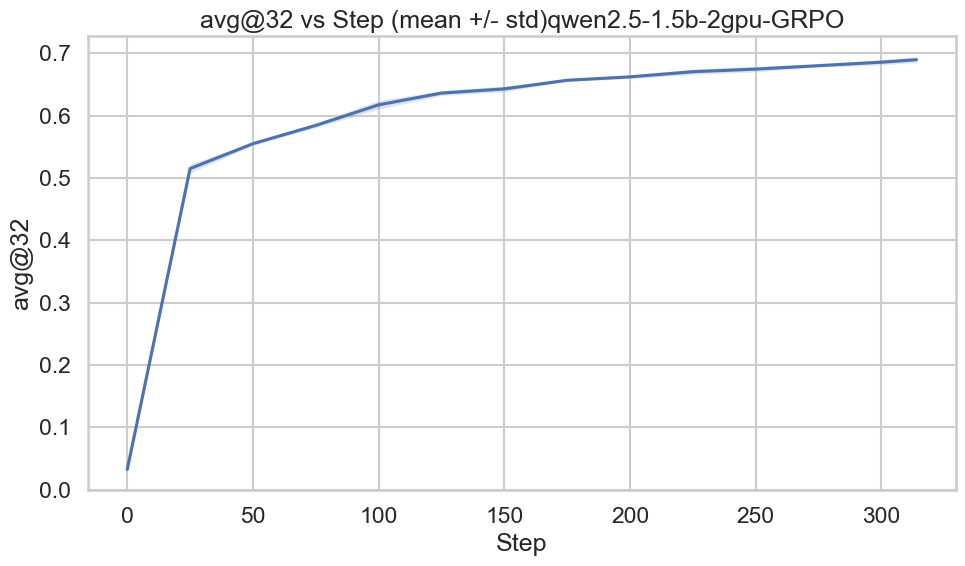

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO.png


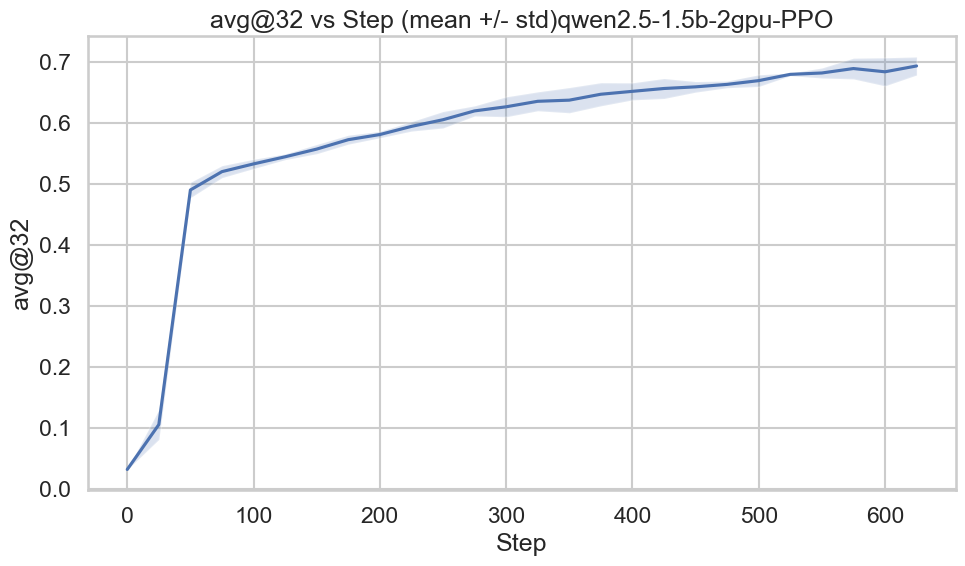

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-2.png


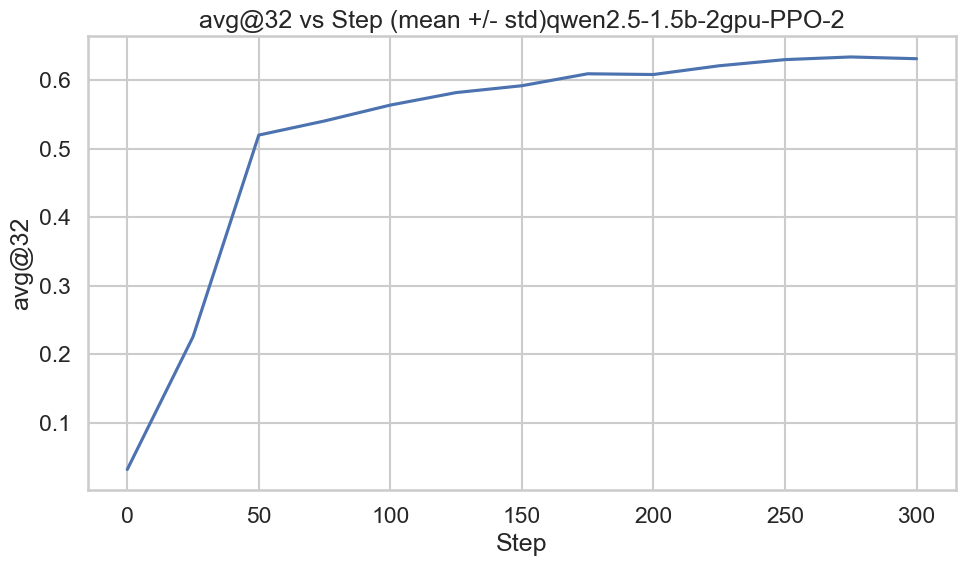

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-8.png


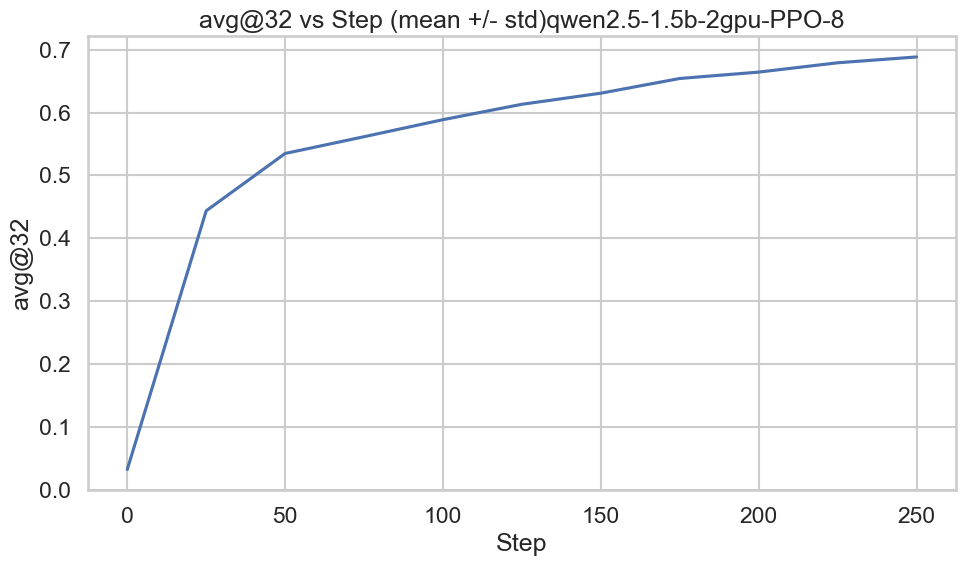

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-C51.png


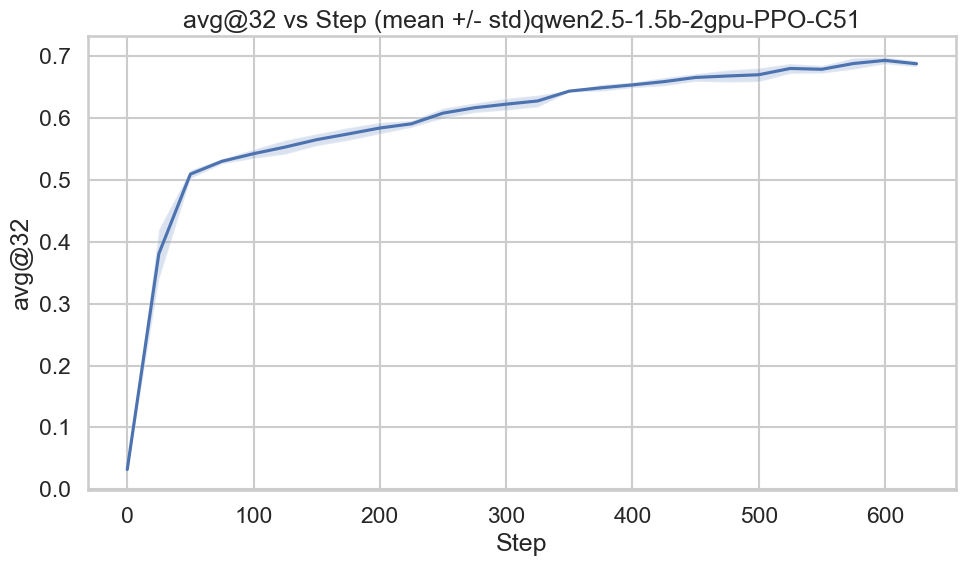

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-QRDQN.png


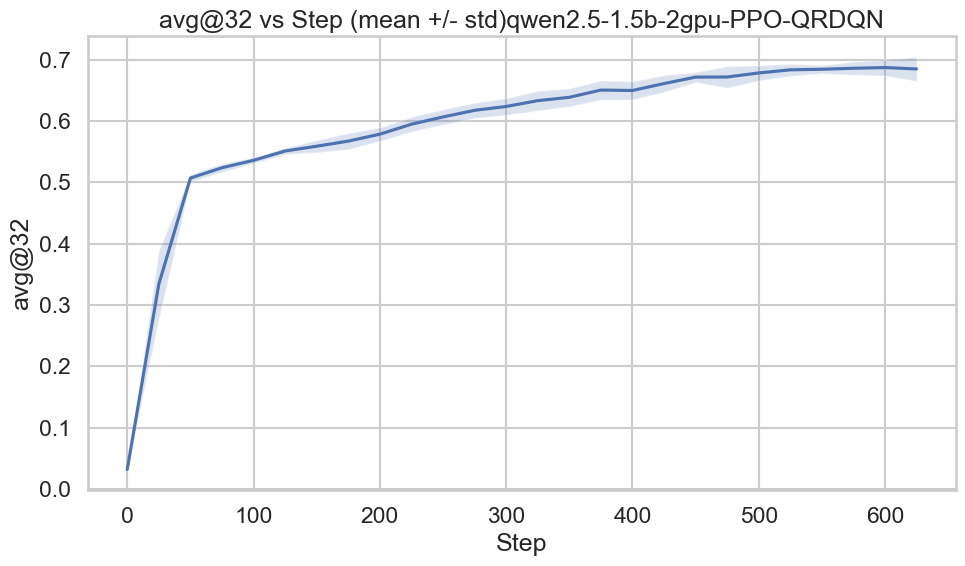

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-iqn.png


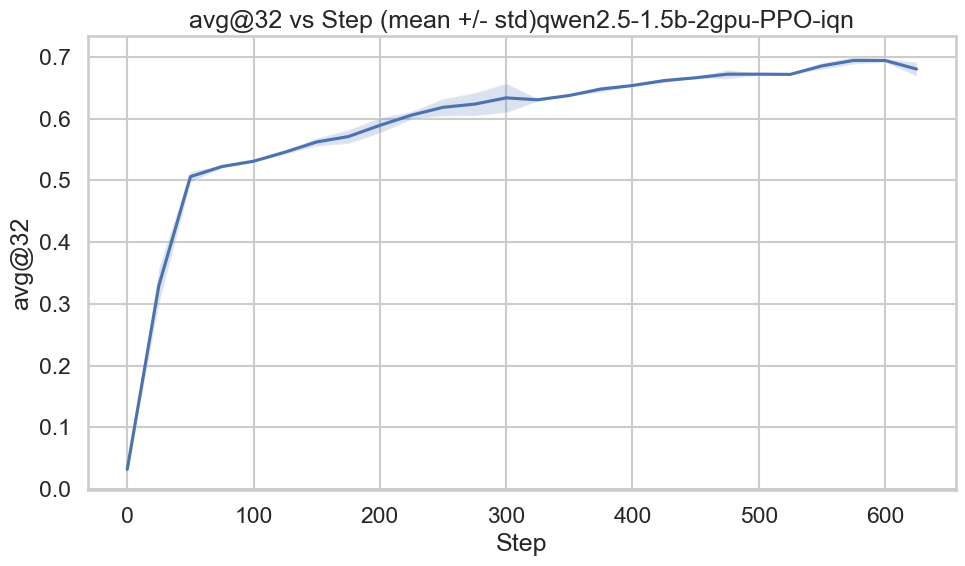

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1.png


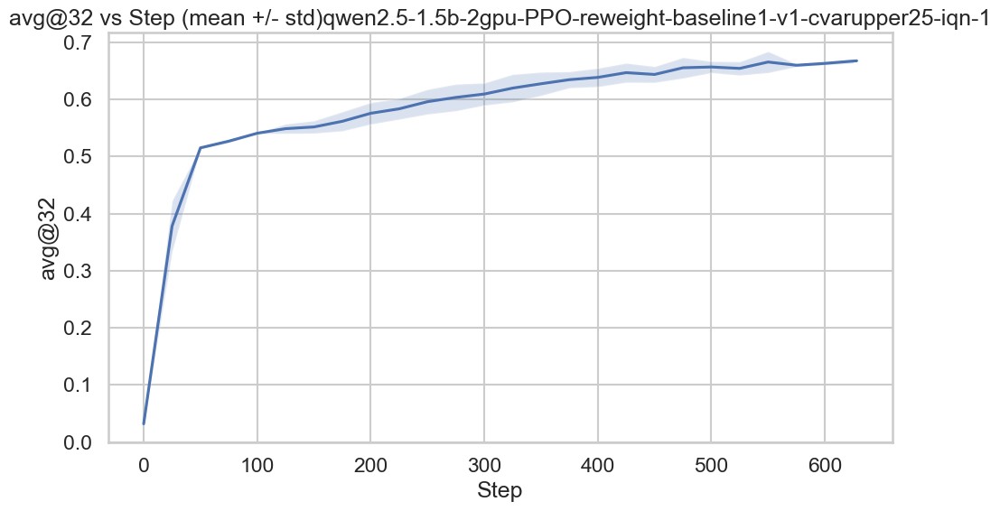

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1.png


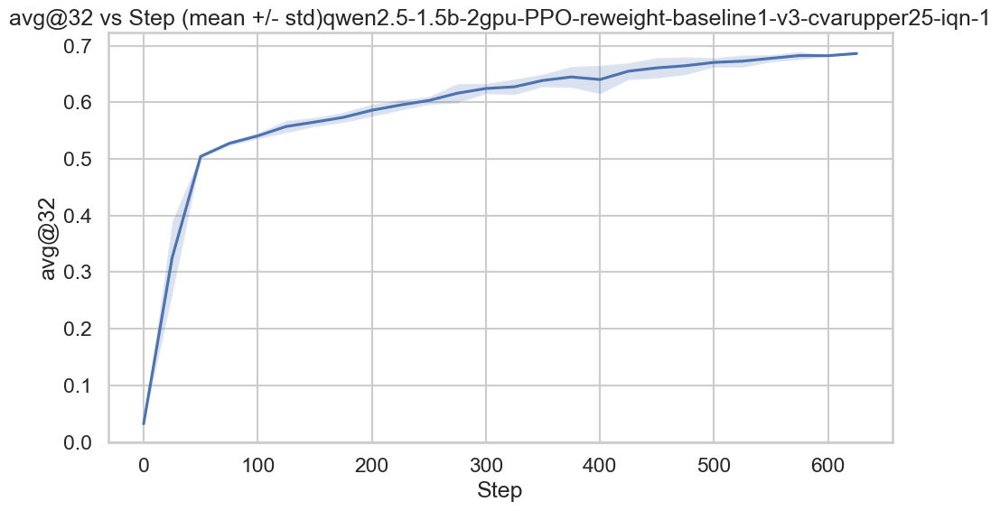

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8.png


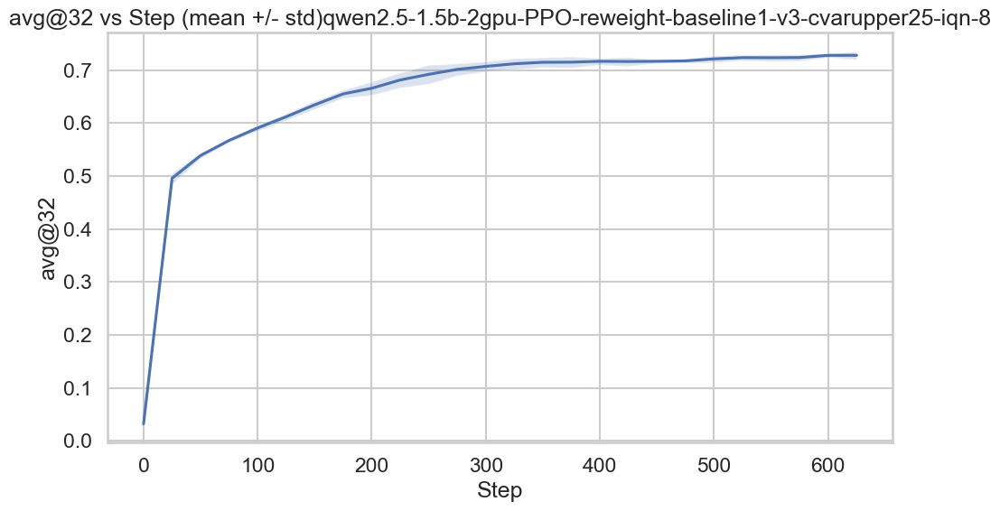

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn.png


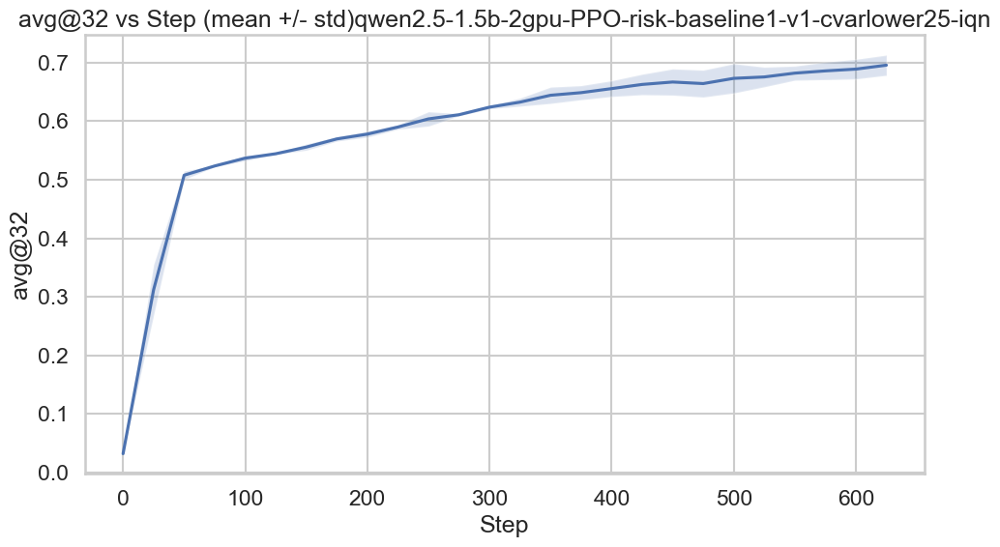

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn.png


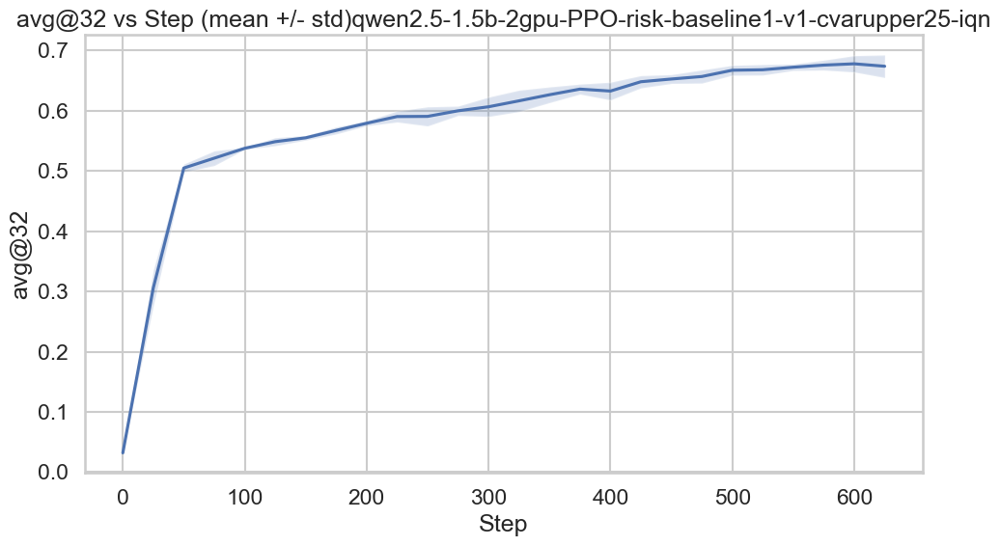

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1.png


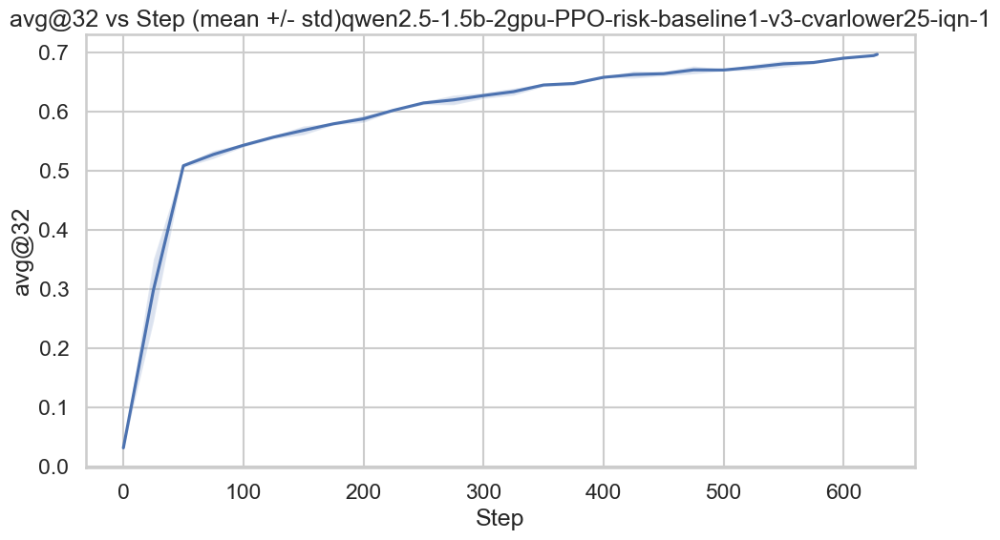

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8.png


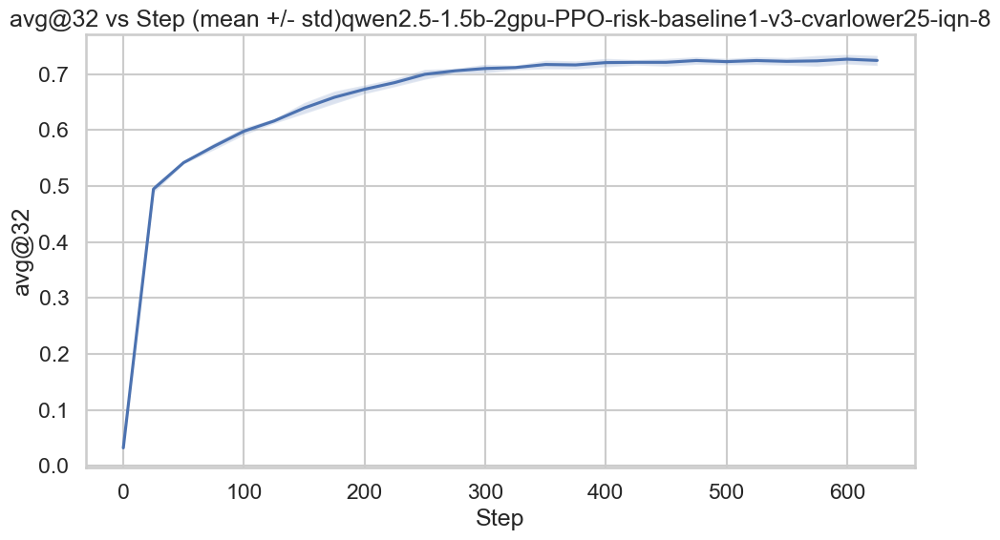

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1.png


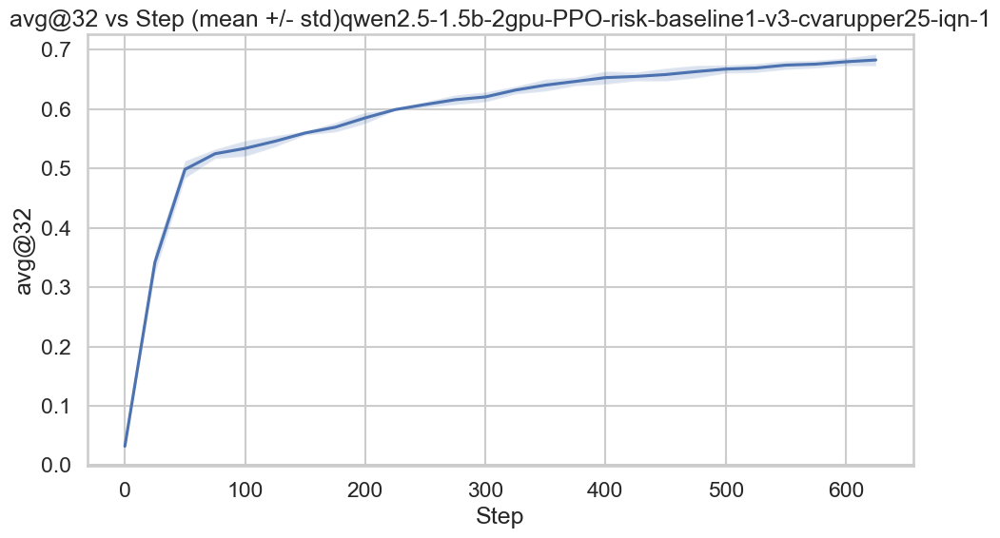

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8.png


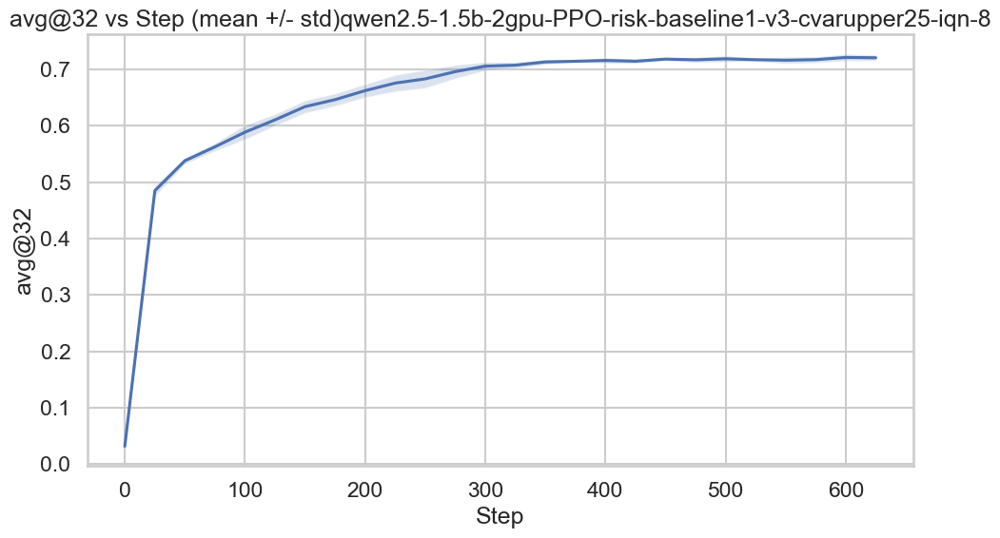

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8.png


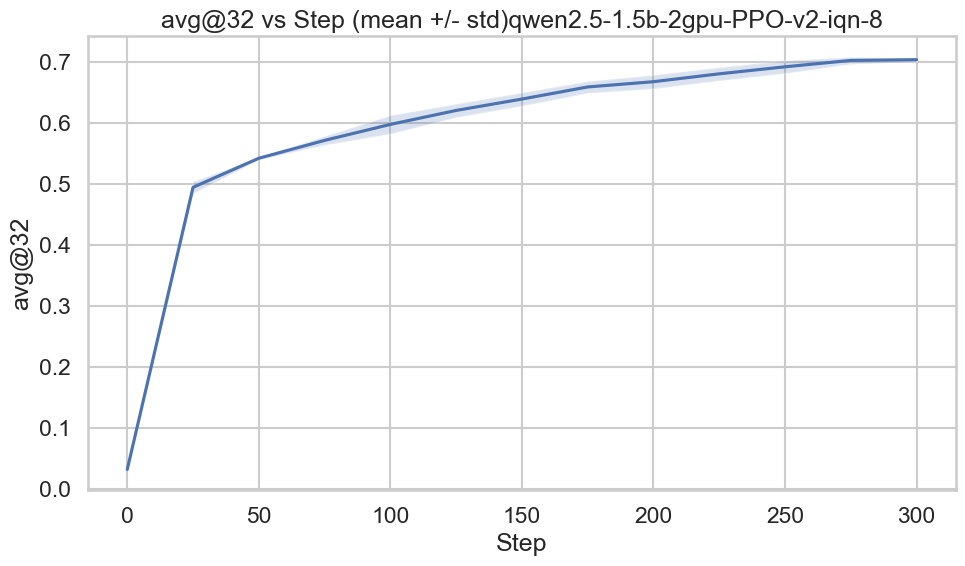

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/avg32_mean_std_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8.png


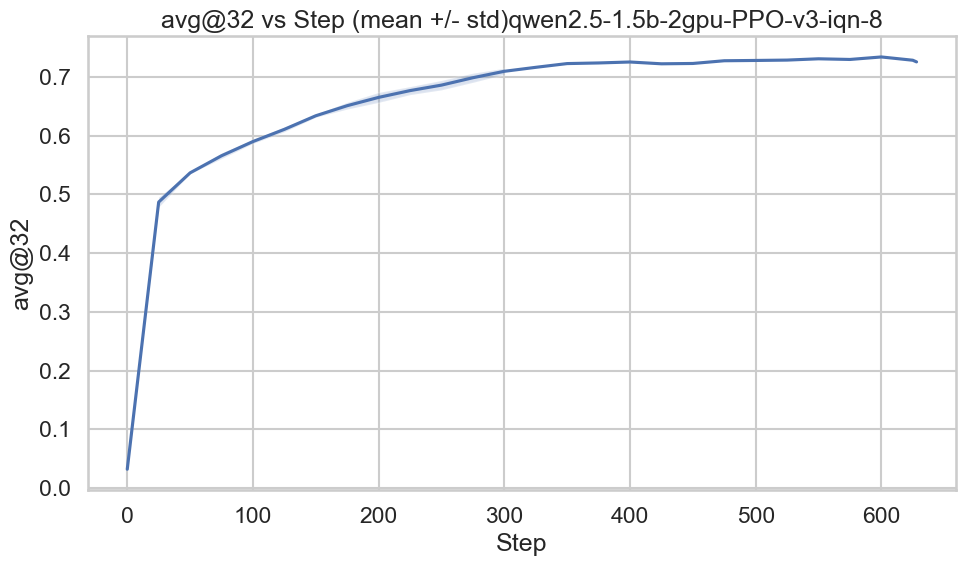

In [ ]:
# Plot avg@32 mean+std over steps per algorithm
agg = mean_std(combined, ["algorithm", "Step"], "avg@32")

for algo, df in agg.groupby("algorithm"):
    plt.figure()
    plt.plot(df["Step"], df["mean"], label=algo)
    plt.fill_between(df["Step"], df["mean"] - df["std"], df["mean"] + df["std"], alpha=0.2)
    plt.title(f"avg@32 vs Step (mean +/- std){algo}")
    plt.xlabel("Step")
    plt.ylabel("avg@32")
    savefig(f"avg32_mean_std_{algo}")

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-GRPO.png


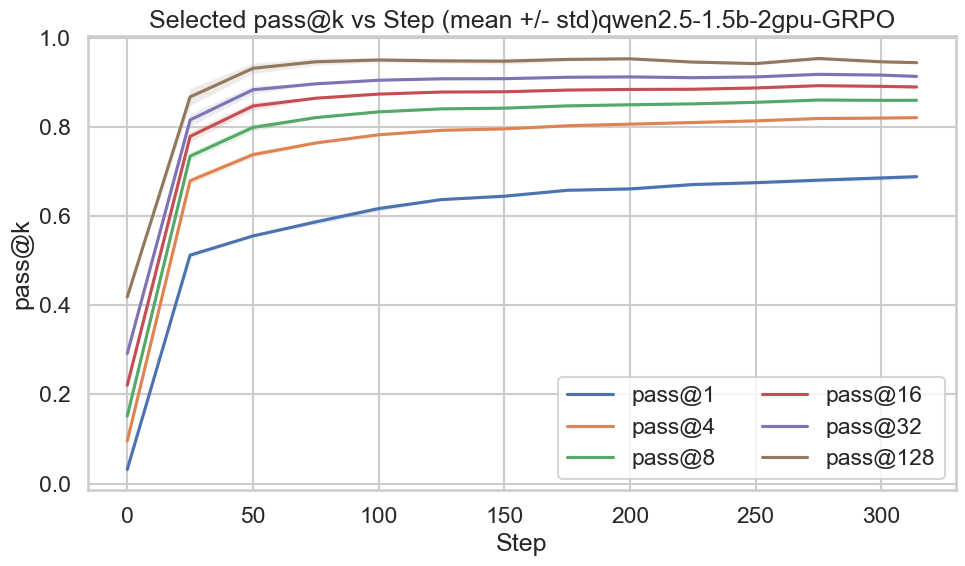

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO.png


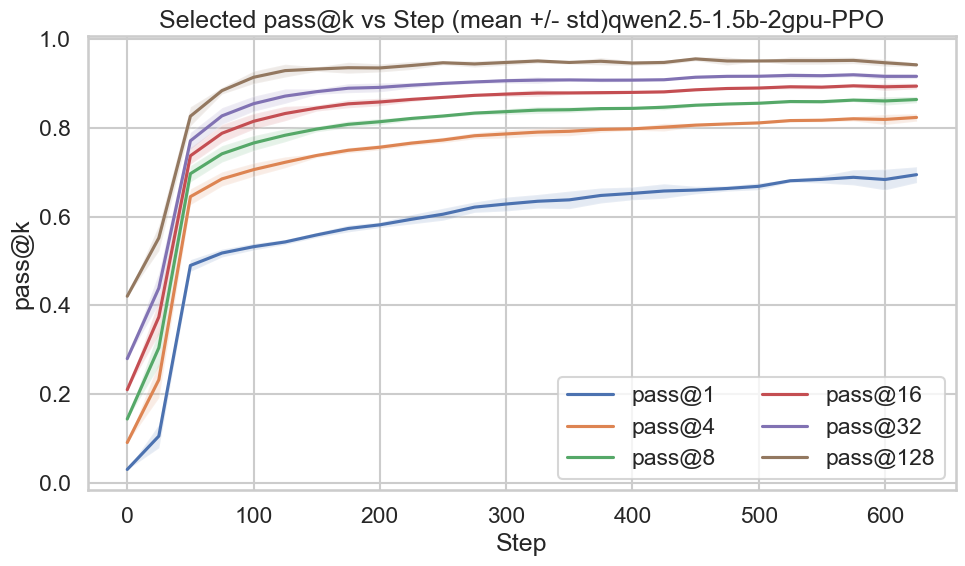

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-2.png


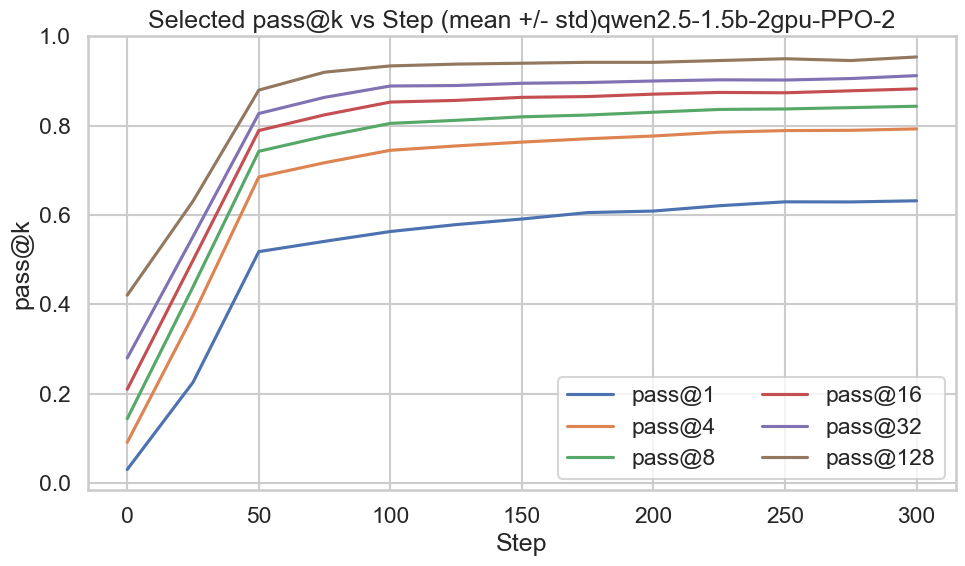

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-8.png


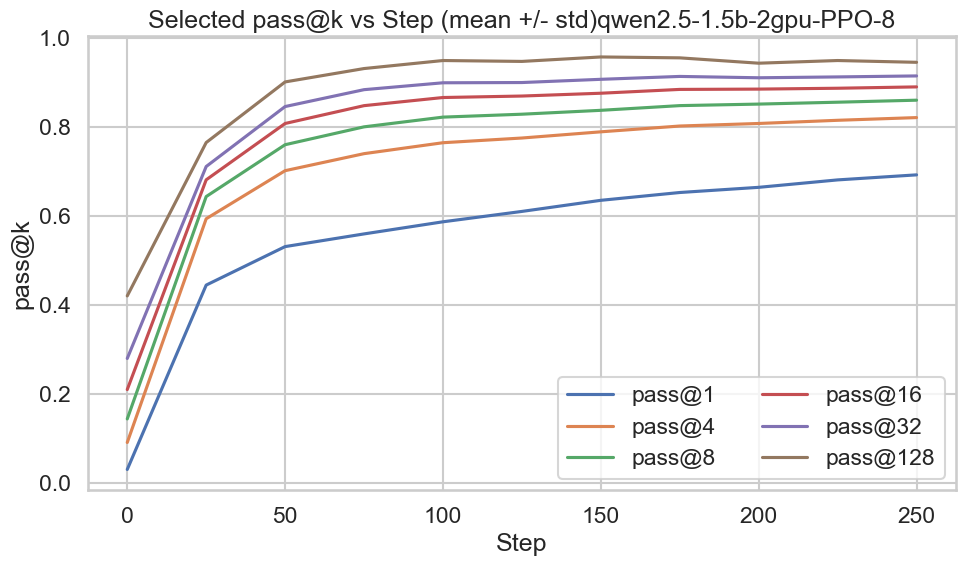

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-C51.png


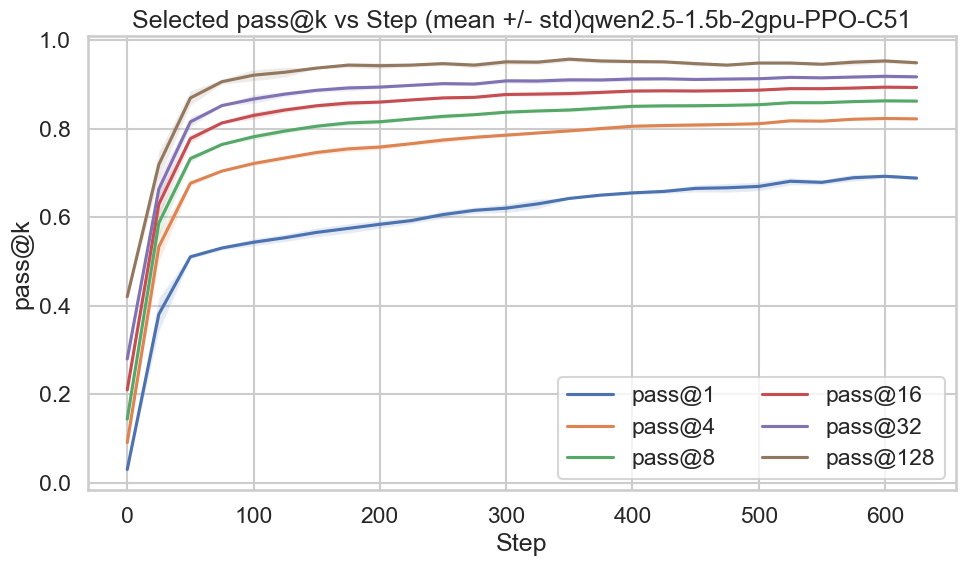

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-QRDQN.png


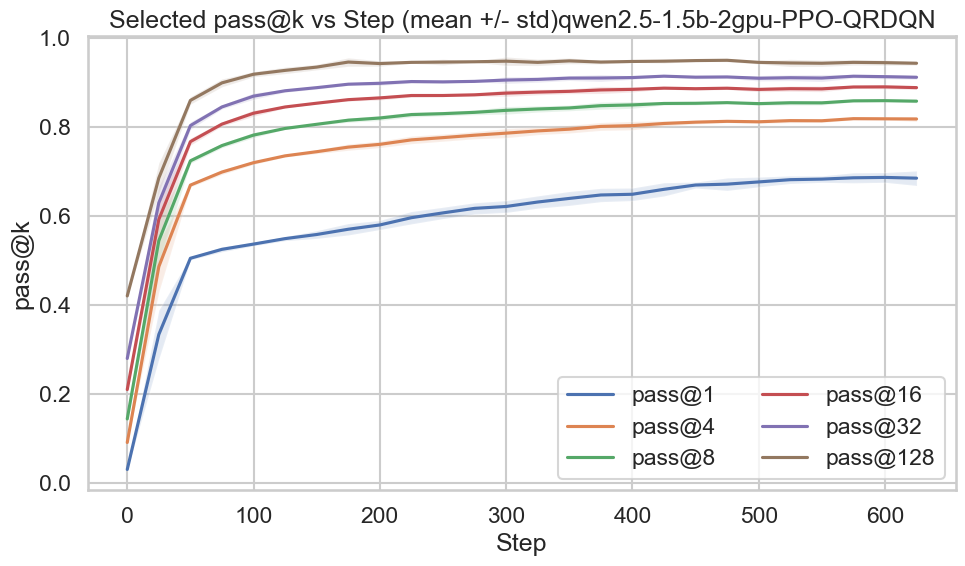

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-iqn.png


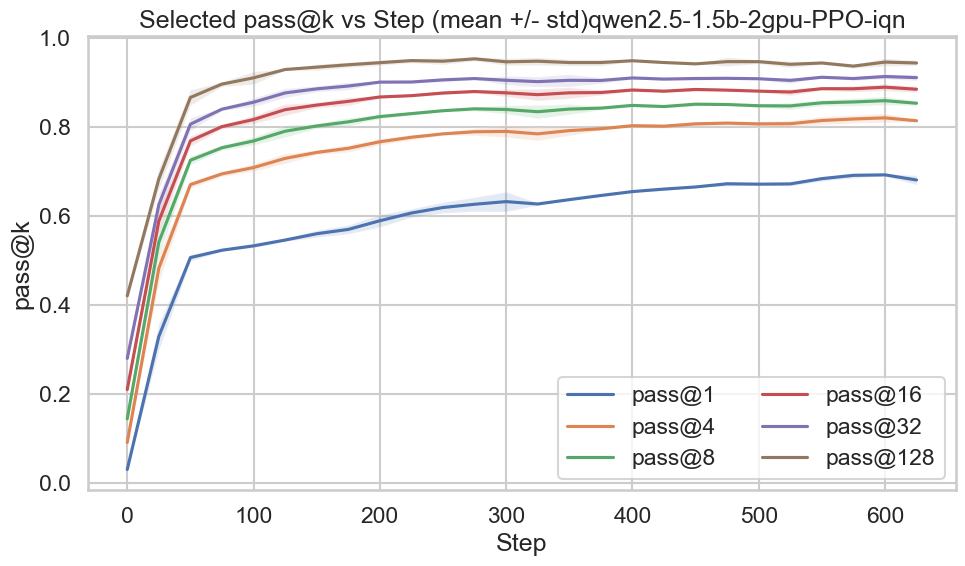

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1.png


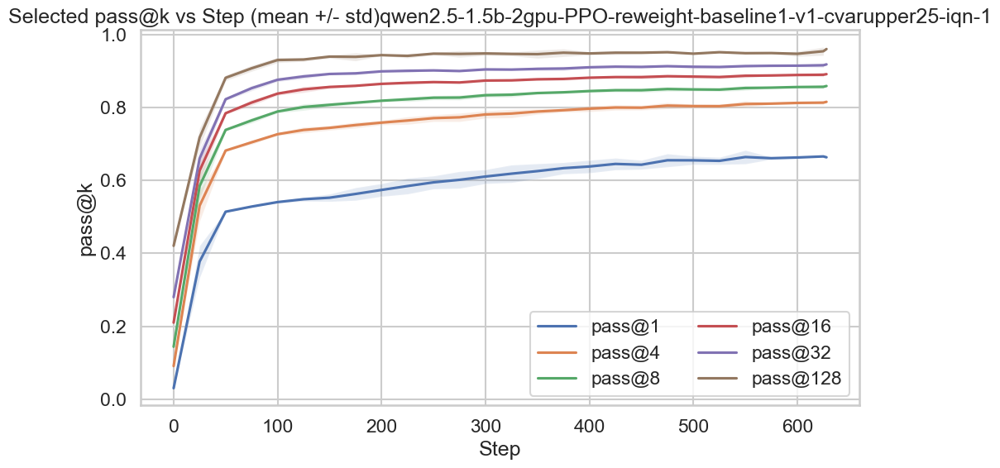

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1.png


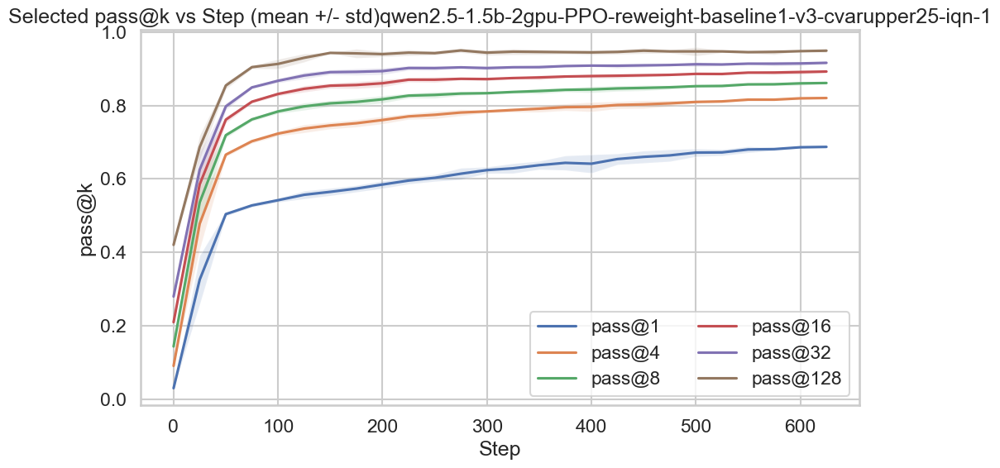

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8.png


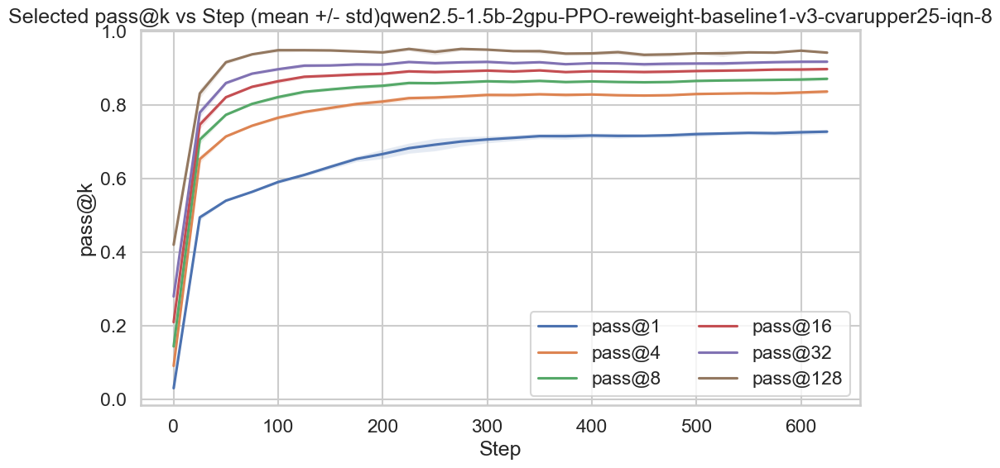

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn.png


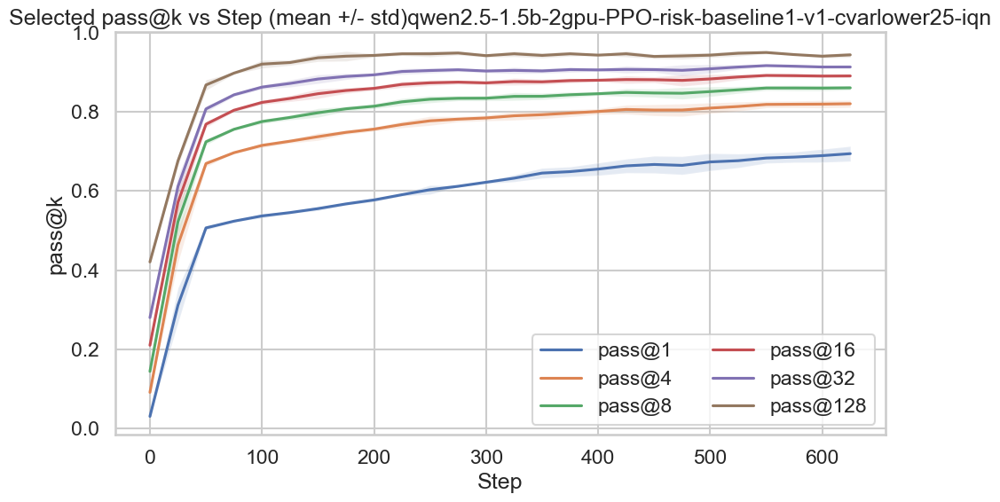

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn.png


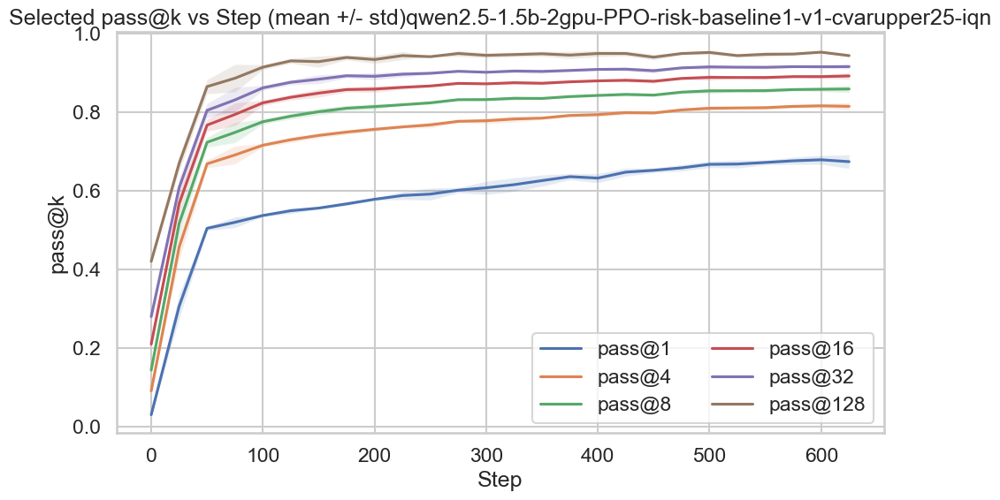

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1.png


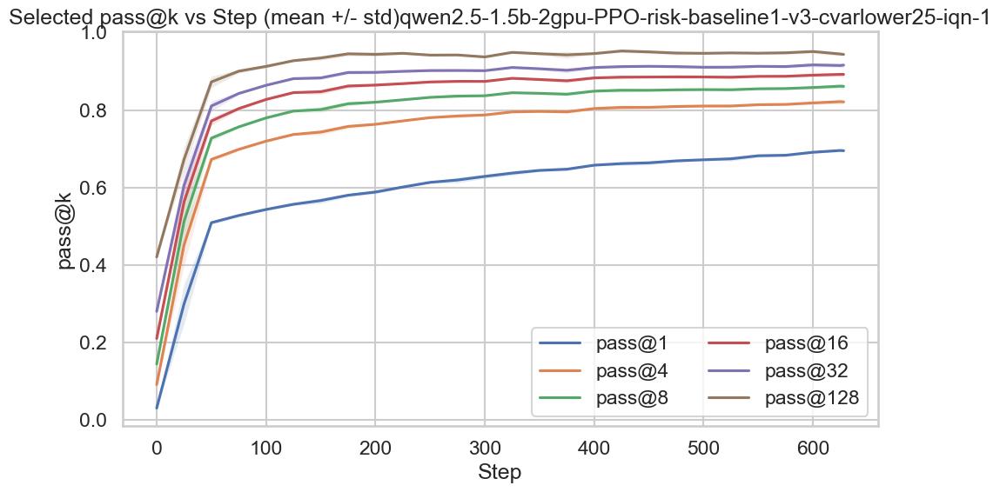

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8.png


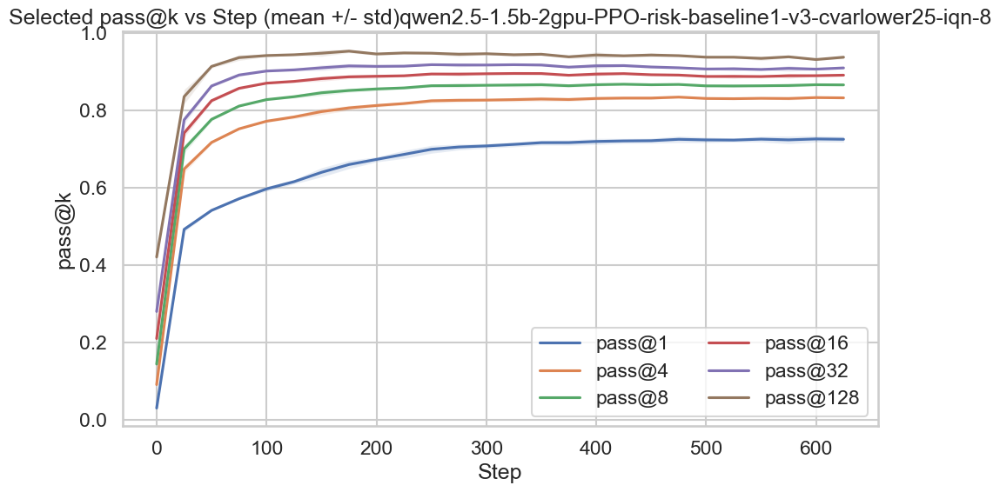

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1.png


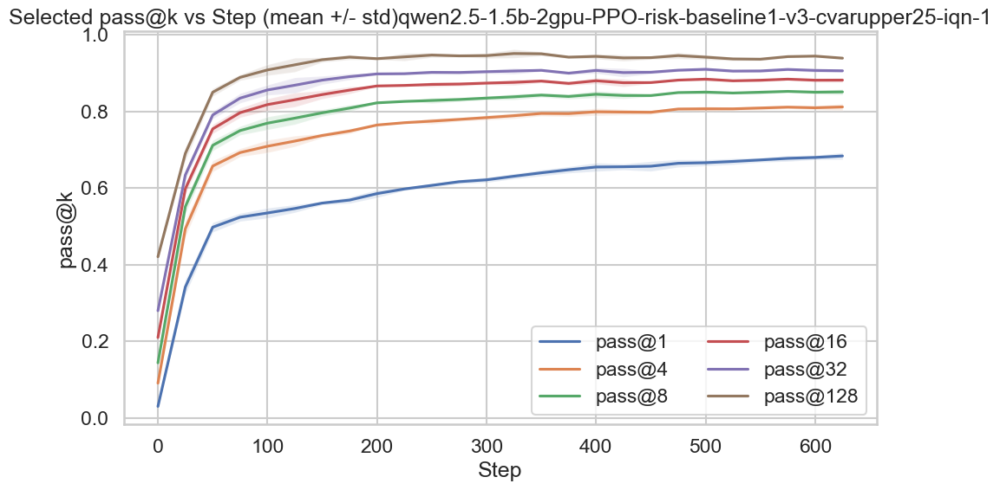

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8.png


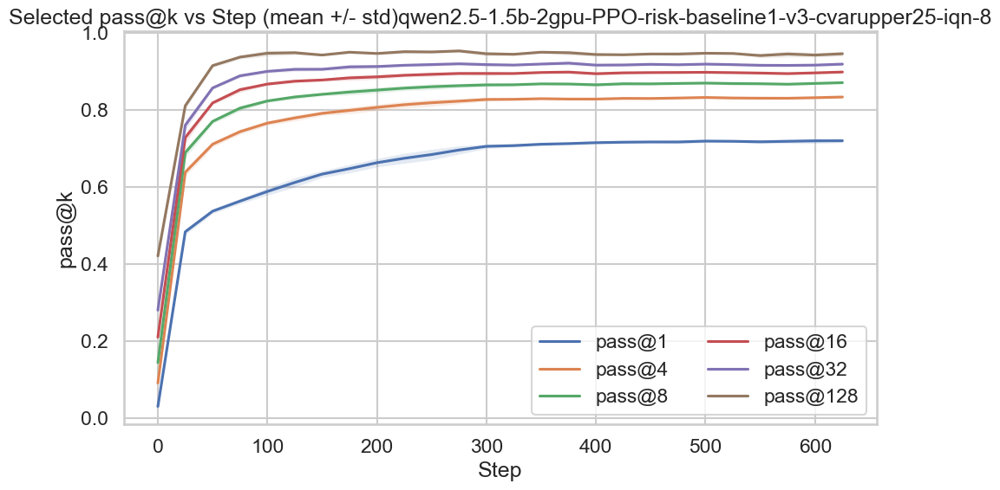

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8.png


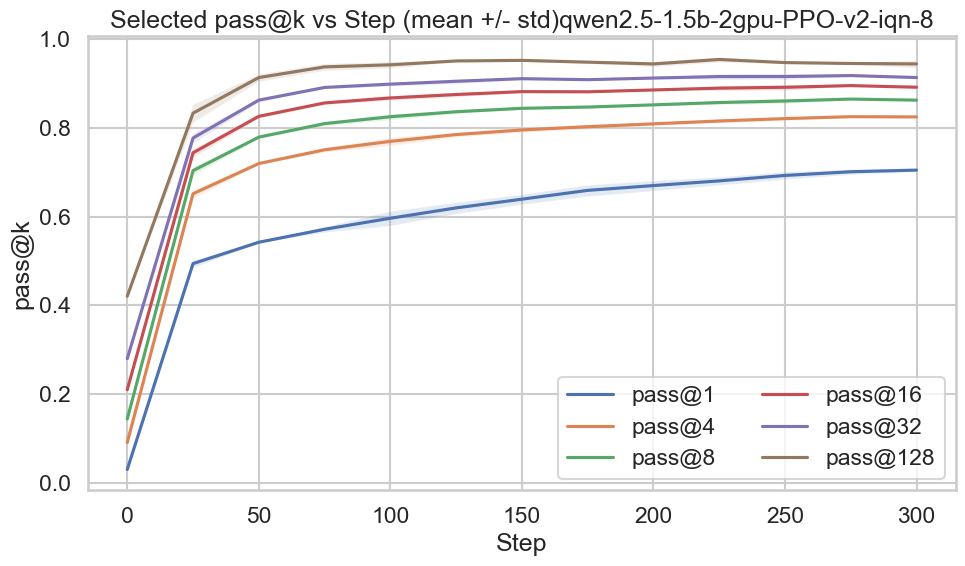

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_selected_mean_std_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8.png


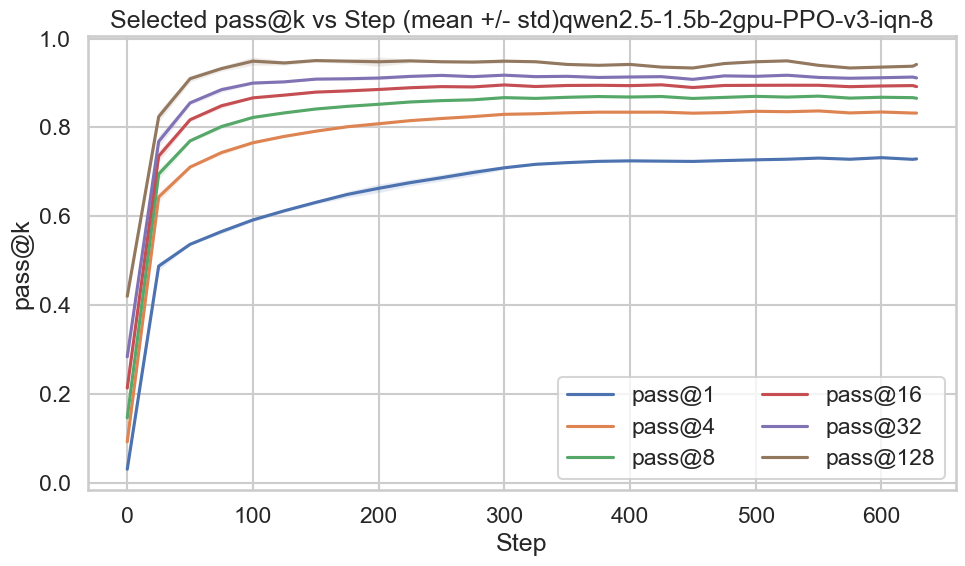

In [ ]:
# Plot selected pass@k mean+std over steps per algorithm
selected_k = [1, 4, 8, 16, 32, 128]
selected_cols = [f"pass@{k}" for k in selected_k if f"pass@{k}" in pass_cols]

for algo, df_algo in combined.groupby("algorithm"):
    plt.figure()
    for col in selected_cols:
        agg = mean_std(df_algo, ["Step"], col)
        plt.plot(agg["Step"], agg["mean"], label=col)
        plt.fill_between(agg["Step"], agg["mean"] - agg["std"], agg["mean"] + agg["std"], alpha=0.15)
    plt.title(f"Selected pass@k vs Step (mean +/- std){algo}")
    plt.xlabel("Step")
    plt.ylabel("pass@k")
    plt.legend(ncol=2)
    savefig(f"passk_selected_mean_std_{algo}")

## pass@k vs k (for specific steps)

We plot mean over seeds at fixed steps with k on the x-axis.


In [ ]:
# Choose representative steps: min, median, max
steps = sorted(combined["Step"].dropna().unique())
if steps:
    step_min = steps[0]
    step_med = steps[len(steps)//2]
    step_max = steps[-1]
    step_choices = [step_min, step_med, step_max]
else:
    step_choices = []

step_choices

[np.int64(0), np.int64(325), np.int64(628)]

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-GRPO_step0.png


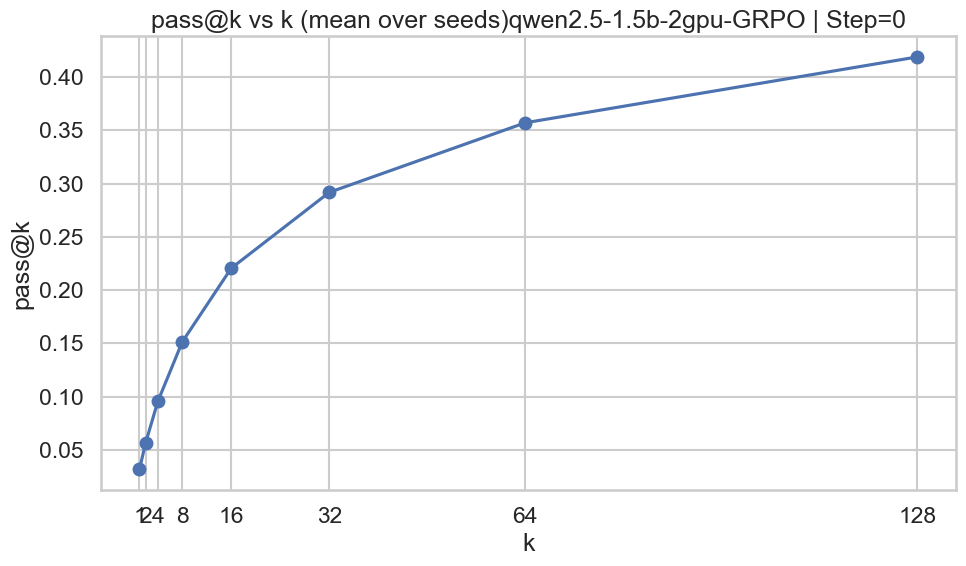

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO_step0.png


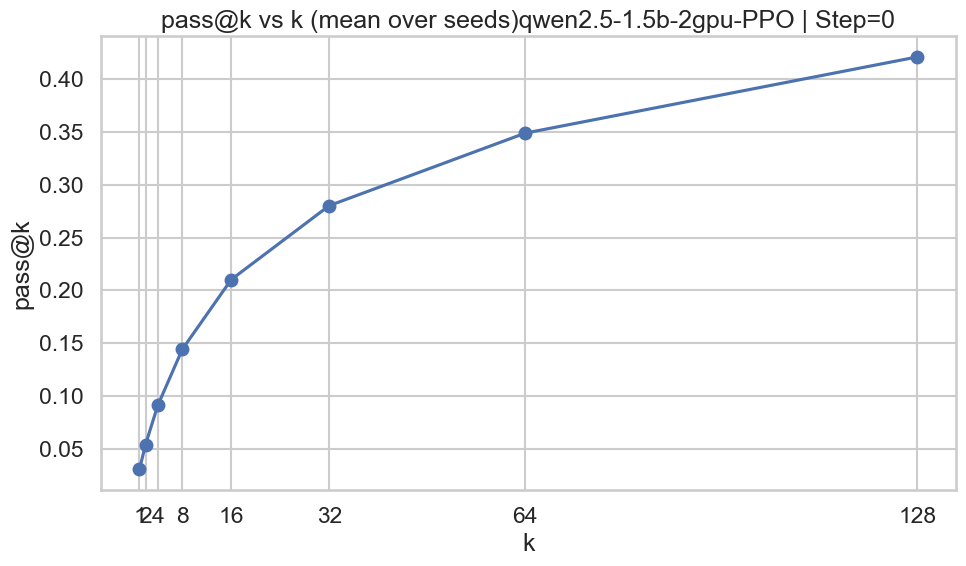

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO_step325.png


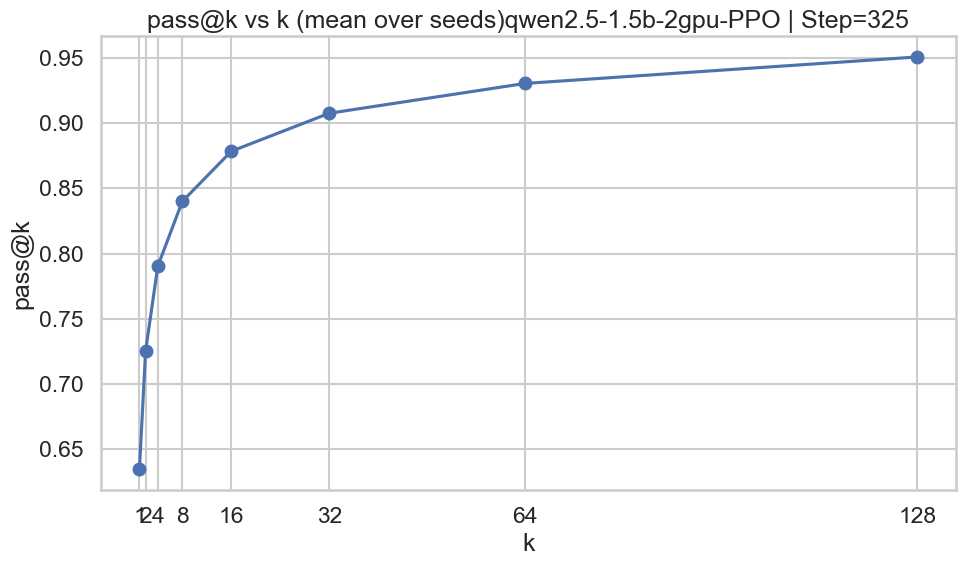

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-2_step0.png


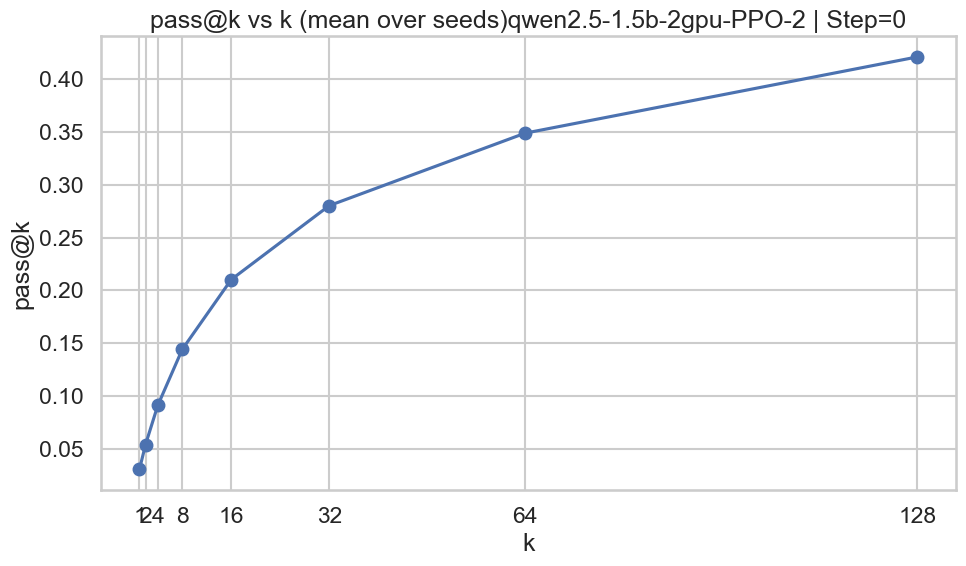

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-8_step0.png


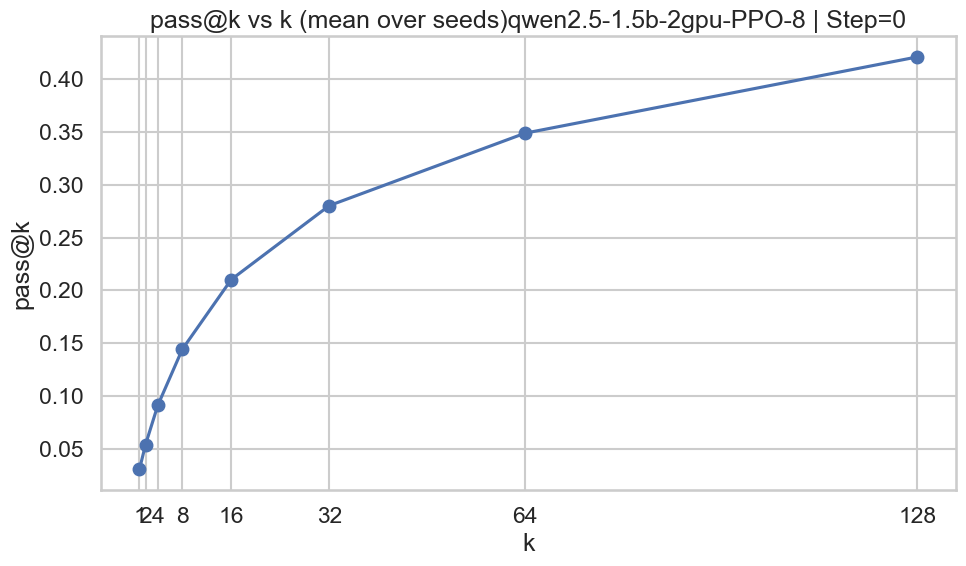

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-C51_step0.png


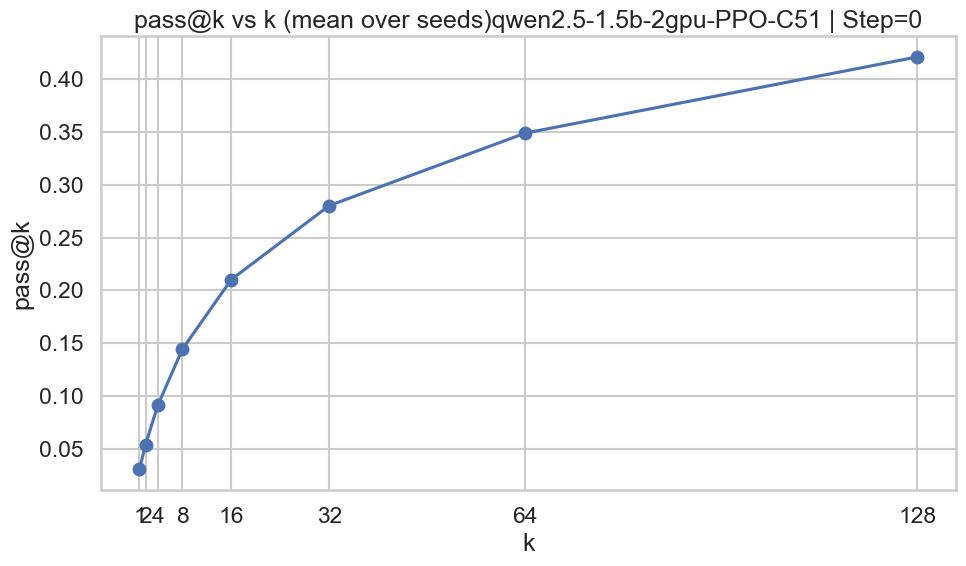

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-C51_step325.png


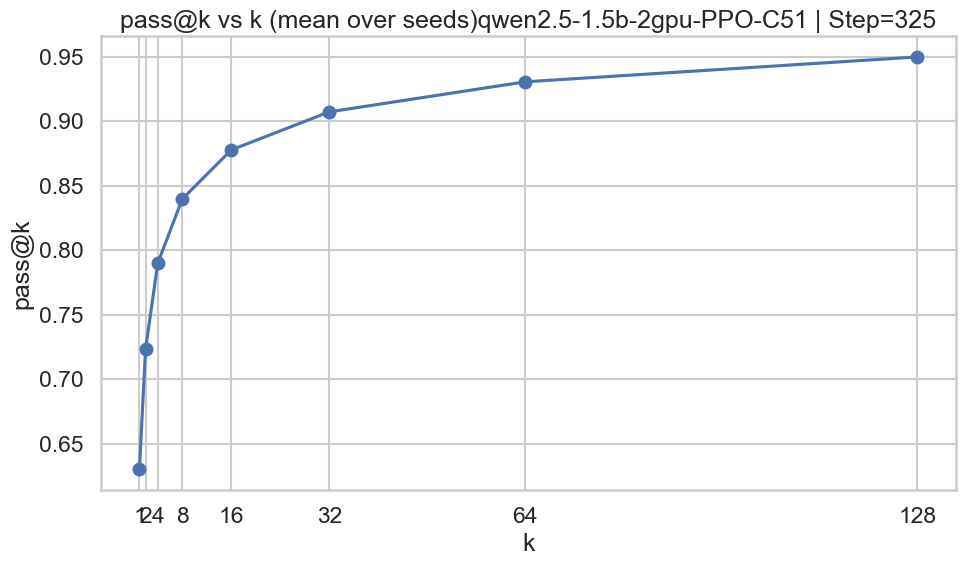

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-QRDQN_step0.png


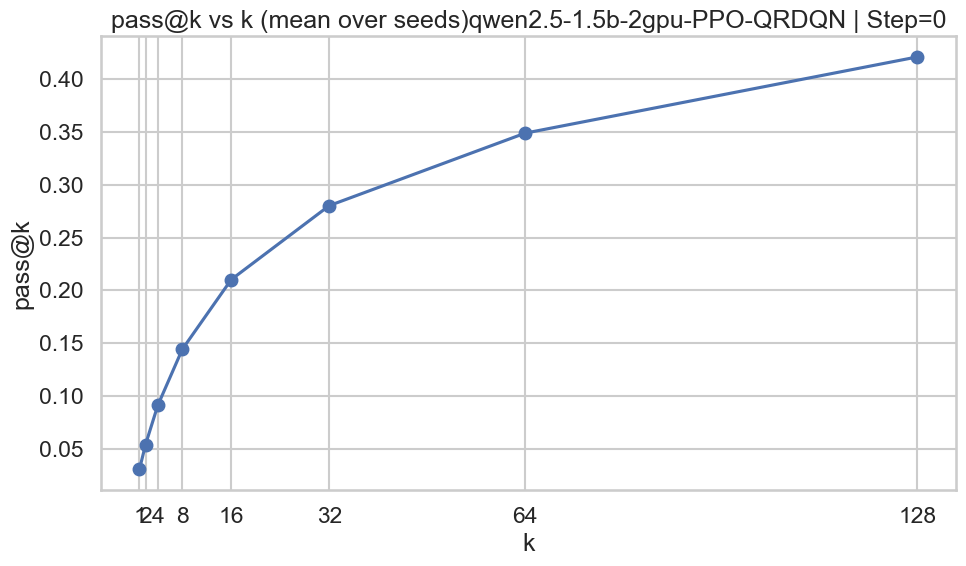

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-QRDQN_step325.png


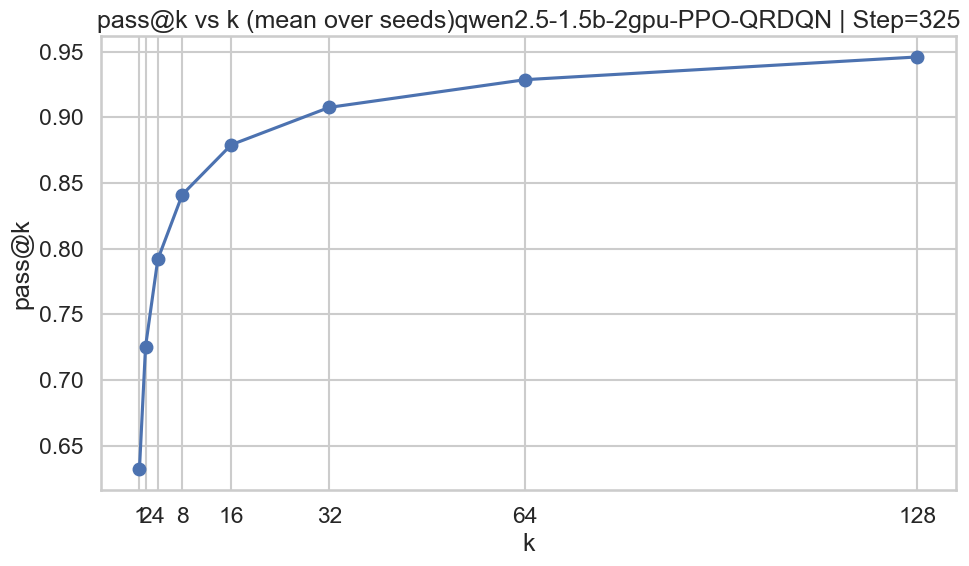

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-iqn_step0.png


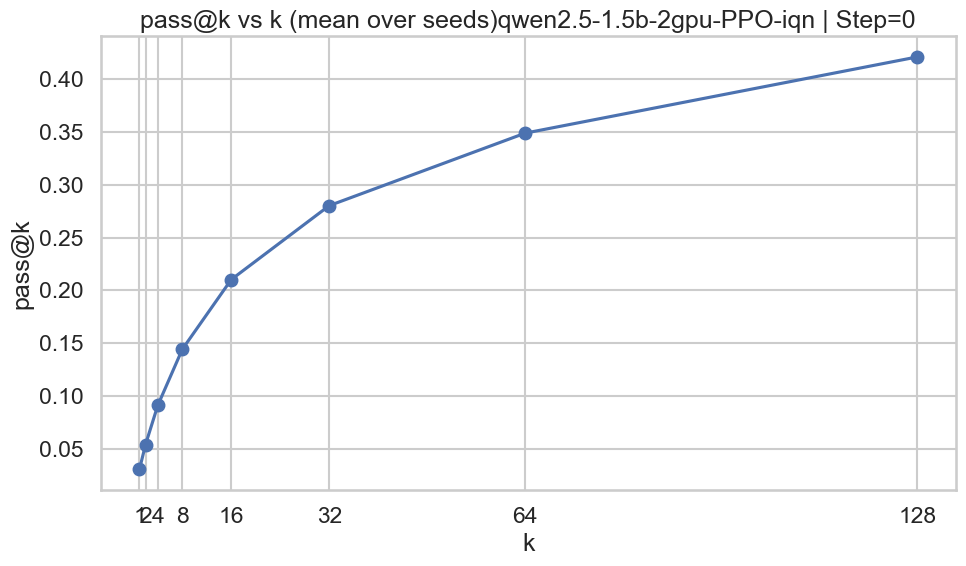

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-iqn_step325.png


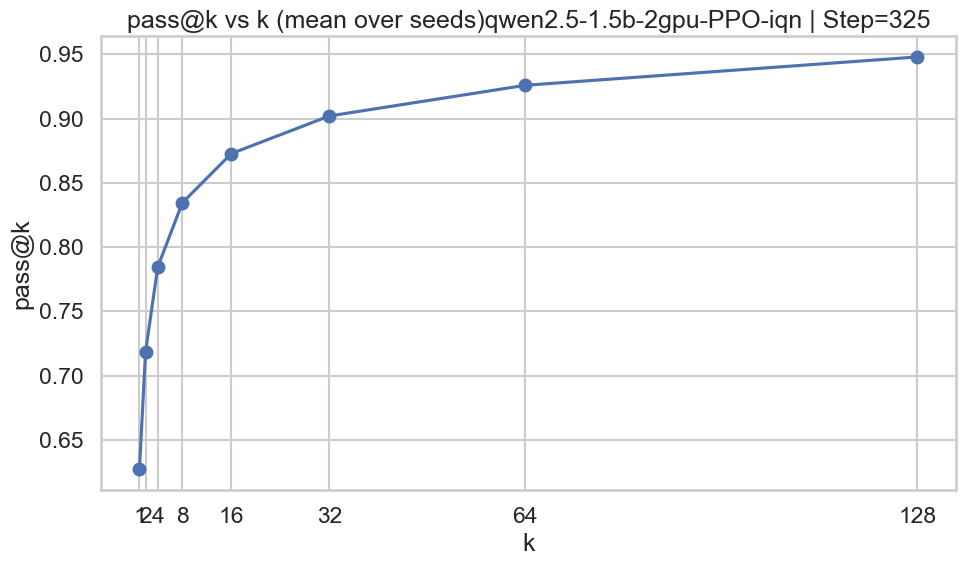

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1_step0.png


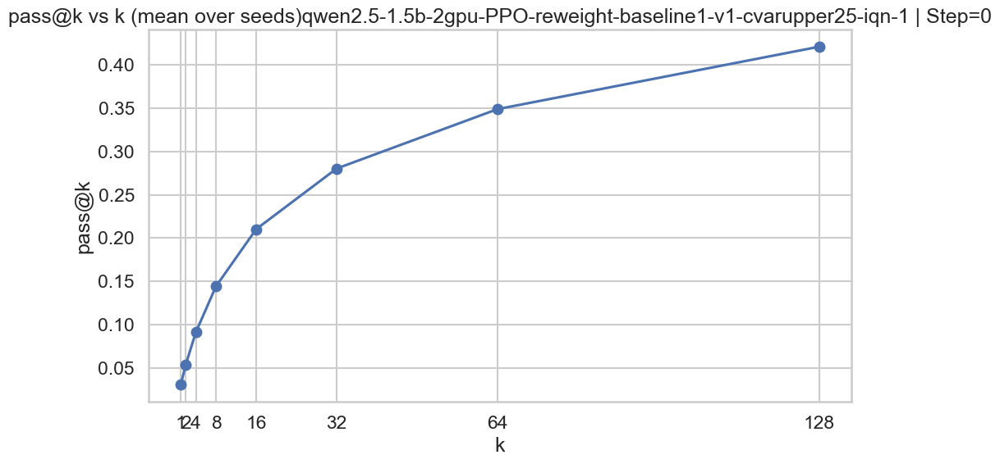

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1_step325.png


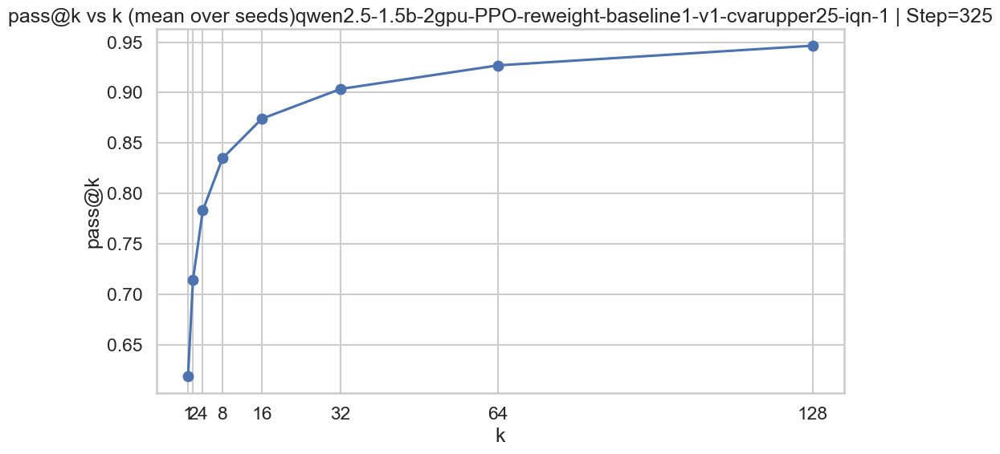

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1_step628.png


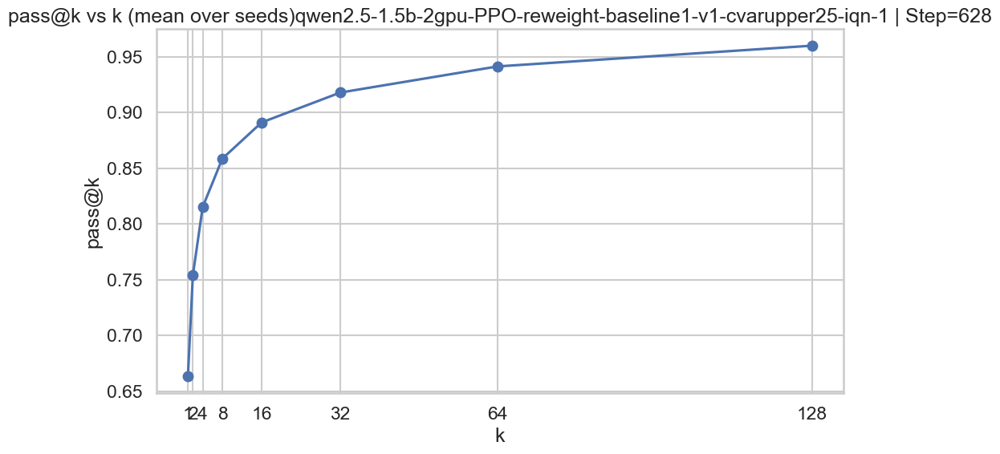

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1_step0.png


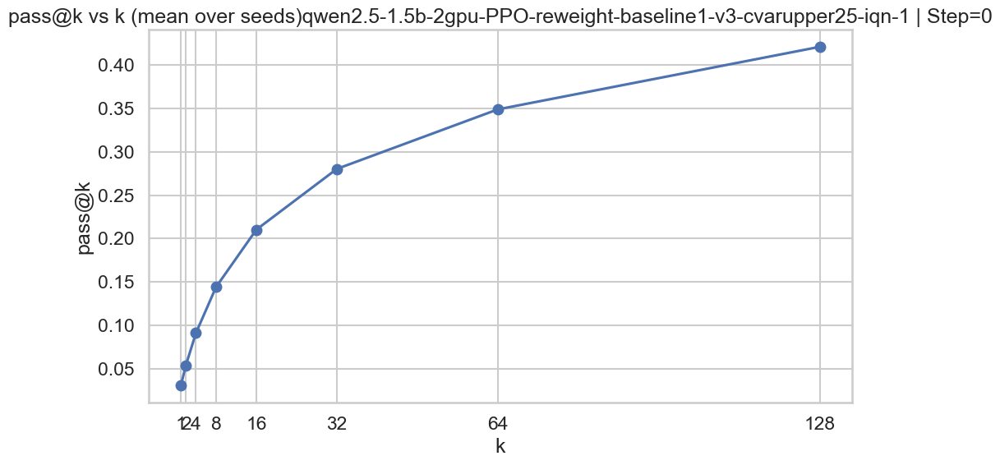

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1_step325.png


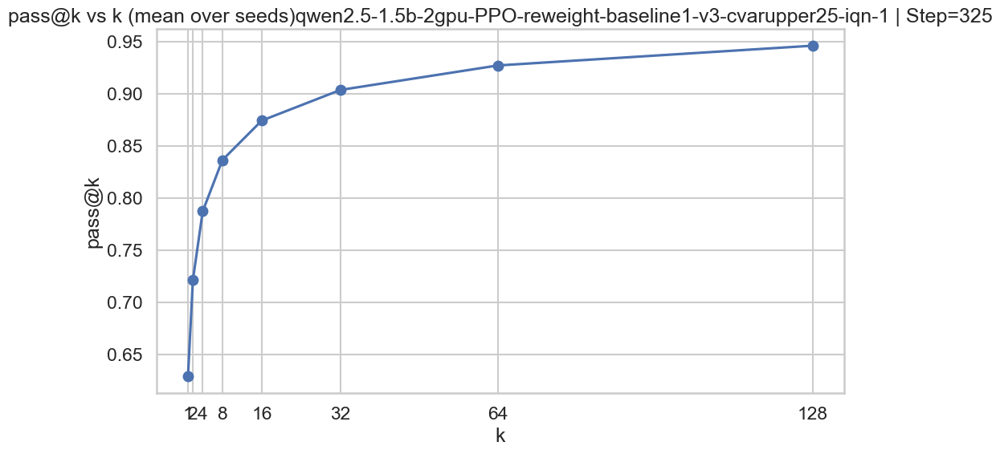

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8_step0.png


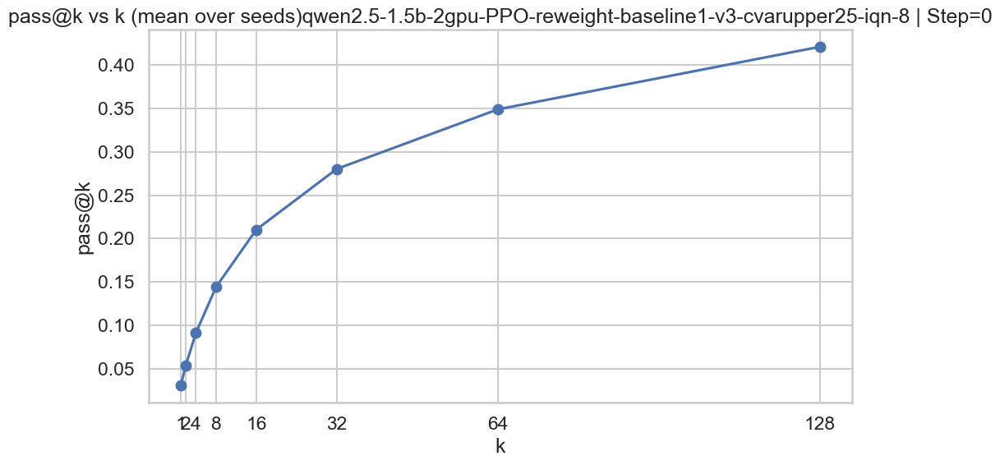

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8_step325.png


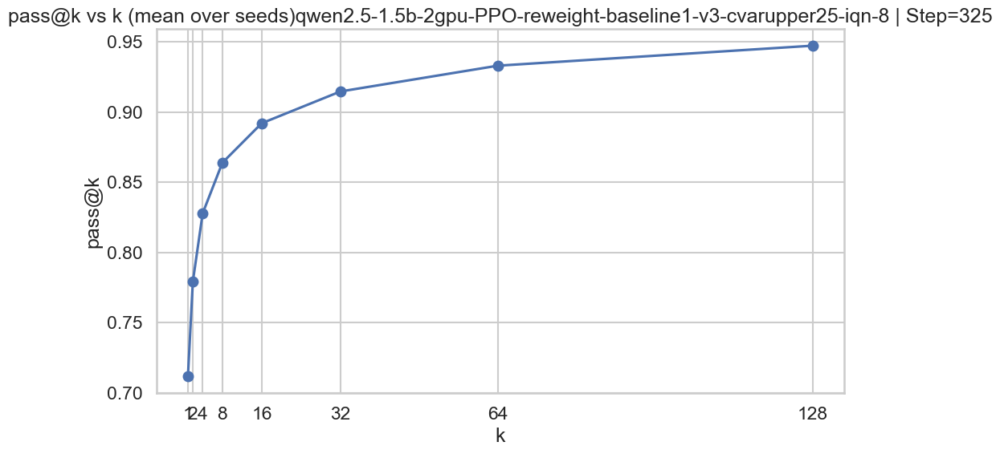

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn_step0.png


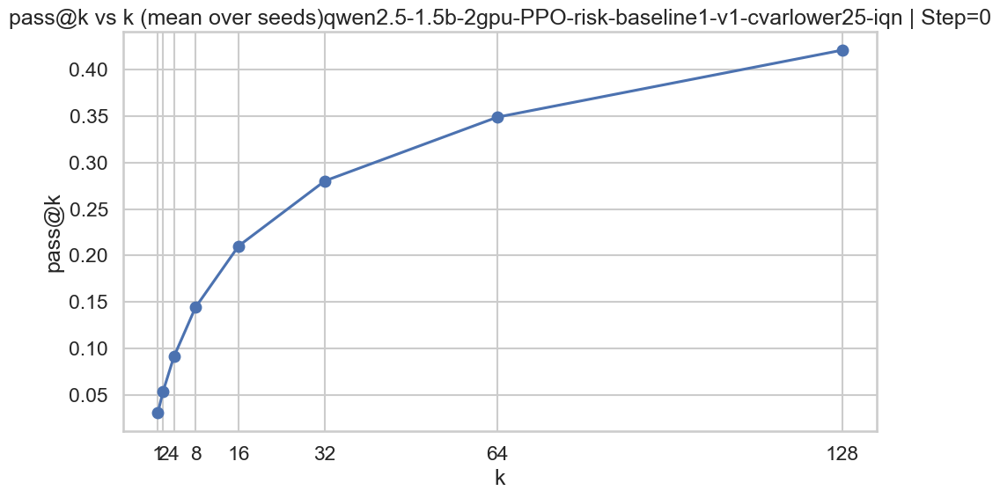

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn_step325.png


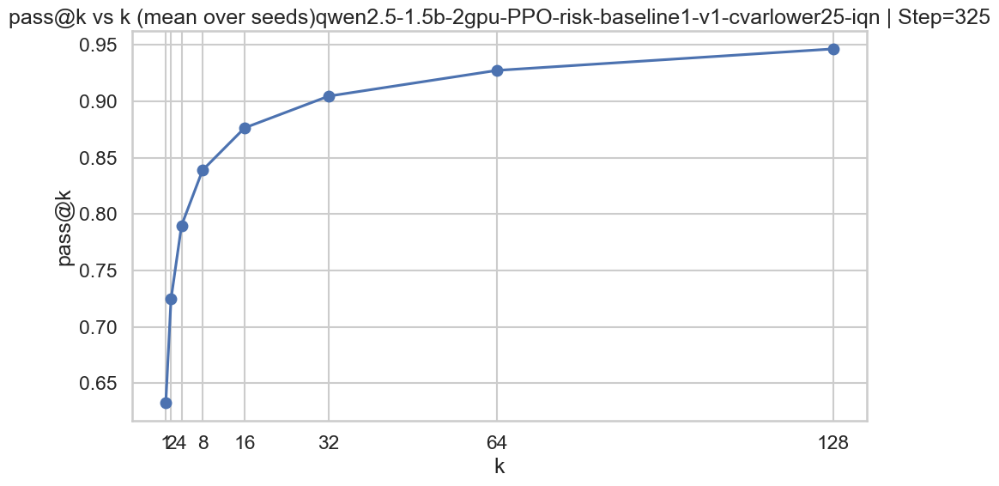

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn_step0.png


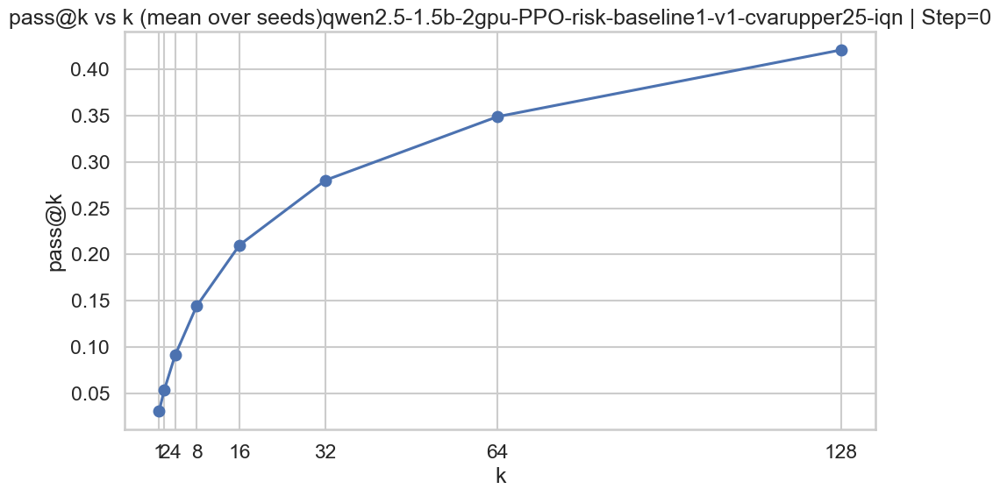

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn_step325.png


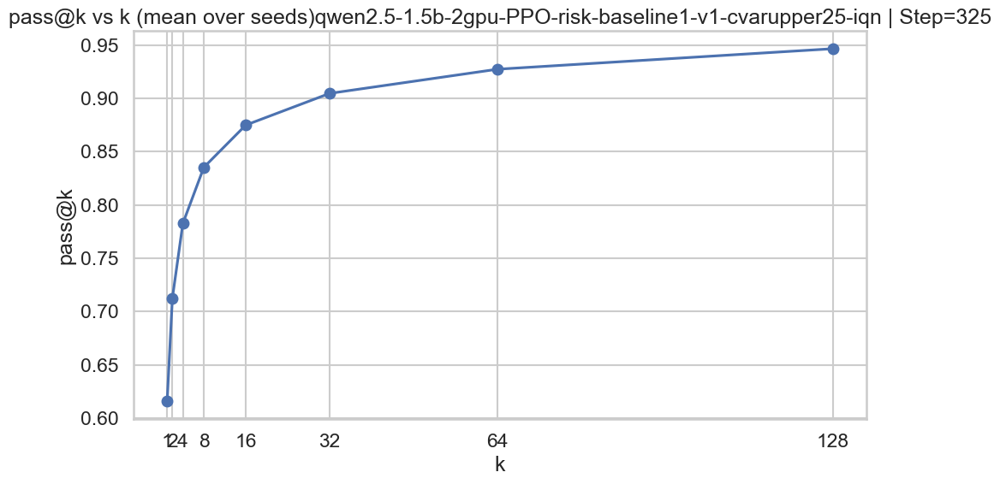

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1_step0.png


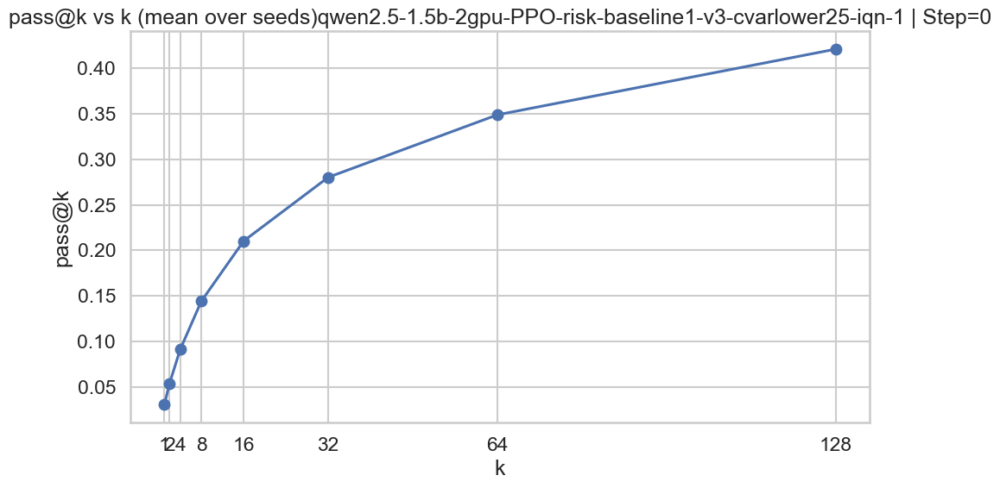

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1_step325.png


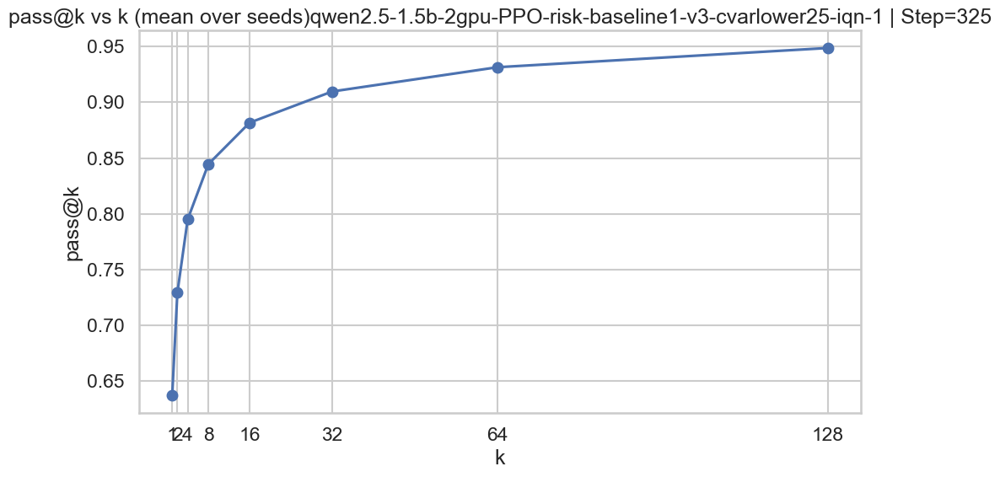

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1_step628.png


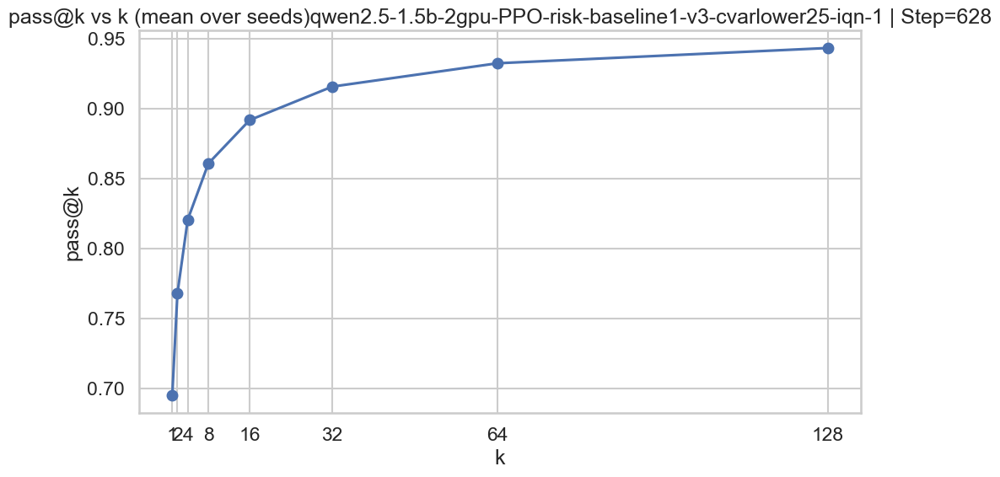

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8_step0.png


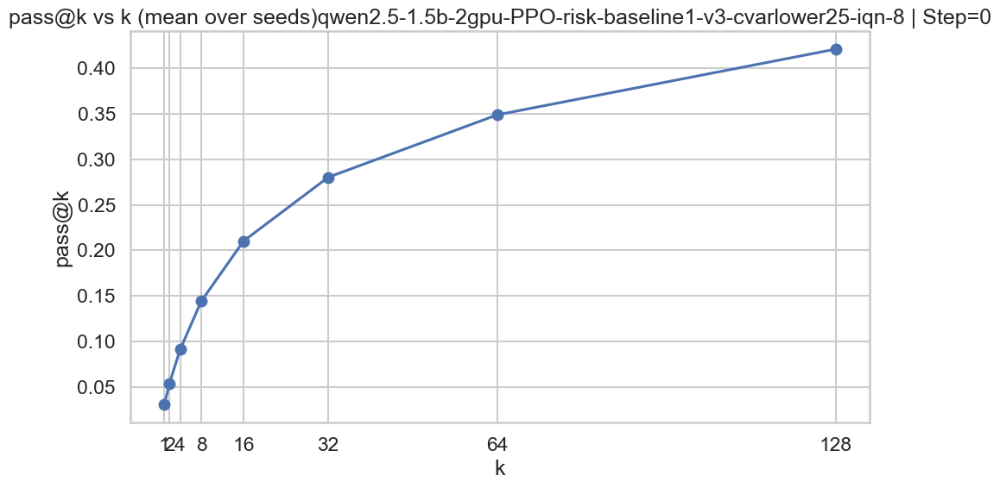

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8_step325.png


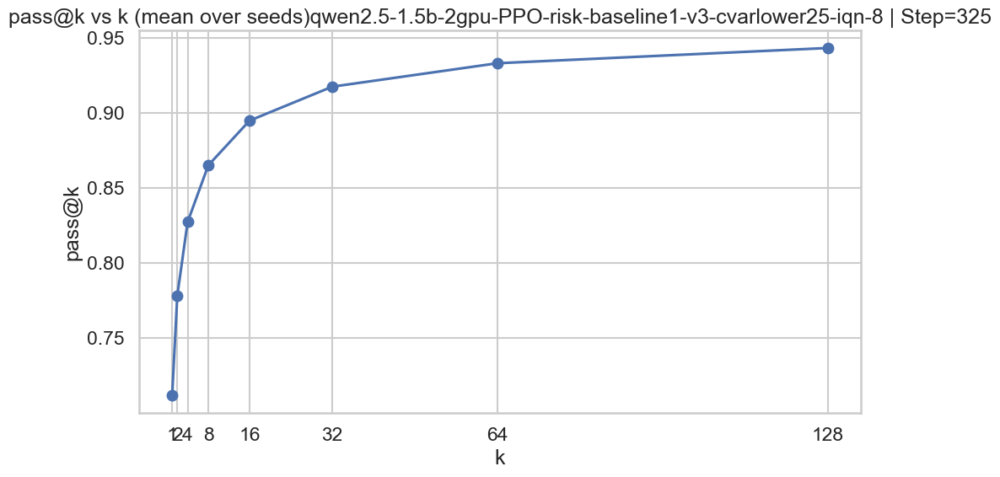

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1_step0.png


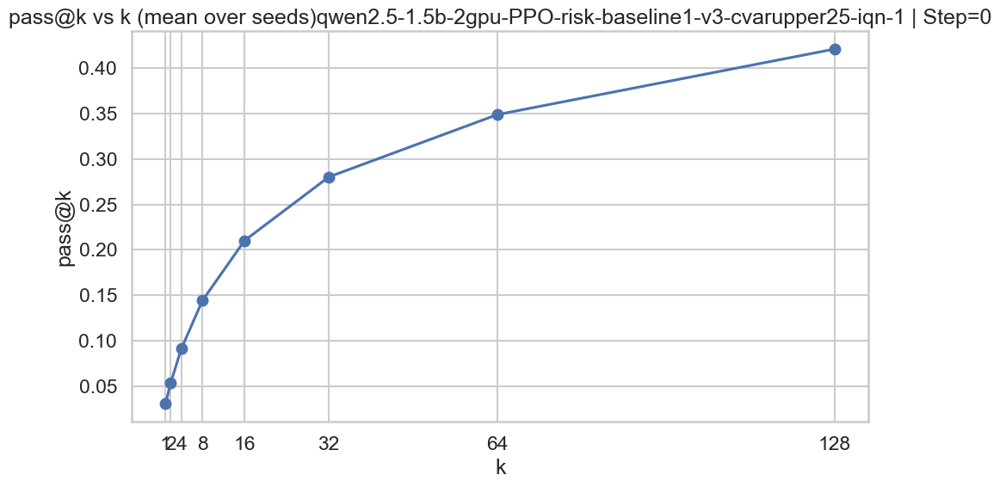

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1_step325.png


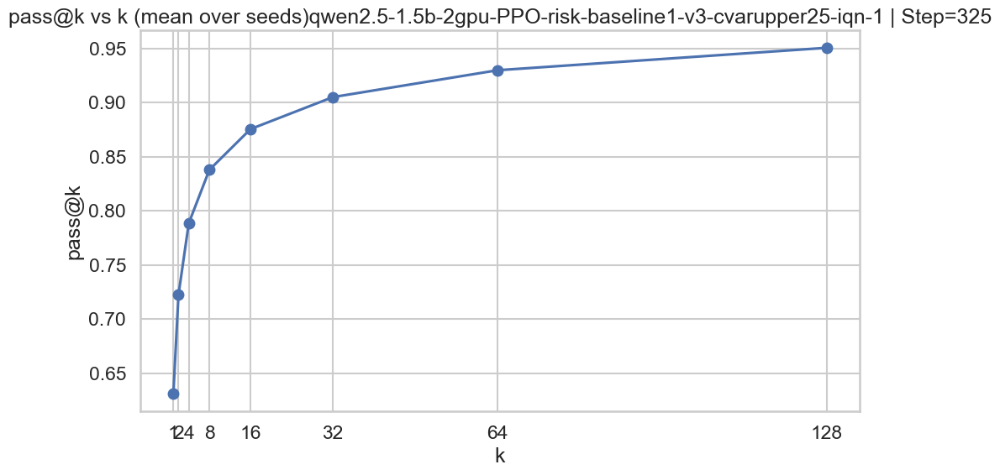

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8_step0.png


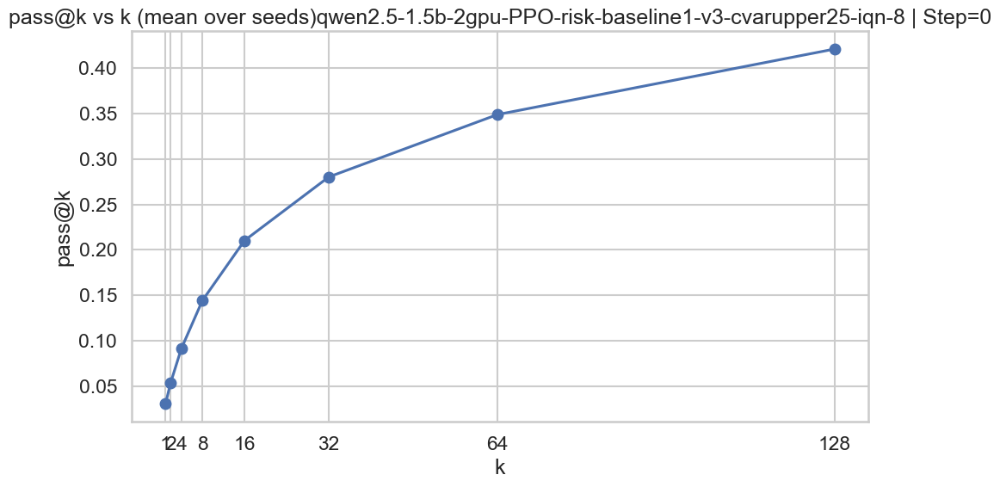

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8_step325.png


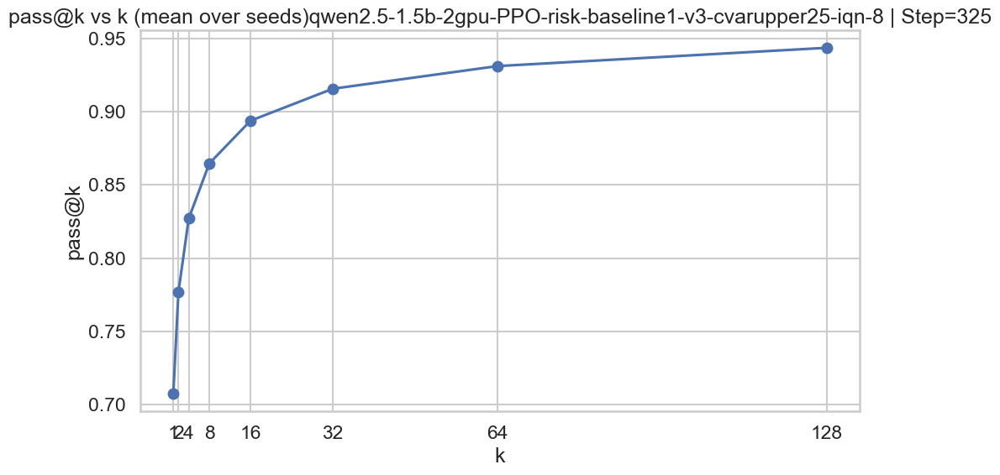

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8_step0.png


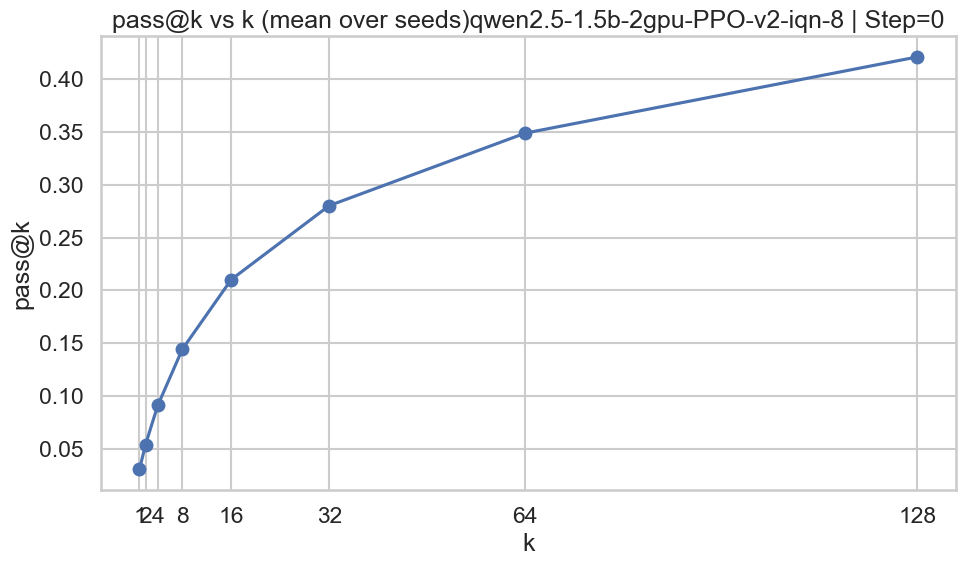

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8_step0.png


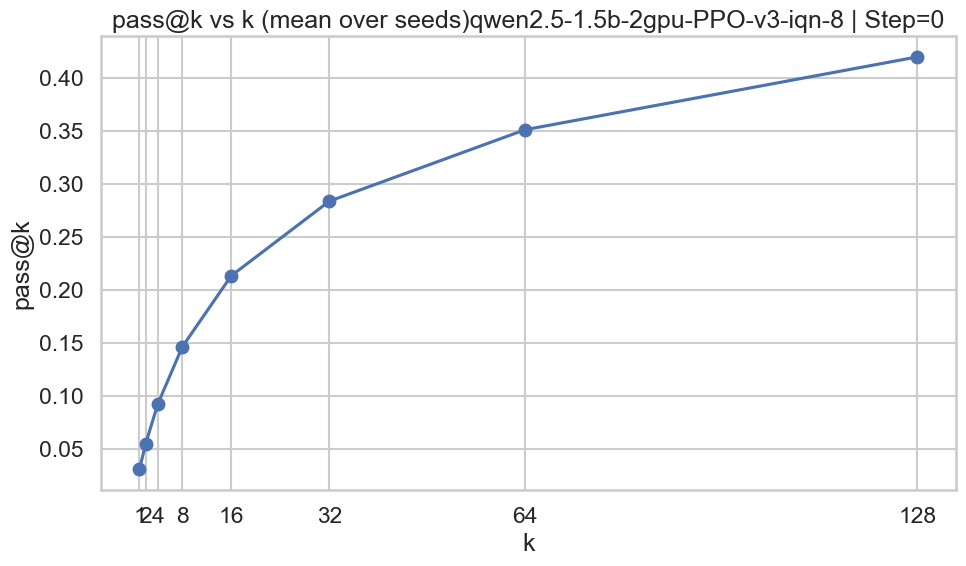

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8_step325.png


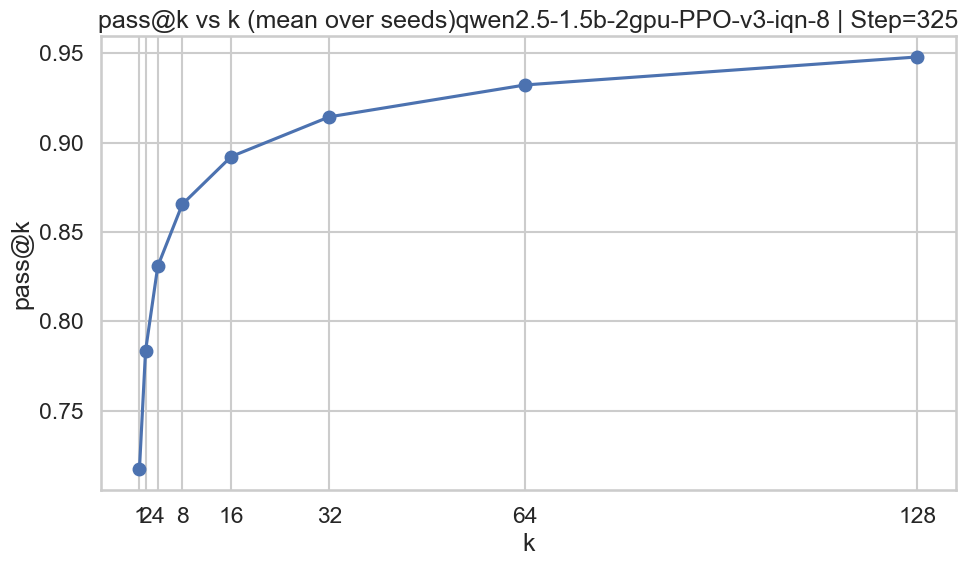

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_vs_k_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8_step628.png


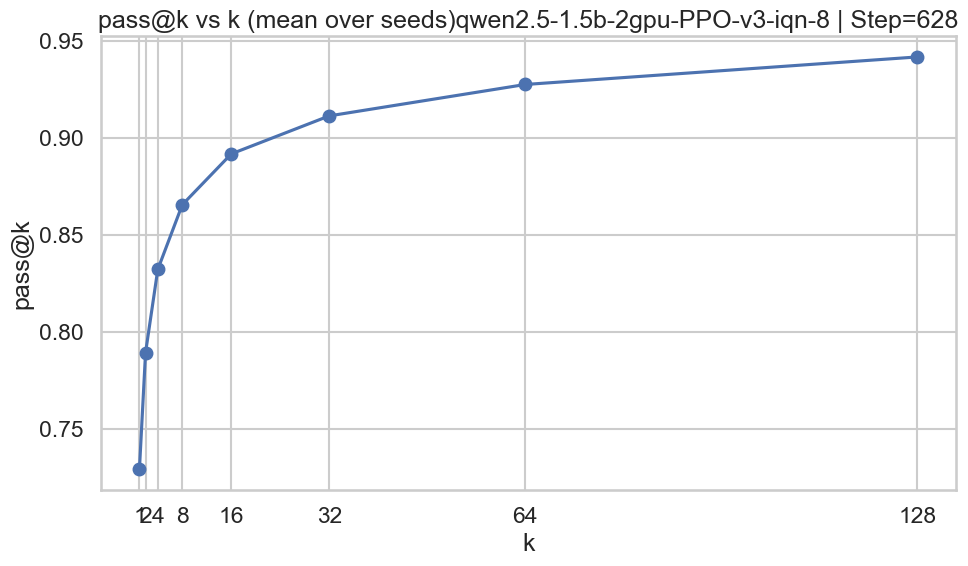

In [ ]:
# pass@k vs k for each algorithm at selected steps
for algo, df_algo in combined.groupby("algorithm"):
    for step in step_choices:
        df_step = df_algo[df_algo["Step"] == step]
        if df_step.empty:
            continue
        means = df_step[pass_cols].mean(axis=0)
        plt.figure()
        plt.plot(k_vals, means.values, marker="o")
        plt.title(f"pass@k vs k (mean over seeds){algo} | Step={step}")
        plt.xlabel("k")
        plt.ylabel("pass@k")
        plt.xticks(k_vals)
        savefig(f"passk_vs_k_{algo}_step{int(step)}")

## pass@k vs Step (for specific k)

We plot mean over seeds for each algorithm, one k at a time, to compare algorithms.


saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass@1_compare_algorithms.png


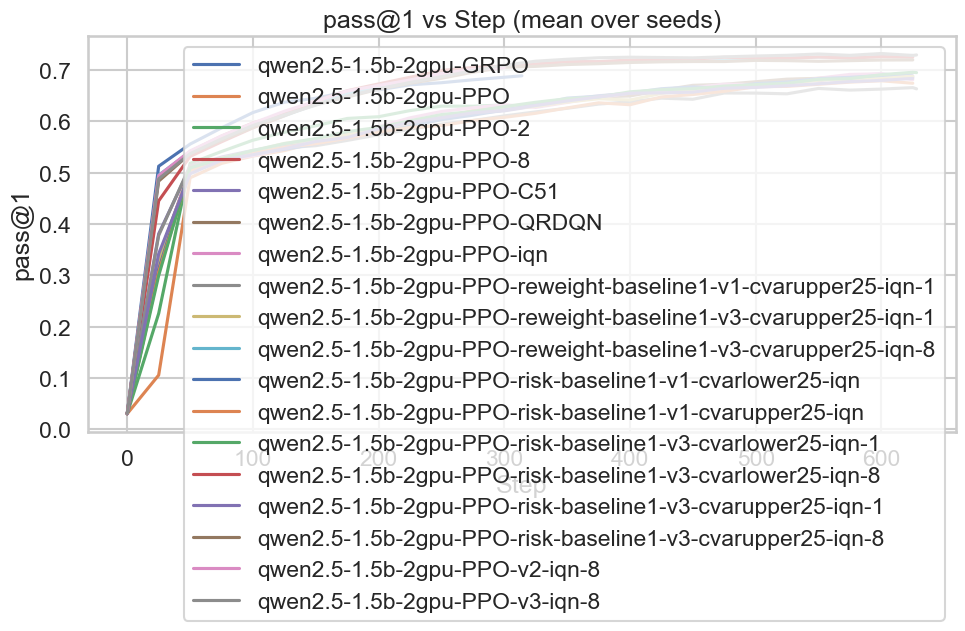

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass@8_compare_algorithms.png


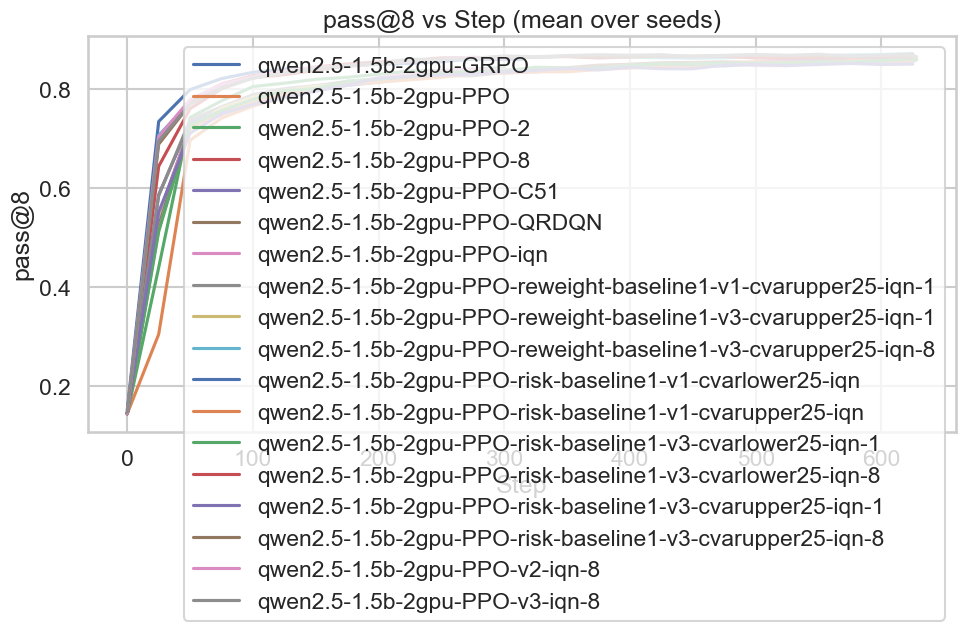

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass@32_compare_algorithms.png


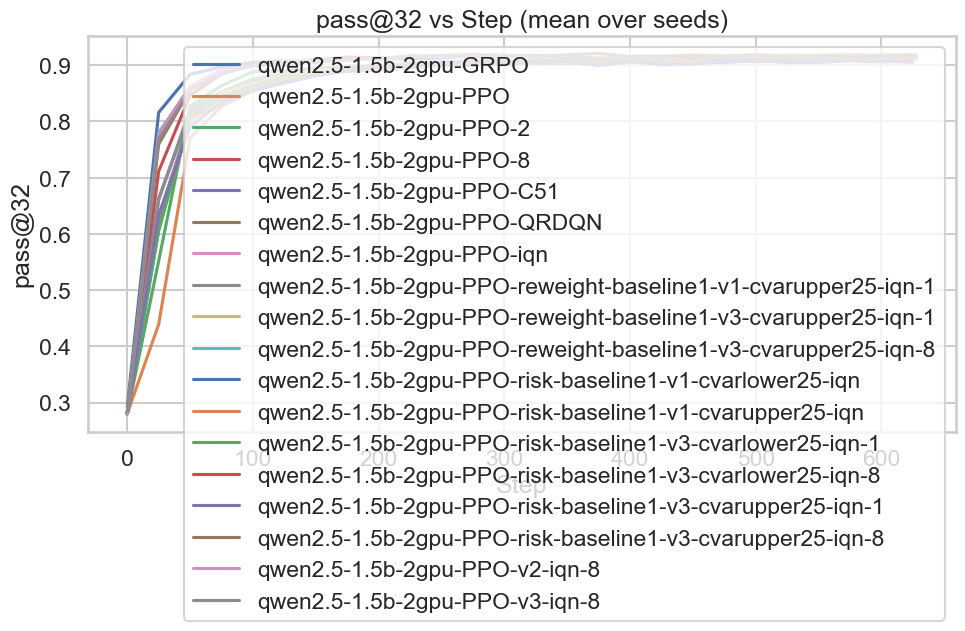

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass@128_compare_algorithms.png


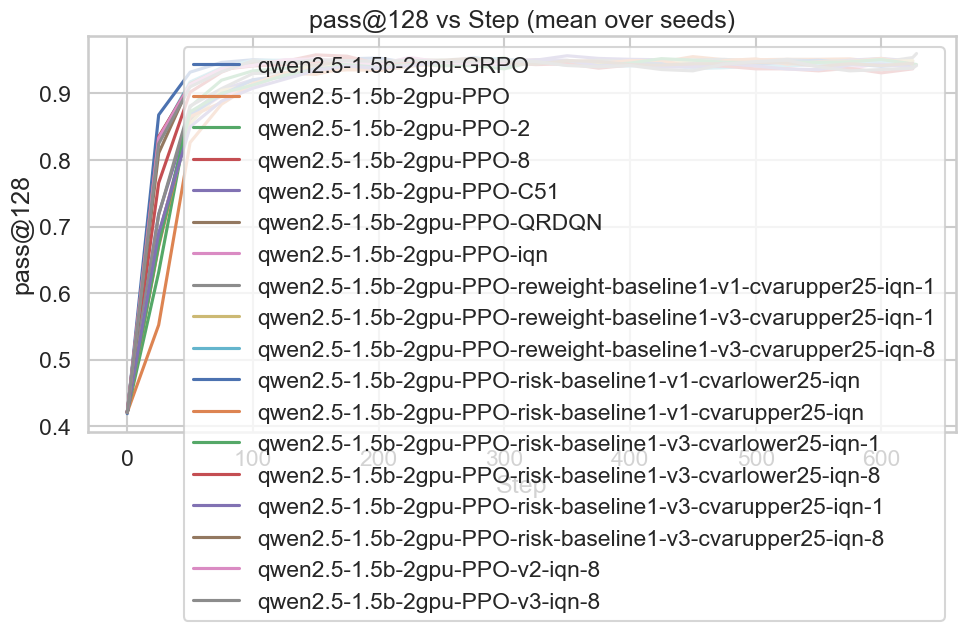

In [ ]:
# Compare algorithms for specific k
compare_k = [1, 8, 32, 128]
for k in compare_k:
    col = f"pass@{k}"
    if col not in pass_cols:
        continue
    plt.figure()
    for algo, df_algo in combined.groupby("algorithm"):
        agg = mean_std(df_algo, ["Step"], col)
        plt.plot(agg["Step"], agg["mean"], label=algo)
    plt.title(f"{col} vs Step (mean over seeds)")
    plt.xlabel("Step")
    plt.ylabel(col)
    plt.legend()
    savefig(f"{col}_compare_algorithms")

In [ ]:
# Baseline selection for relative comparisons
BASELINE_PREFERENCE = ["PPO", "baseline", "SFT"]

def pick_baseline(algos):
    for pref in BASELINE_PREFERENCE:
        for a in algos:
            if pref.lower() in a.lower():
                return a
    return algos[0] if algos else None

all_algos = sorted(combined["algorithm"].unique())
baseline_algo = pick_baseline(all_algos)
print("Baseline for relative comparisons:", baseline_algo)


In [ ]:
# Final-step bar charts (mean ± std) for avg@32 and selected pass@k
final_step = combined["Step"].max()
final_df = combined[combined["Step"] == final_step]

# avg@32
if not final_df.empty:
    agg_final = mean_std(final_df, ["algorithm"], "avg@32").sort_values("mean", ascending=False)
    plt.figure(figsize=(12, 6))
    plt.bar(agg_final["algorithm"], agg_final["mean"], yerr=agg_final["std"], capsize=4)
    plt.title(f"Final step avg@32 (mean ± std) | Step={int(final_step)}")
    plt.xlabel("algorithm")
    plt.ylabel("avg@32")
    plt.xticks(rotation=45, ha="right")
    savefig(f"final_step_avg32_bar_step{int(final_step)}")

# pass@k bars
bar_k = [1, 8, 32, 128]
for k in bar_k:
    col = f"pass@{k}"
    if col not in pass_cols or final_df.empty:
        continue
    agg_final = mean_std(final_df, ["algorithm"], col).sort_values("mean", ascending=False)
    plt.figure(figsize=(12, 6))
    plt.bar(agg_final["algorithm"], agg_final["mean"], yerr=agg_final["std"], capsize=4)
    plt.title(f"Final step {col} (mean ± std) | Step={int(final_step)}")
    plt.xlabel("algorithm")
    plt.ylabel(col)
    plt.xticks(rotation=45, ha="right")
    savefig(f"final_step_{col}_bar_step{int(final_step)}")


In [ ]:
# Area-under-curve (AUC) summary across steps (mean curves)
auc_metrics = ["avg@32", "pass@1", "pass@8", "pass@32", "pass@128"]
auc_metrics = [m for m in auc_metrics if m in combined.columns]

auc_rows = []
for algo, df_algo in combined.groupby("algorithm"):
    for m in auc_metrics:
        agg = mean_std(df_algo, ["Step"], m).sort_values("Step")
        if agg.empty:
            continue
        # Trapezoidal integration over steps (handles non-uniform spacing)
        auc = np.trapz(agg["mean"].values, agg["Step"].values)
        auc_rows.append({
            "algorithm": algo,
            "metric": m,
            "auc": auc,
        })

auc_df = pd.DataFrame(auc_rows)
if not auc_df.empty:
    for m in auc_metrics:
        dfm = auc_df[auc_df["metric"] == m].sort_values("auc", ascending=False)
        plt.figure(figsize=(12, 6))
        plt.bar(dfm["algorithm"], dfm["auc"])
        plt.title(f"AUC of {m} vs Step (mean curve)")
        plt.xlabel("algorithm")
        plt.ylabel("AUC")
        plt.xticks(rotation=45, ha="right")
        savefig(f"auc_{m}")


In [ ]:
# Relative improvement vs baseline across steps (mean curves)
rel_metrics = ["avg@32", "pass@1", "pass@8", "pass@32"]
rel_metrics = [m for m in rel_metrics if m in combined.columns]

if baseline_algo is not None:
    base_df = combined[combined["algorithm"] == baseline_algo]
    for m in rel_metrics:
        base_agg = mean_std(base_df, ["Step"], m).rename(columns={"mean":"base_mean", "std":"base_std"})
        plt.figure()
        for algo, df_algo in combined.groupby("algorithm"):
            if algo == baseline_algo:
                continue
            agg = mean_std(df_algo, ["Step"], m)
            merged_rel = agg.merge(base_agg, on="Step", how="inner")
            if merged_rel.empty:
                continue
            rel = (merged_rel["mean"] - merged_rel["base_mean"])
            plt.plot(merged_rel["Step"], rel, label=algo)
        plt.axhline(0.0, color="black", linewidth=1, linestyle="--")
        plt.title(f"Relative improvement over {baseline_algo} | {m}")
        plt.xlabel("Step")
        plt.ylabel(f"{m} - baseline")
        plt.legend(fontsize=9)
        savefig(f"relative_{m}_vs_{baseline_algo}")


## Heatmap: pass@k across steps

Mean over seeds. This gives a full k-by-step view for each algorithm.


saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-GRPO.png


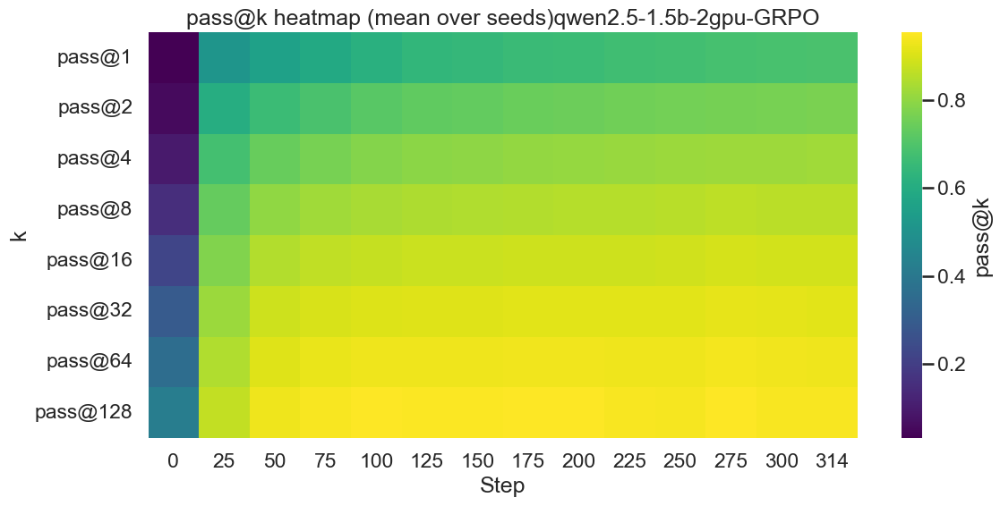

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO.png


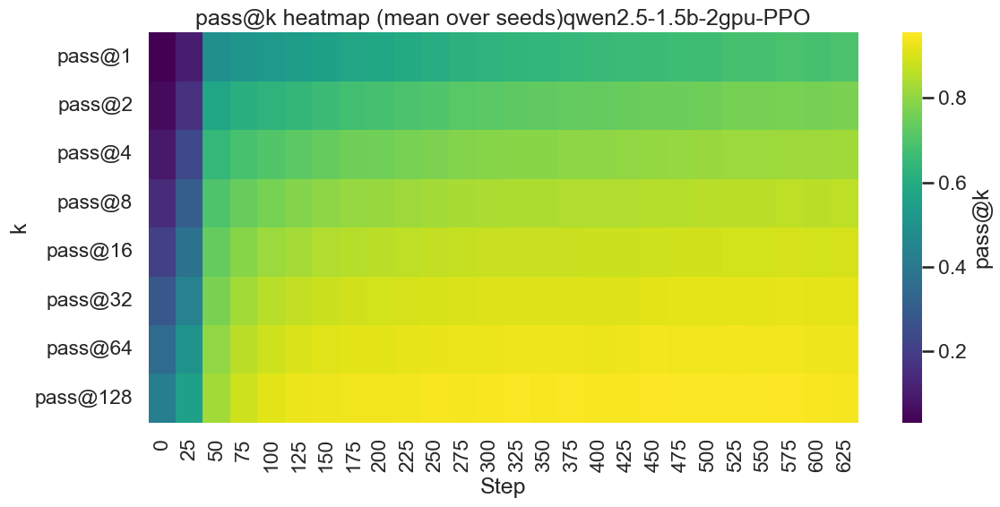

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-2.png


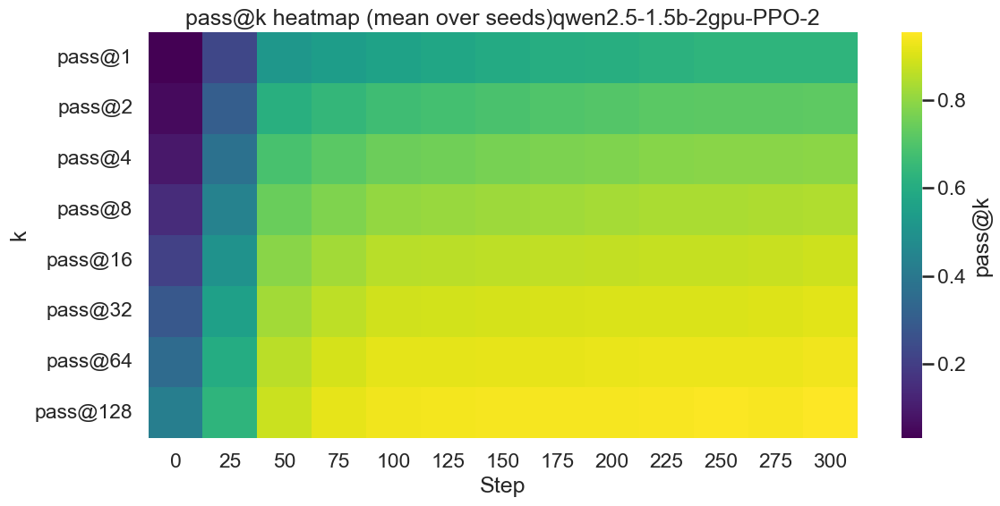

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-8.png


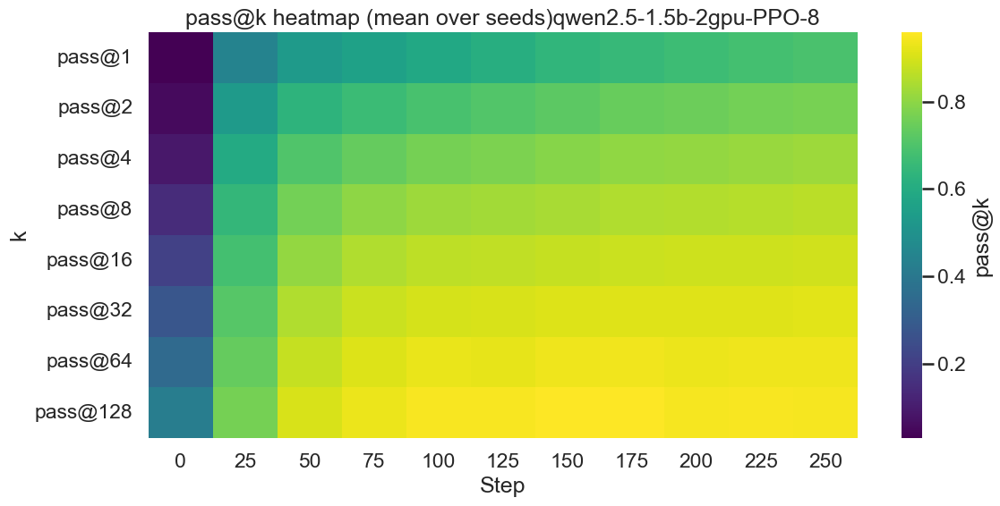

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-C51.png


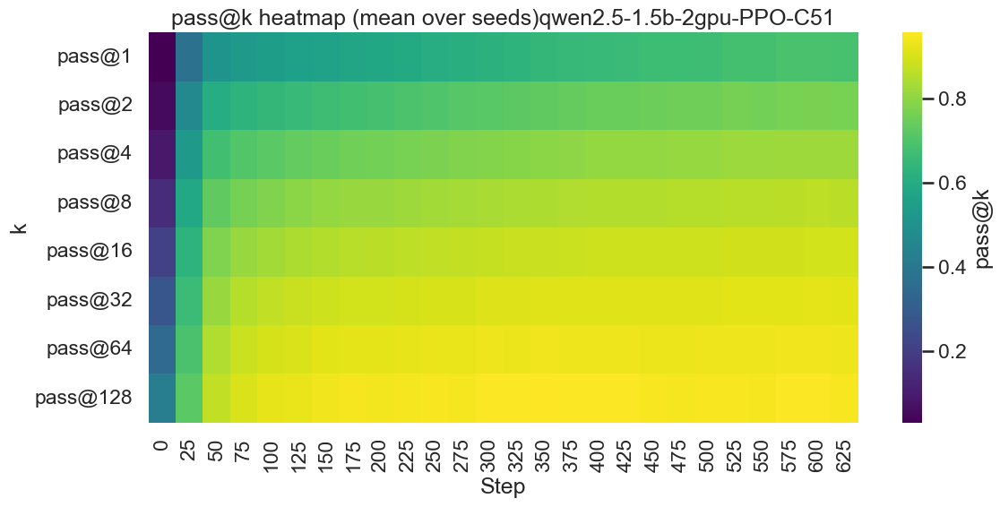

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-QRDQN.png


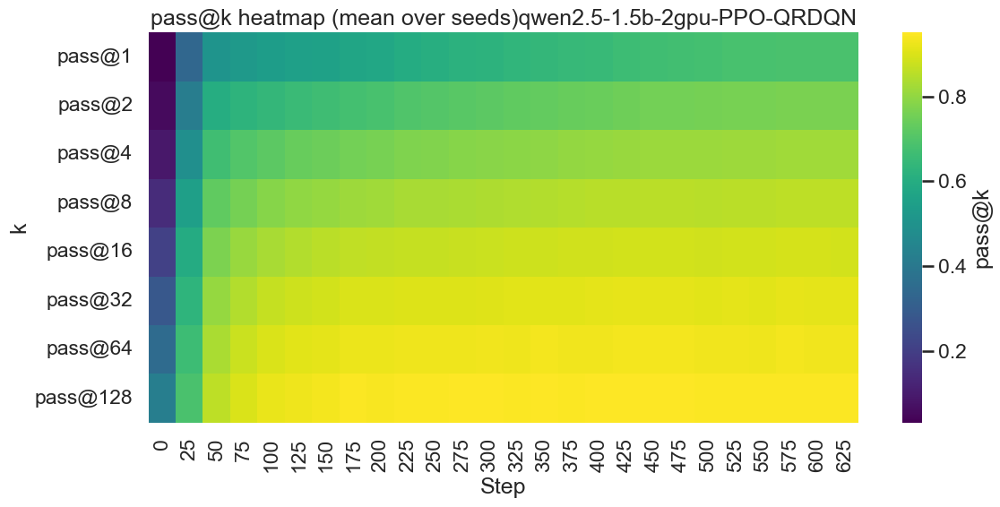

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-iqn.png


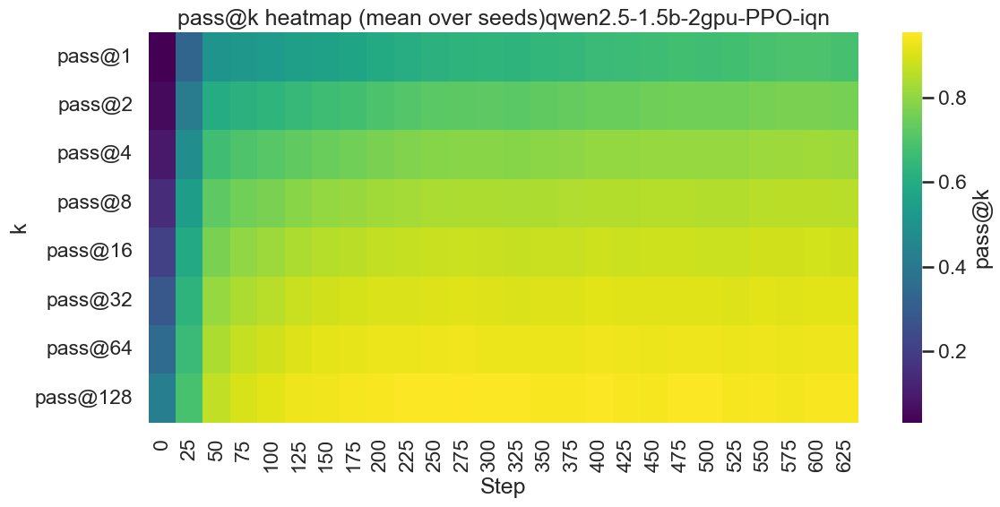

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1.png


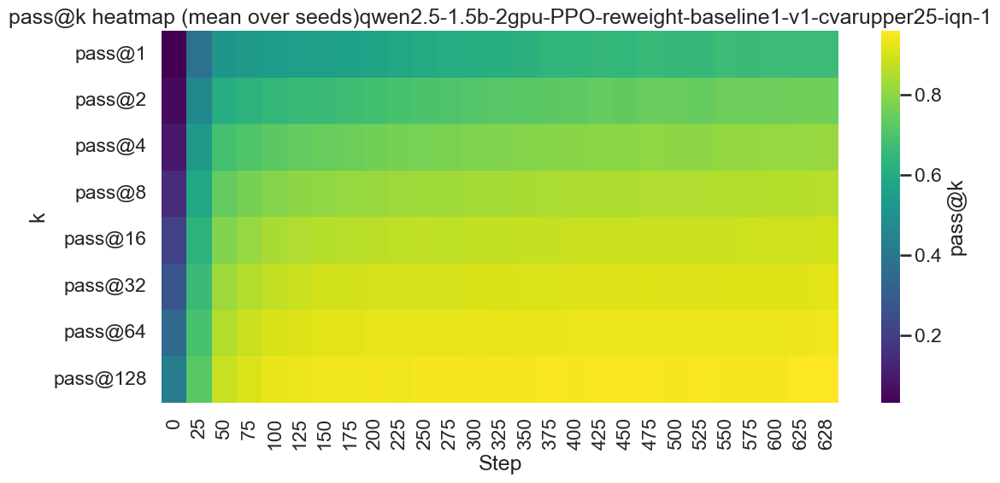

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1.png


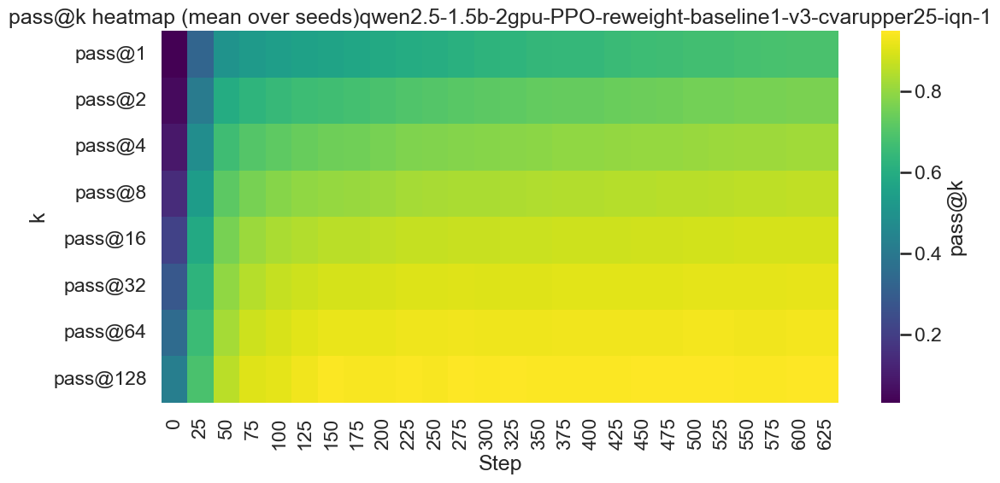

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8.png


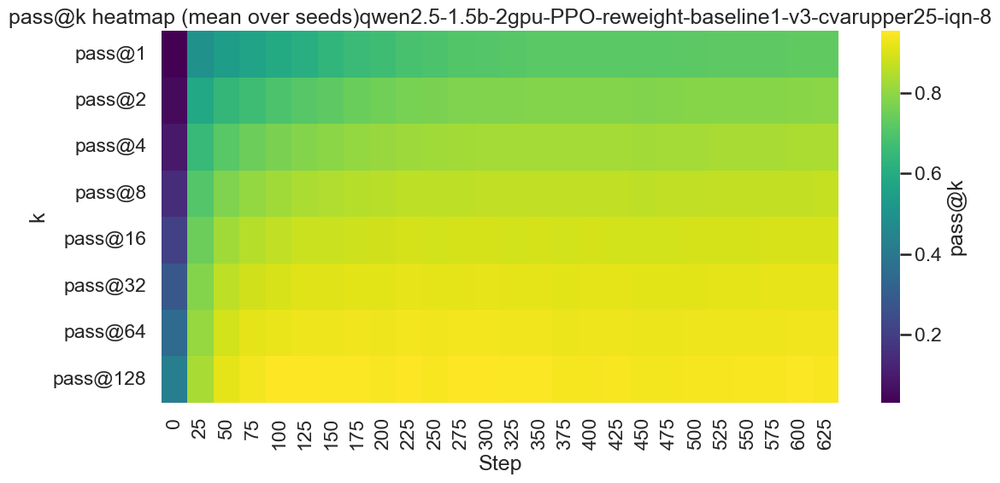

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn.png


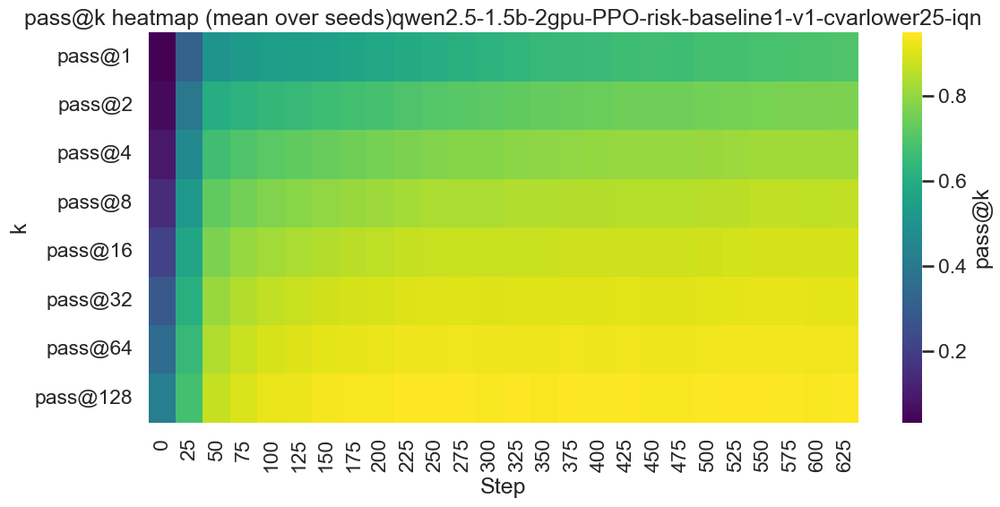

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn.png


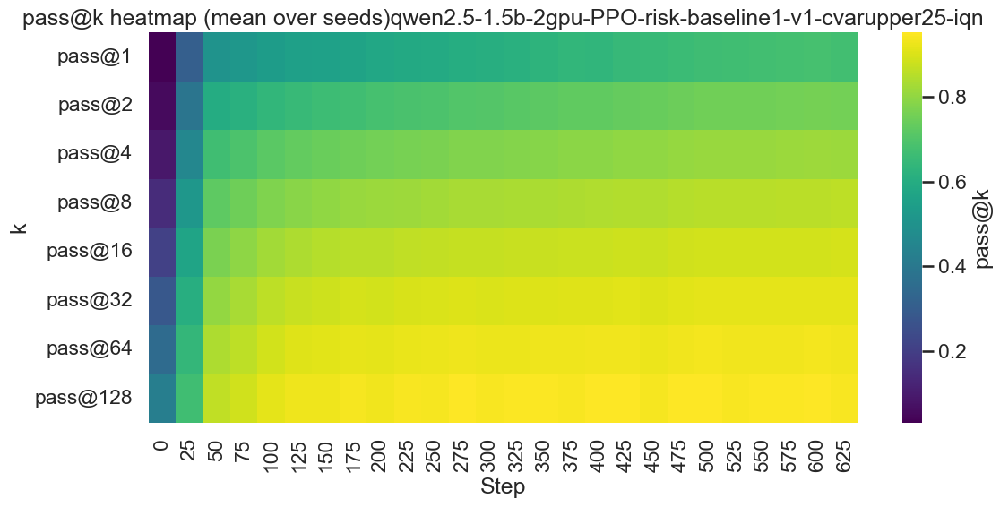

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1.png


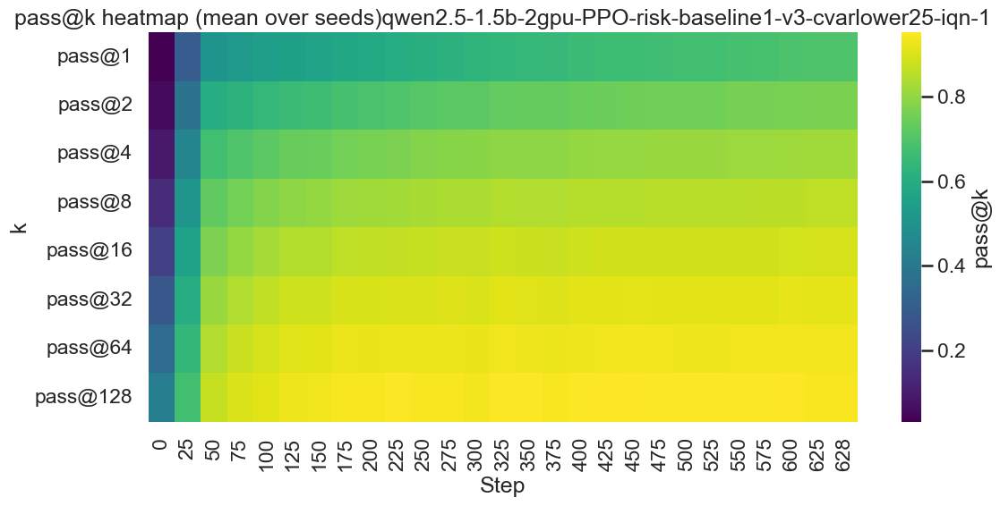

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8.png


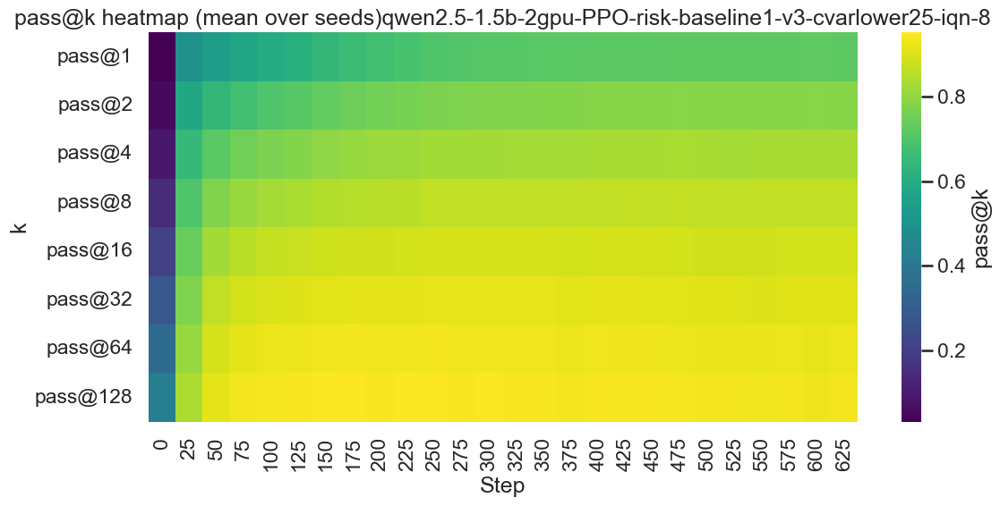

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1.png


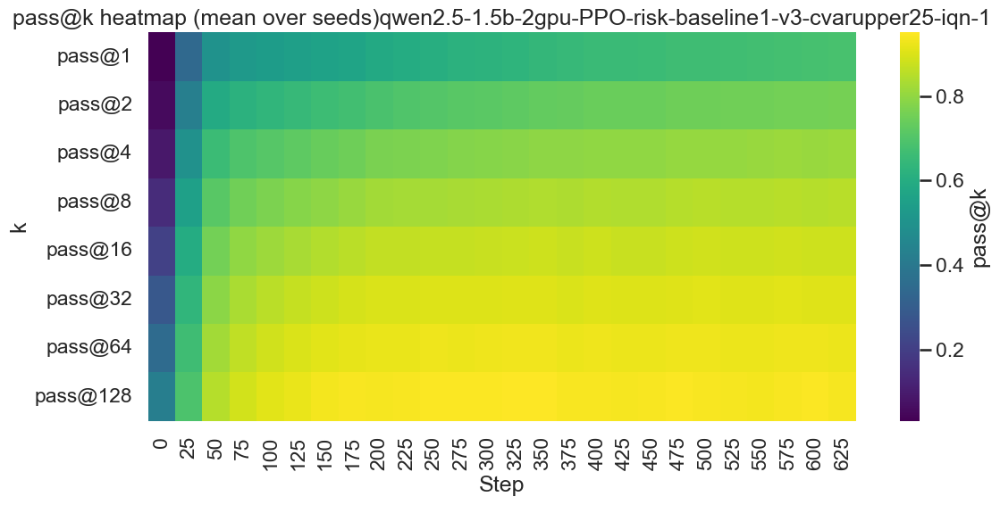

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8.png


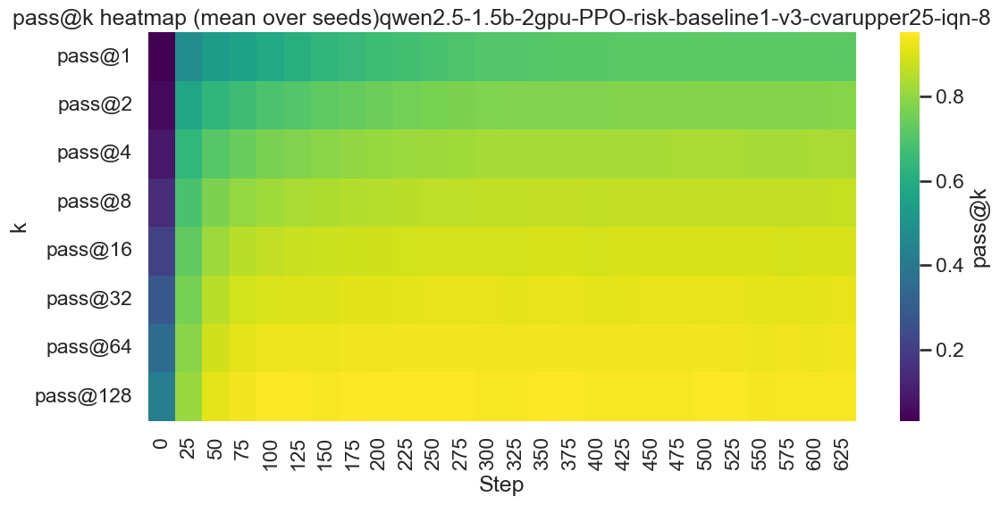

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8.png


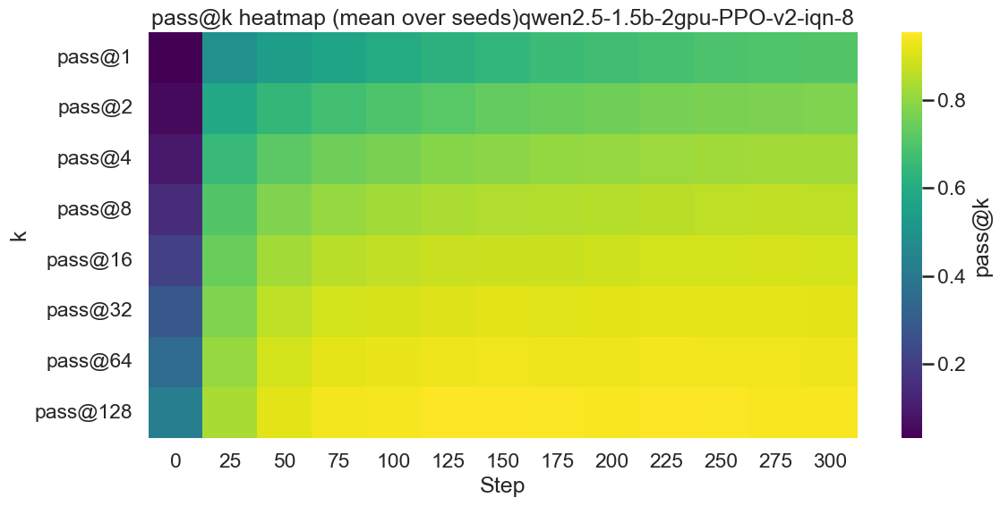

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/passk_heatmap_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8.png


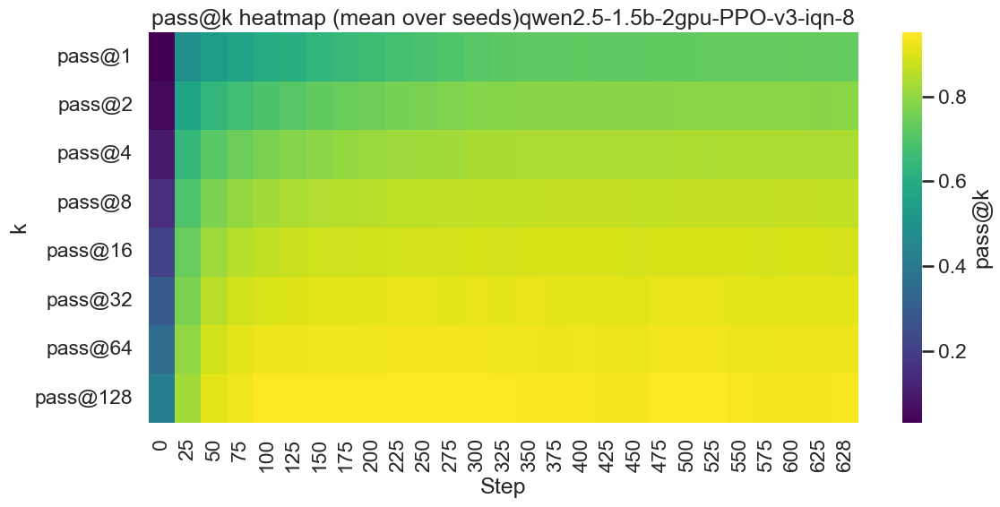

In [ ]:
# Heatmap for each algorithm
for algo, df_algo in combined.groupby("algorithm"):
    mean_by_step = df_algo.groupby("Step")[pass_cols].mean()
    mean_by_step = mean_by_step.sort_index()
    plt.figure(figsize=(12, 6))
    sns.heatmap(mean_by_step.T, cmap="viridis", cbar_kws={"label": "pass@k"})
    plt.title(f"pass@k heatmap (mean over seeds){algo}")
    plt.xlabel("Step")
    plt.ylabel("k")
    savefig(f"passk_heatmap_{algo}")

## Best step per k (mean over seeds)

For each algorithm and k, find the step that maximizes mean pass@k.


In [ ]:
best_rows = []
for algo, df_algo in combined.groupby("algorithm"):
    for col in pass_cols:
        agg = mean_std(df_algo, ["Step"], col)
        idx = agg["mean"].idxmax()
        if pd.isna(idx):
            continue
        row = agg.loc[idx]
        best_rows.append({
            "algorithm": algo,
            "metric": col,
            "best_step": row["Step"],
            "best_mean": row["mean"],
            "std_at_best": row["std"],
        })

best_df = pd.DataFrame(best_rows)
best_df.sort_values(["algorithm", "metric"]).head(20)

,algorithm,metric,best_step,best_mean,std_at_best
0,qwen2.5-1.5b-2gpu-GRPO,pass@1,314.0,0.688721,0.004145
7,qwen2.5-1.5b-2gpu-GRPO,pass@128,275.0,0.953908,0.003471
4,qwen2.5-1.5b-2gpu-GRPO,pass@16,275.0,0.892936,0.001316
1,qwen2.5-1.5b-2gpu-GRPO,pass@2,314.0,0.767510,0.002215
5,qwen2.5-1.5b-2gpu-GRPO,pass@32,275.0,0.918395,0.001653
2,qwen2.5-1.5b-2gpu-GRPO,pass@4,314.0,0.821167,0.002112
6,qwen2.5-1.5b-2gpu-GRPO,pass@64,275.0,0.937938,0.002447
3,qwen2.5-1.5b-2gpu-GRPO,pass@8,275.0,0.860730,0.001066
8,qwen2.5-1.5b-2gpu-PPO,pass@1,625.0,0.694551,0.017747
15,qwen2.5-1.5b-2gpu-PPO,pass@128,450.0,0.955244,0.004172


## Seed variability

Standard deviation across seeds over steps.


saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-GRPO.png


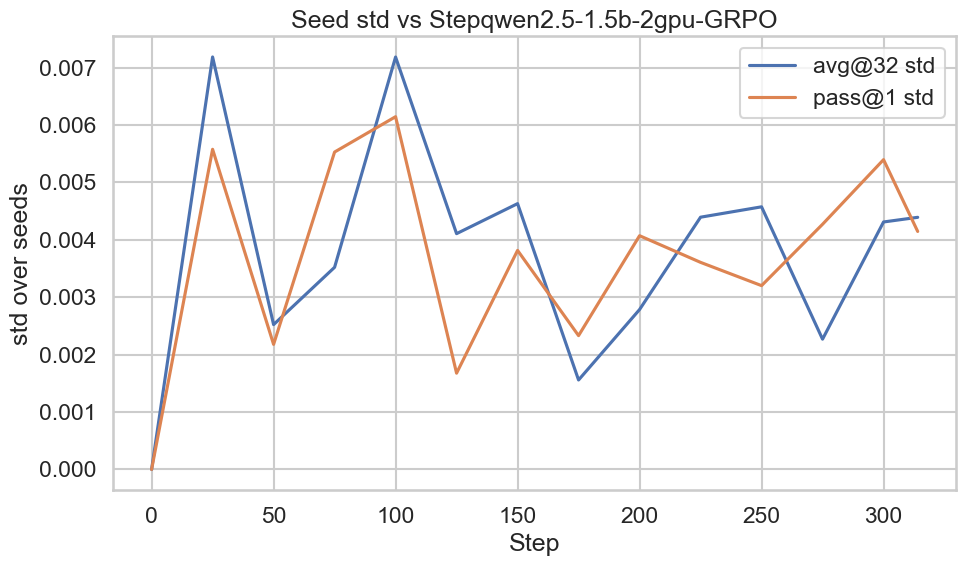

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO.png


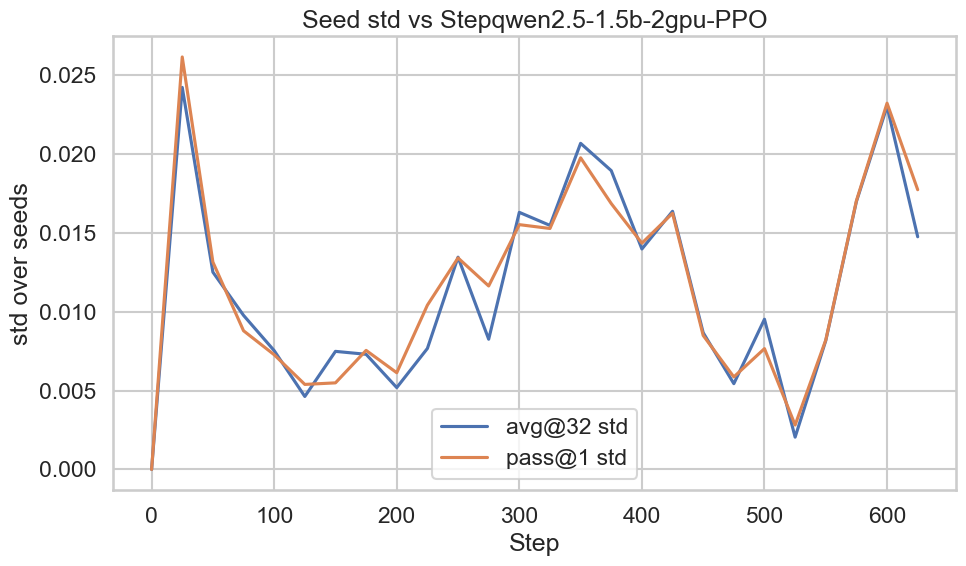

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-2.png


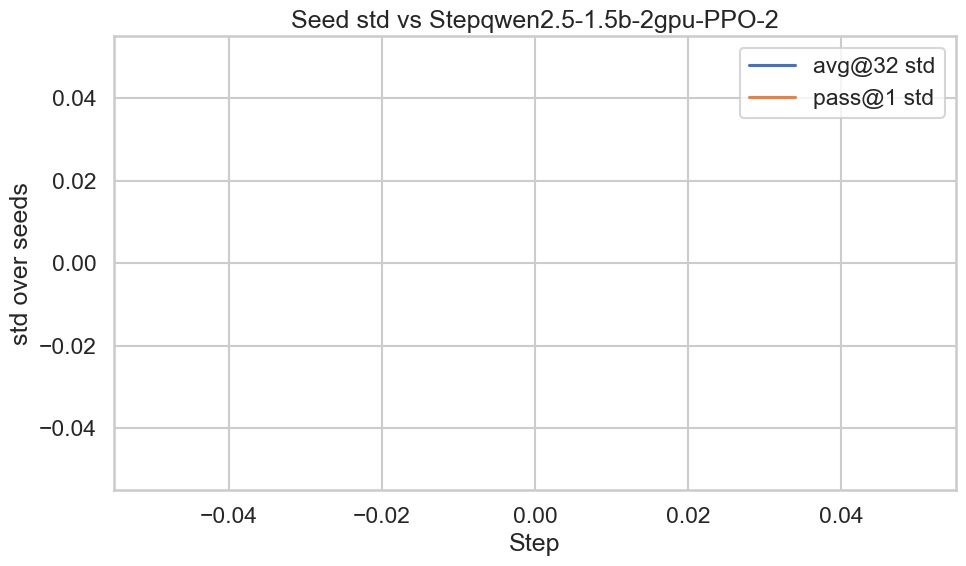

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-8.png


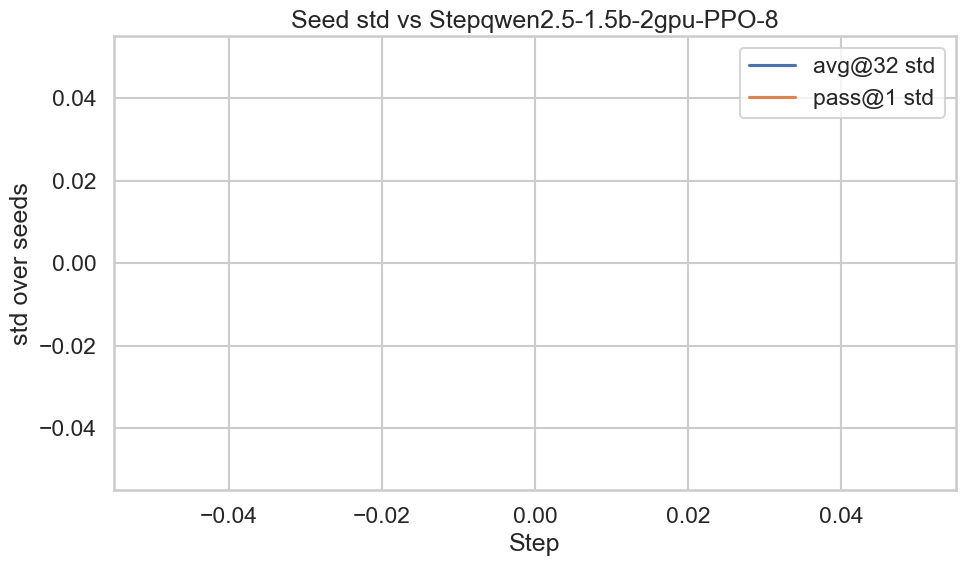

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-C51.png


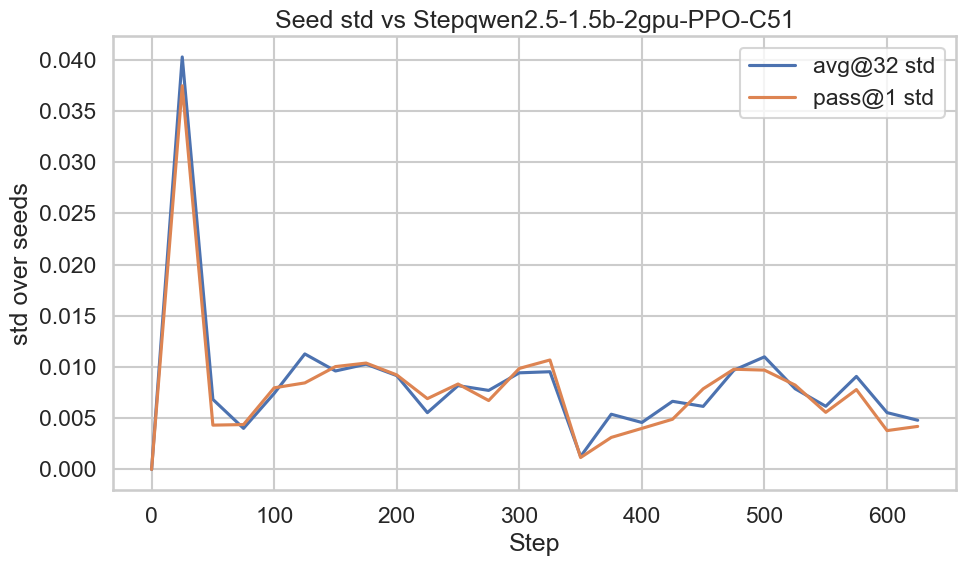

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-QRDQN.png


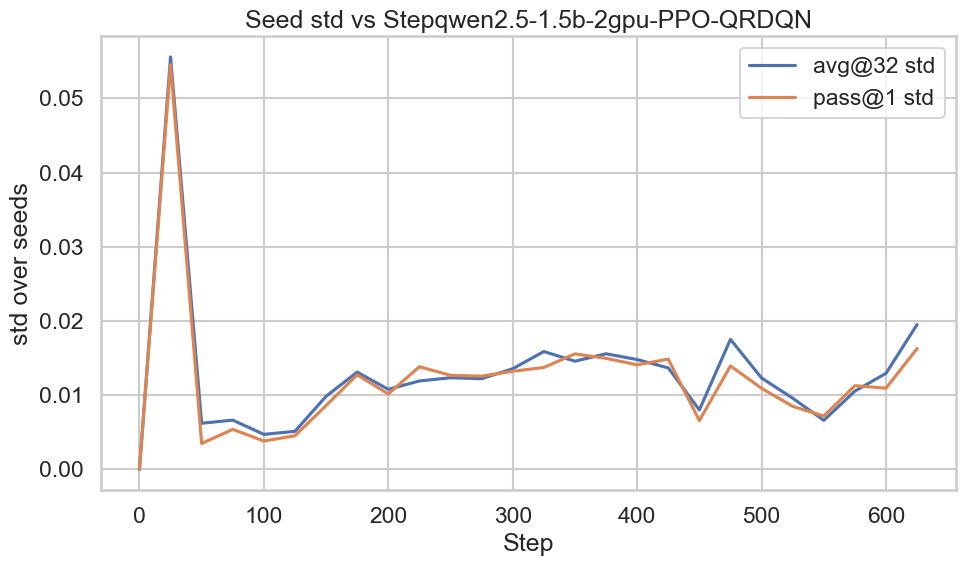

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-iqn.png


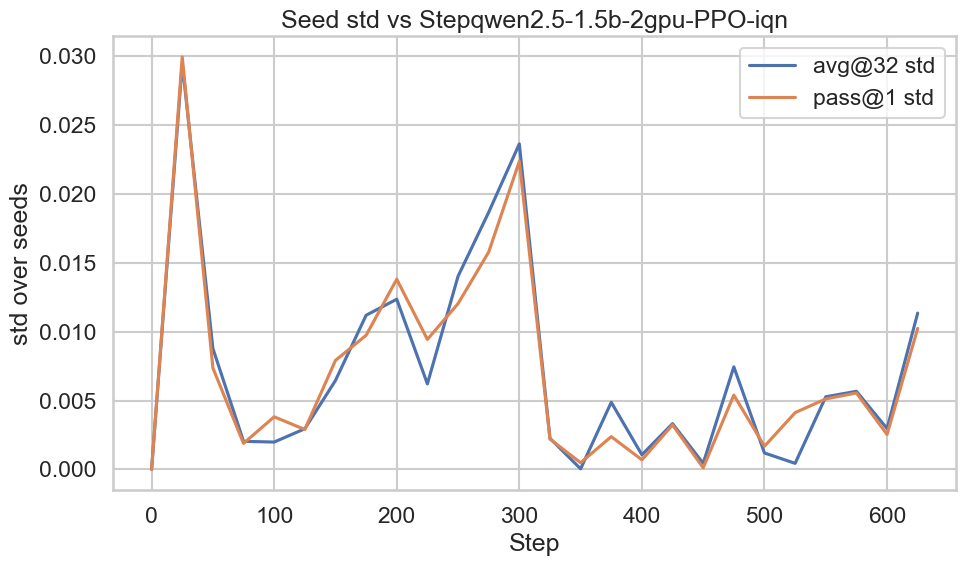

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1.png


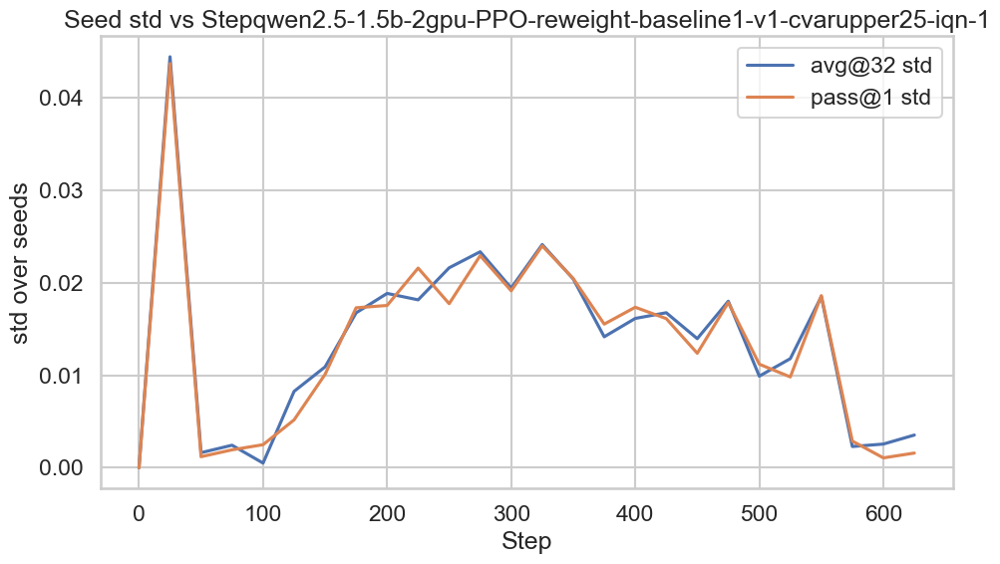

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1.png


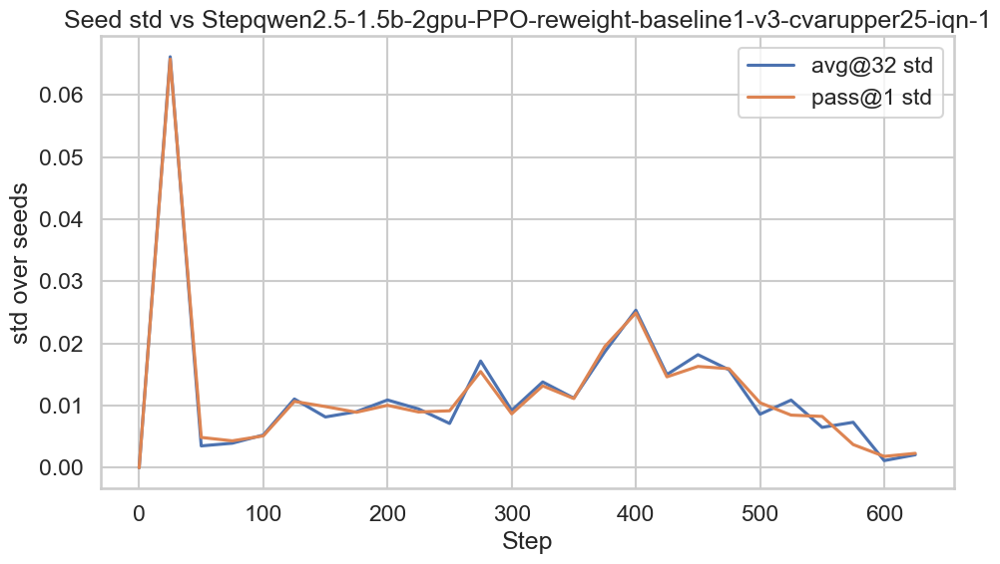

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8.png


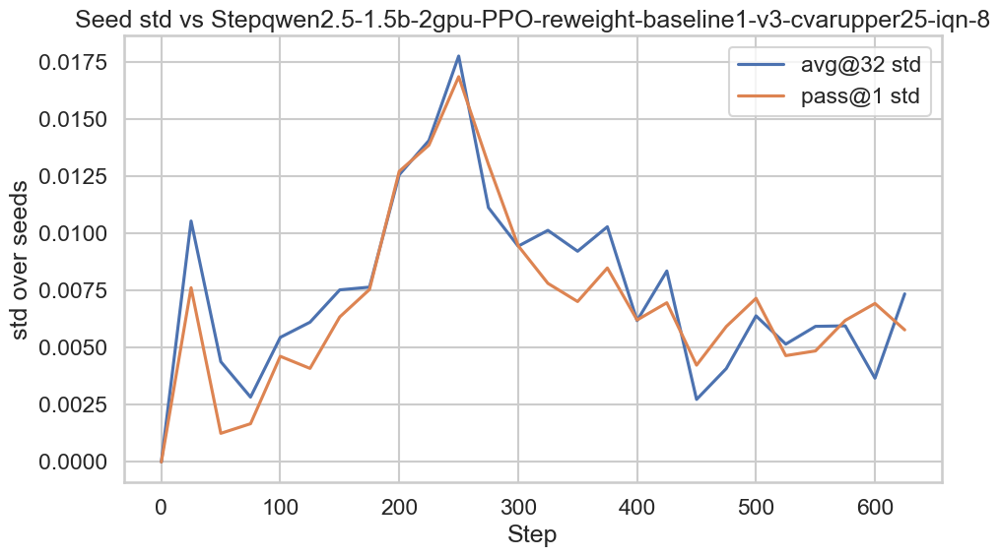

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn.png


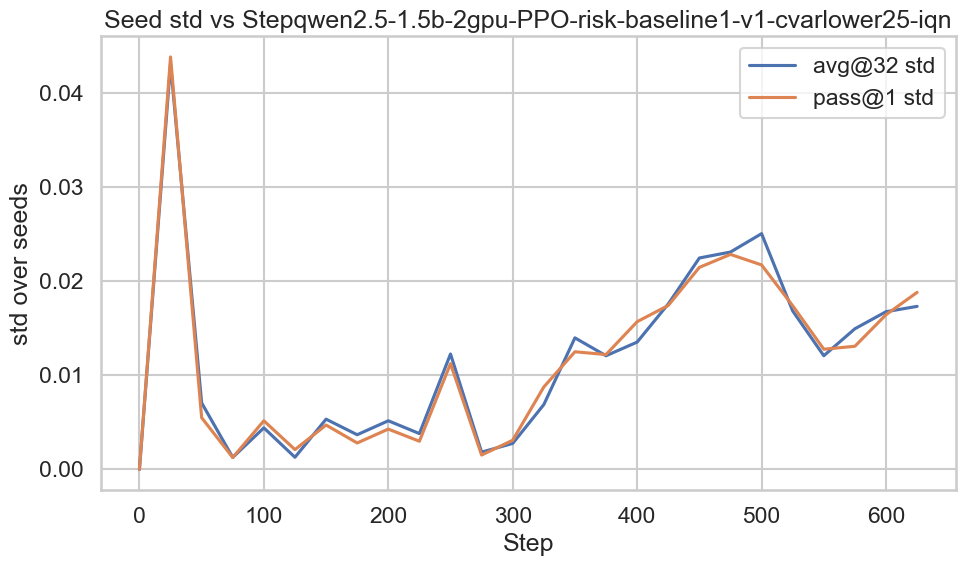

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn.png


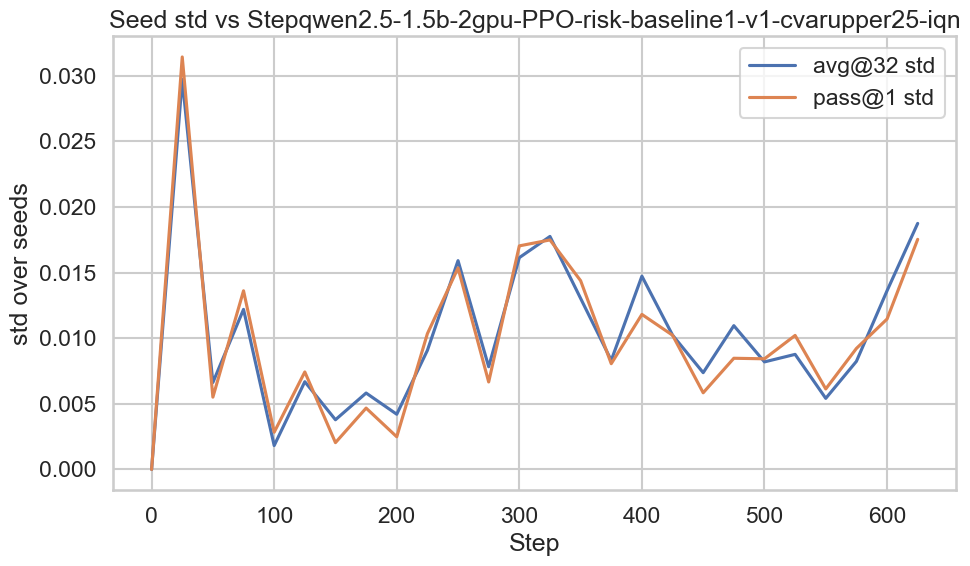

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1.png


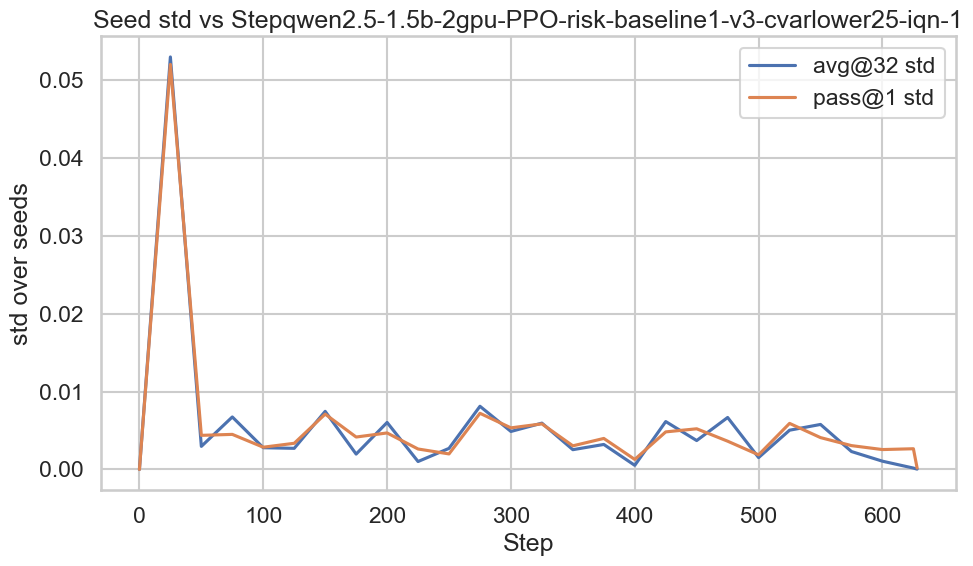

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8.png


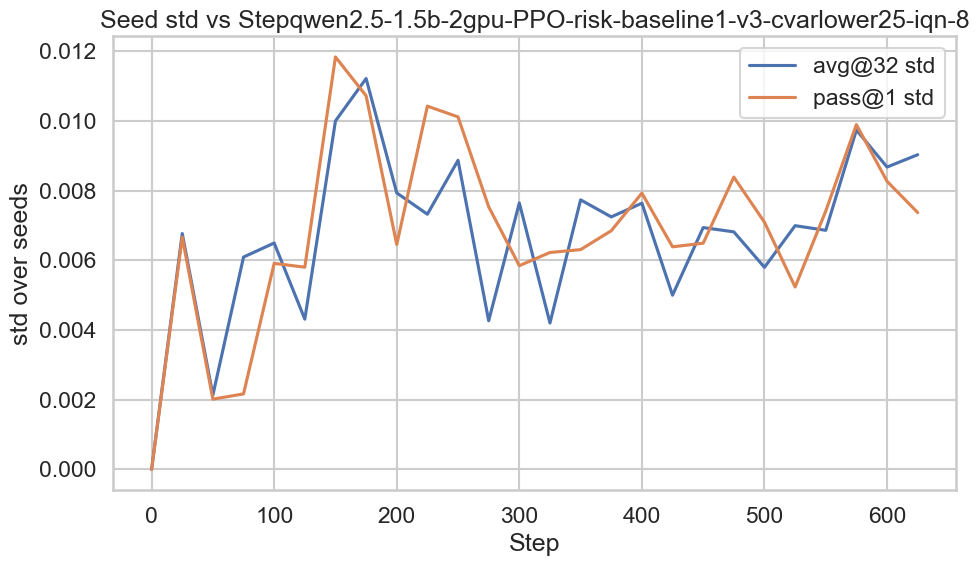

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1.png


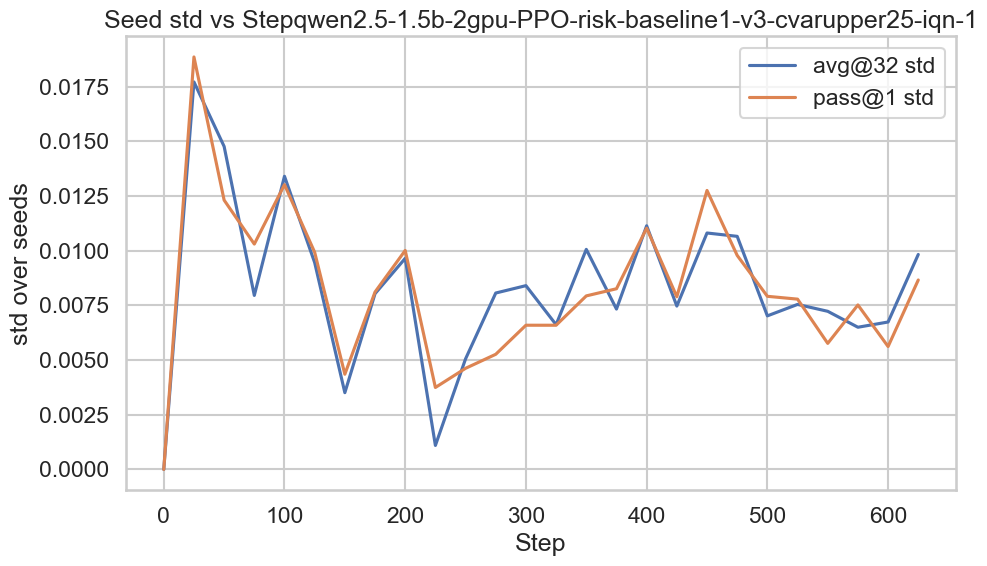

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8.png


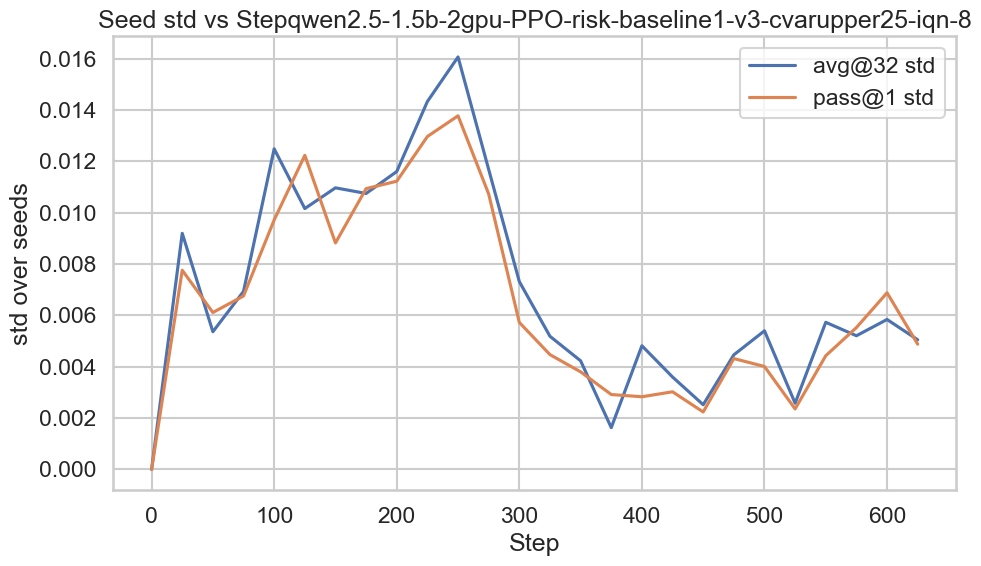

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8.png


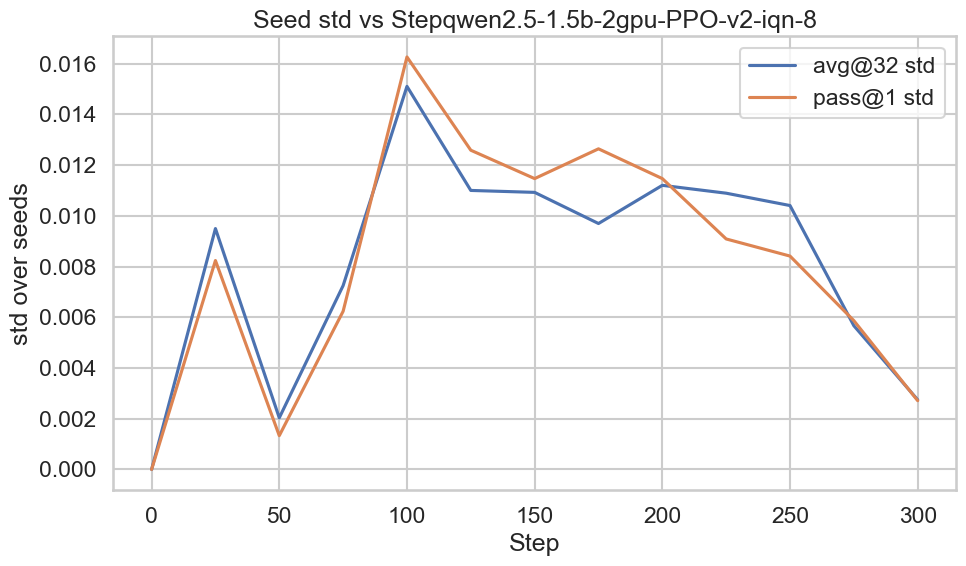

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/seed_std_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8.png


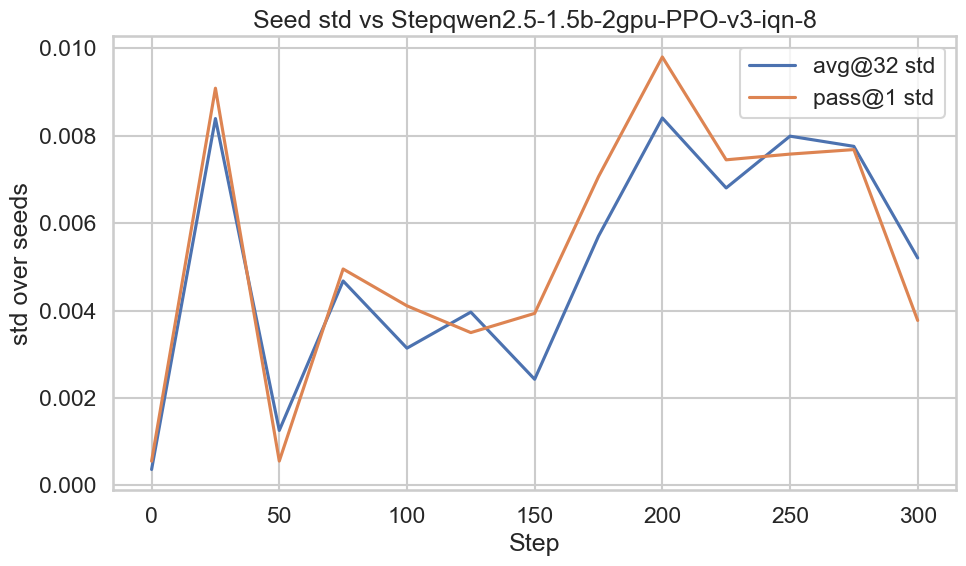

In [ ]:
# std curves for pass@1 and avg@32
std_cols = ["avg@32", "pass@1"]
for algo, df_algo in combined.groupby("algorithm"):
    plt.figure()
    for col in std_cols:
        agg = mean_std(df_algo, ["Step"], col)
        plt.plot(agg["Step"], agg["std"], label=f"{col} std")
    plt.title(f"Seed std vs Step{algo}")
    plt.xlabel("Step")
    plt.ylabel("std over seeds")
    plt.legend()
    savefig(f"seed_std_{algo}")

## Entropy loss over steps

Mean over seeds + std band per algorithm.


saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-GRPO.png


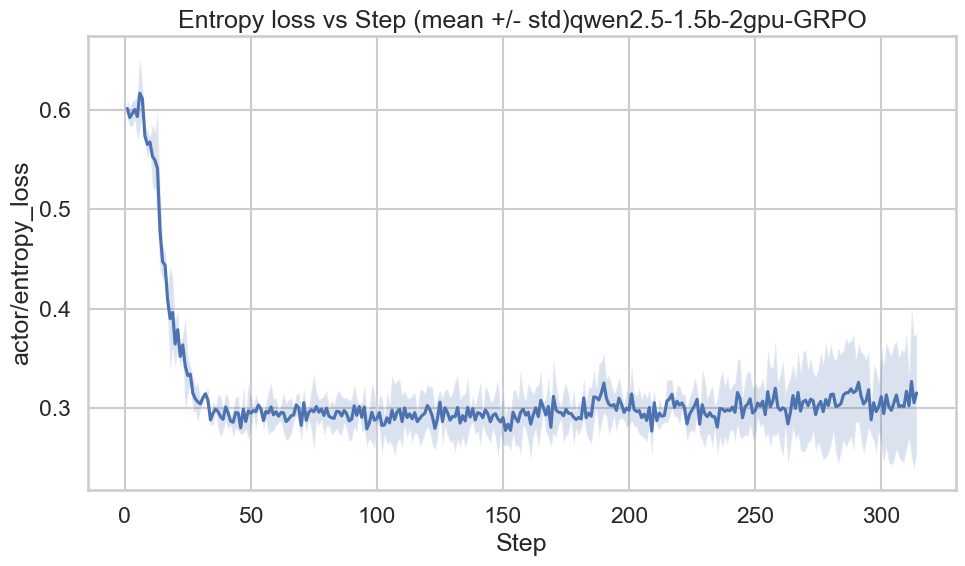

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO.png


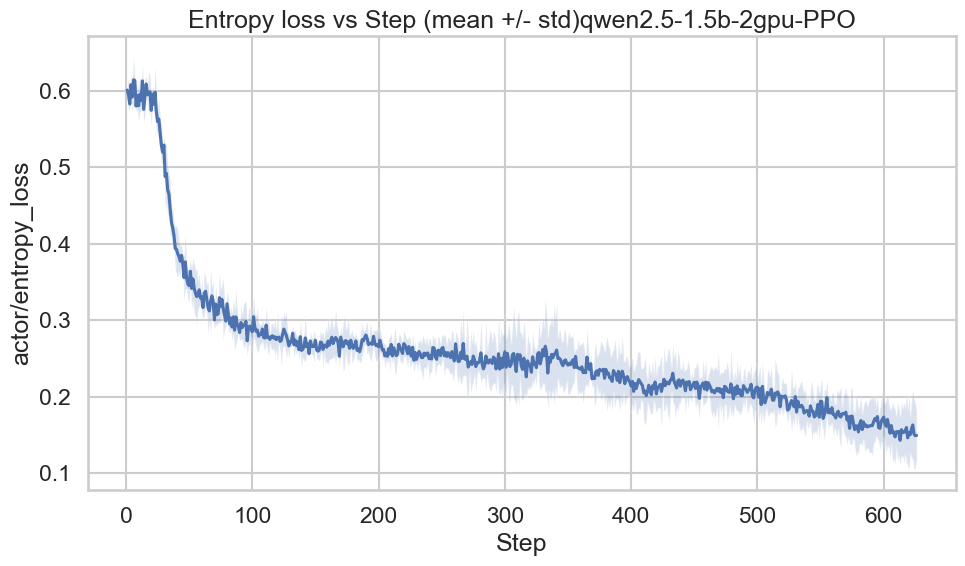

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-2.png


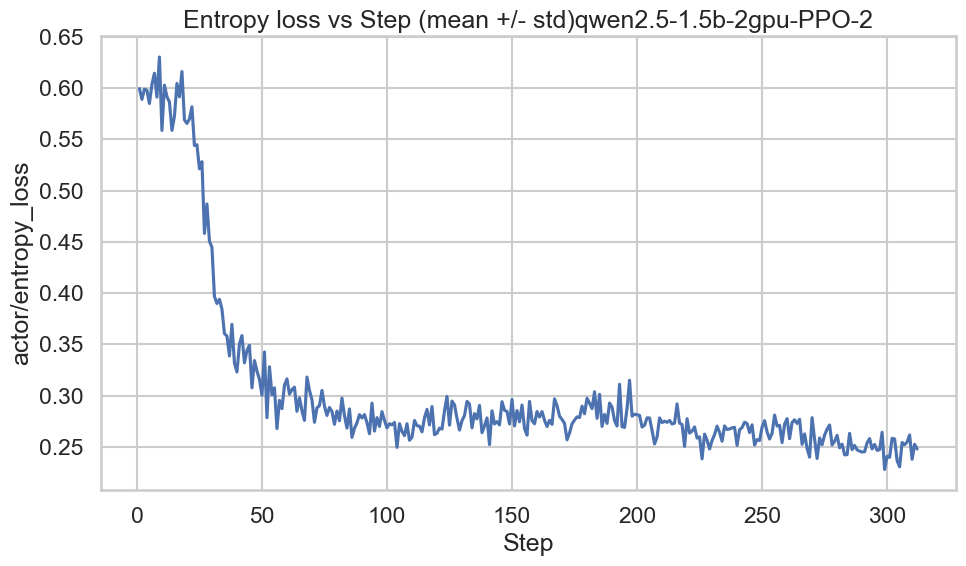

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-8.png


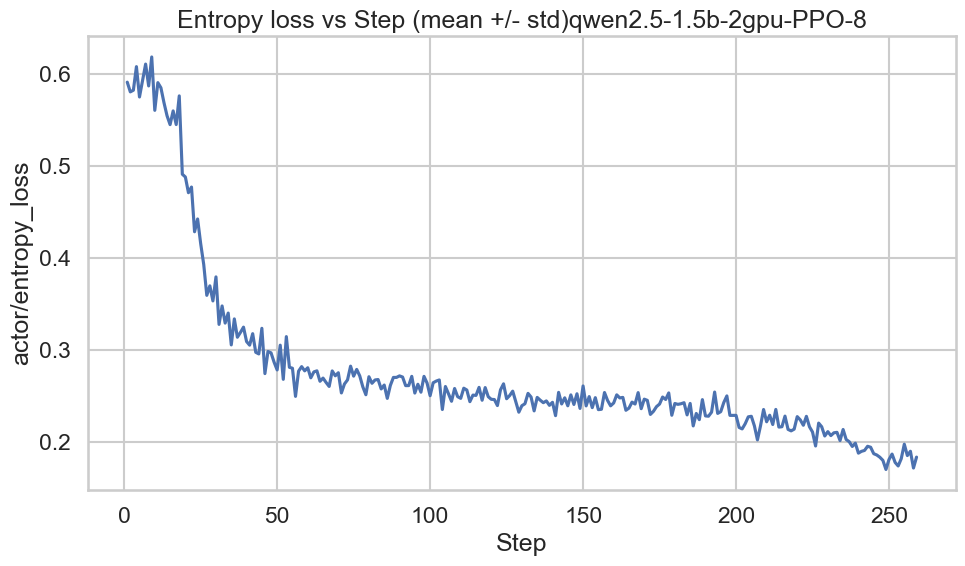

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-C51.png


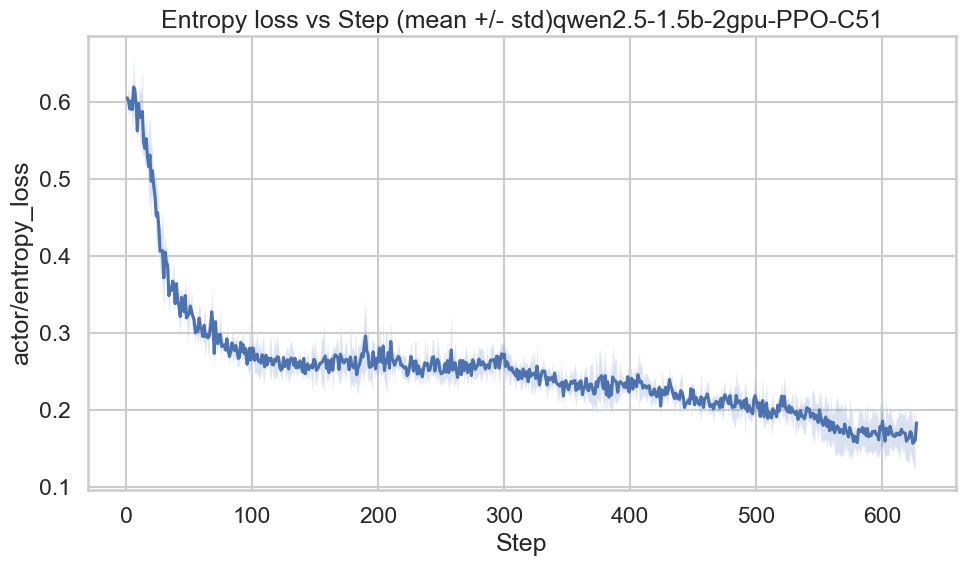

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-QRDQN.png


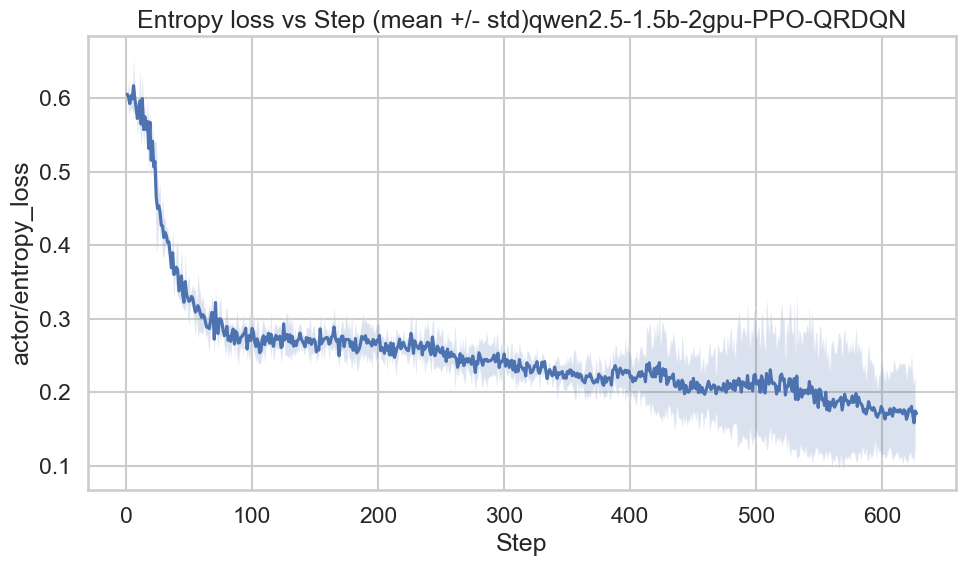

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-distributionalv2-iqn-8-1epoch.png


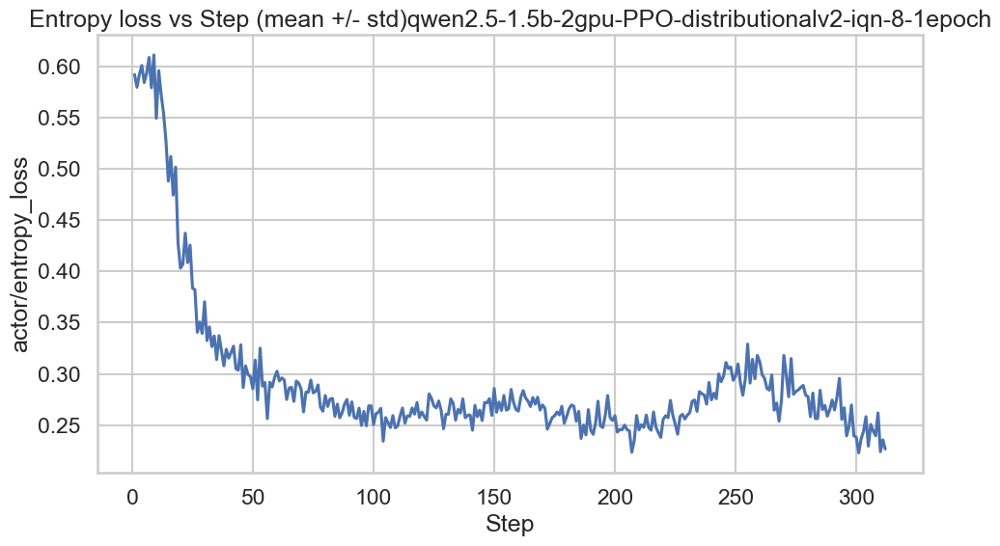

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-iqn.png


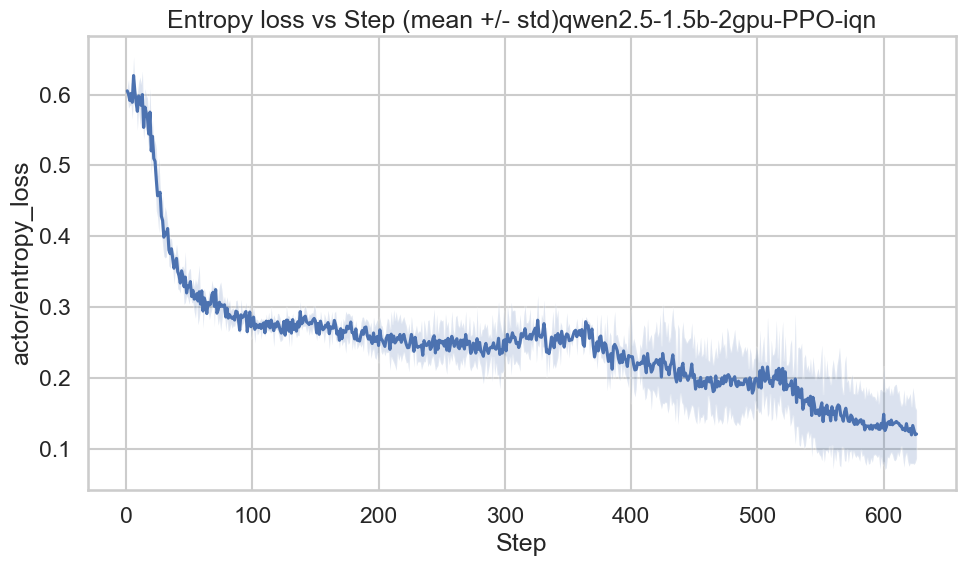

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1.png


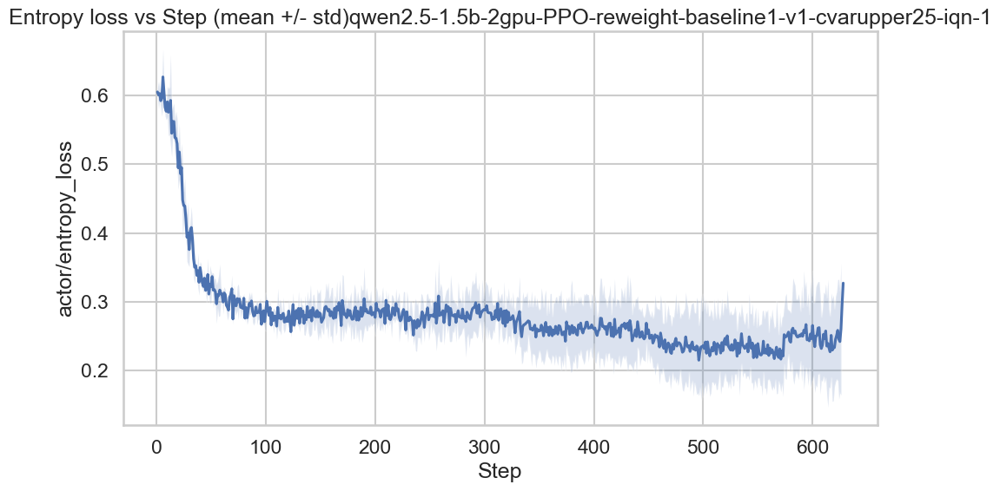

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1.png


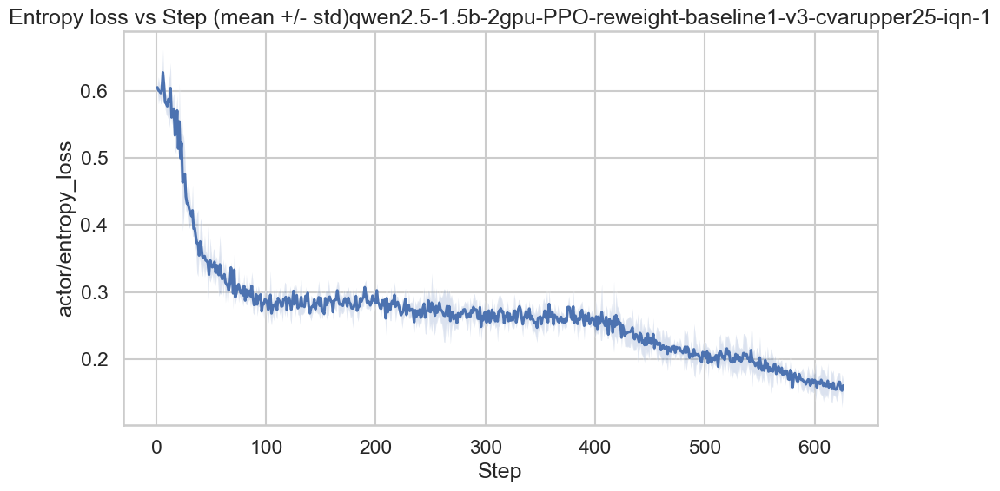

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8.png


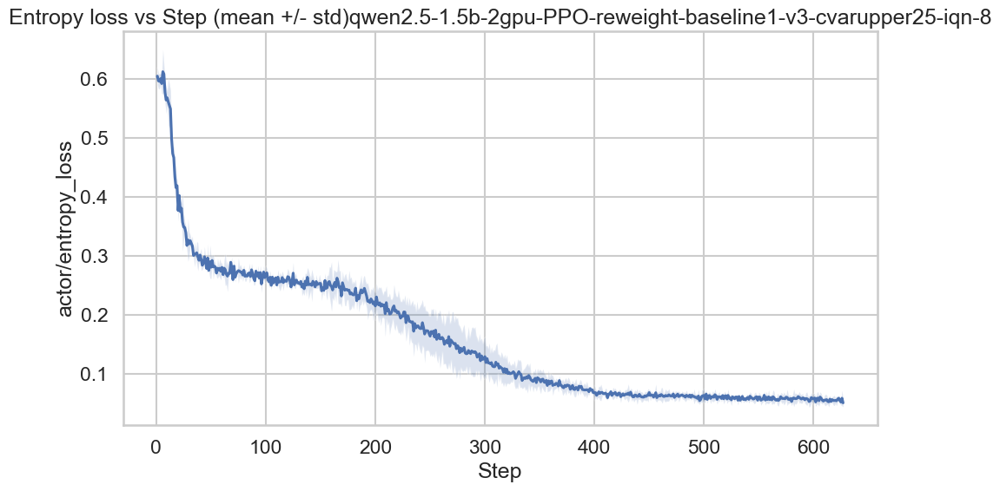

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn.png


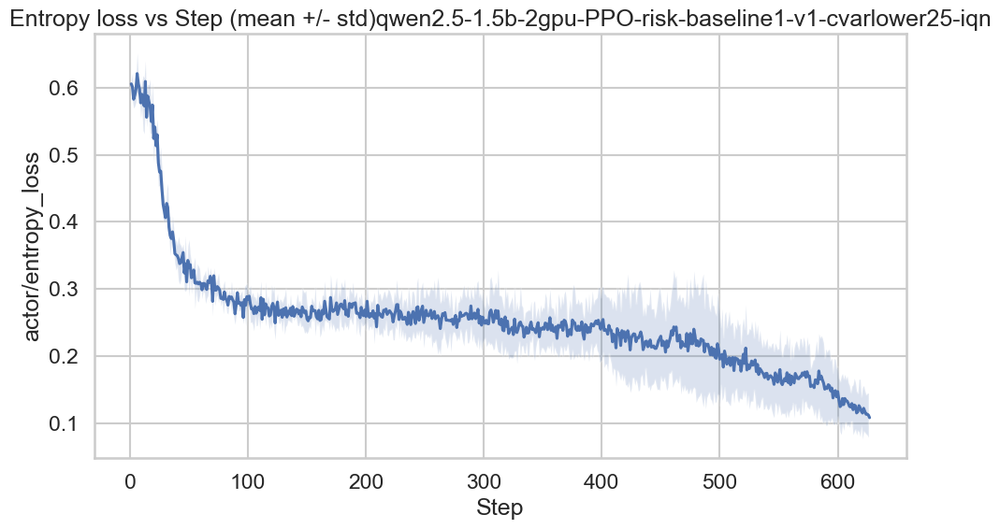

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn.png


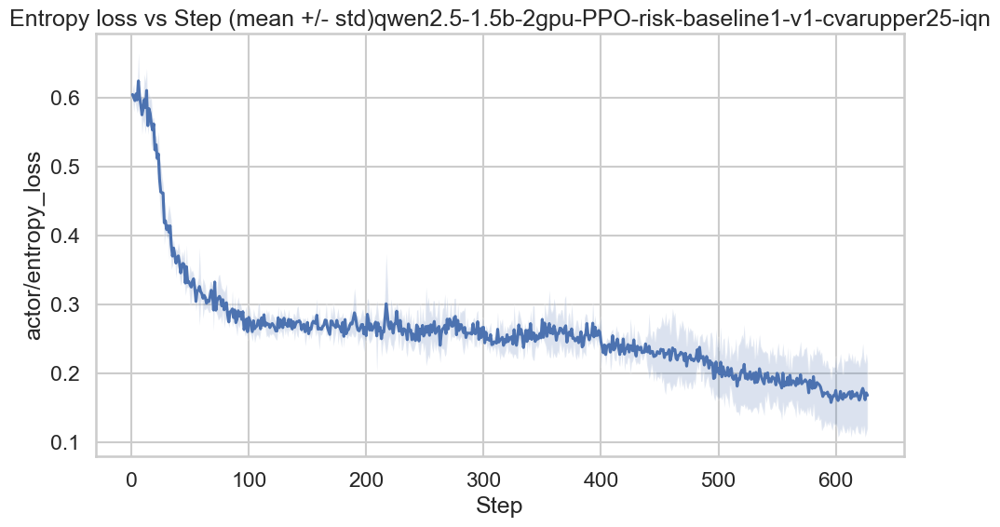

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1.png


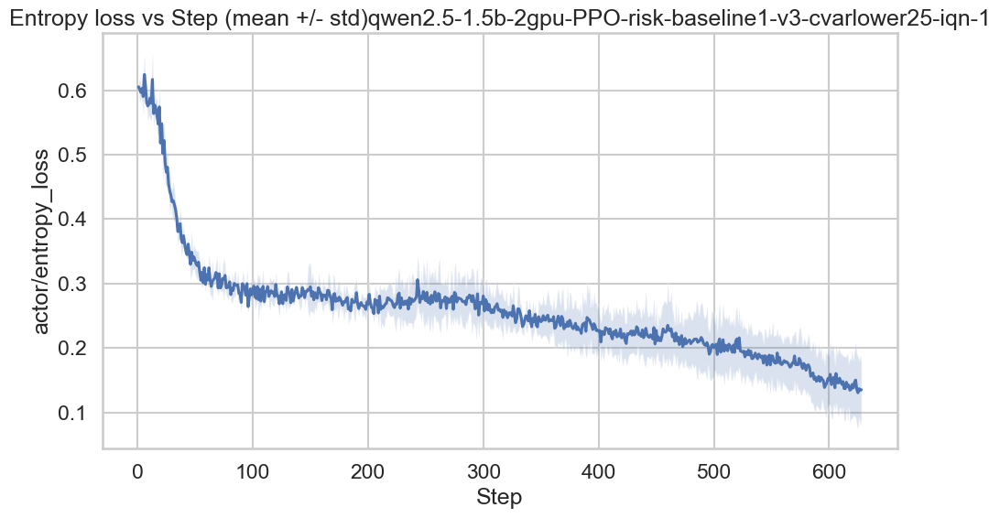

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8.png


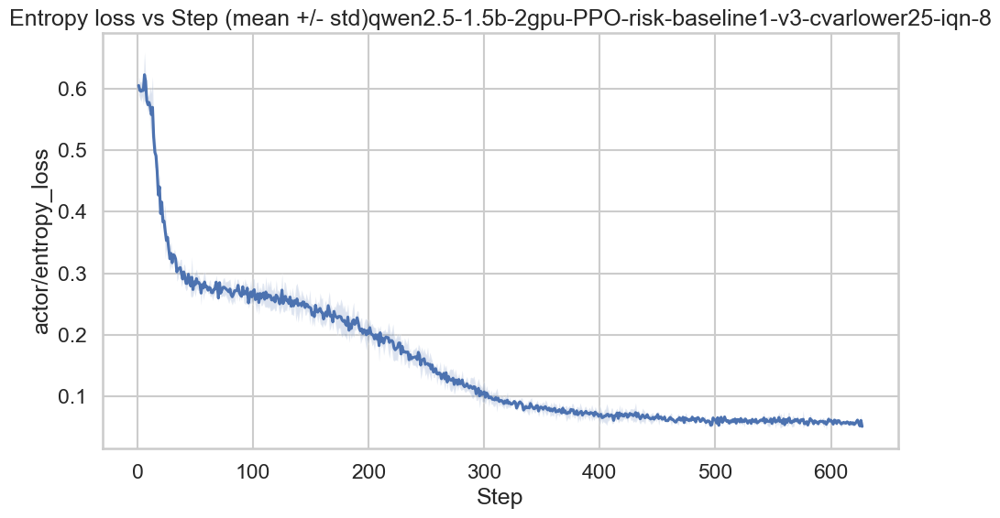

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1.png


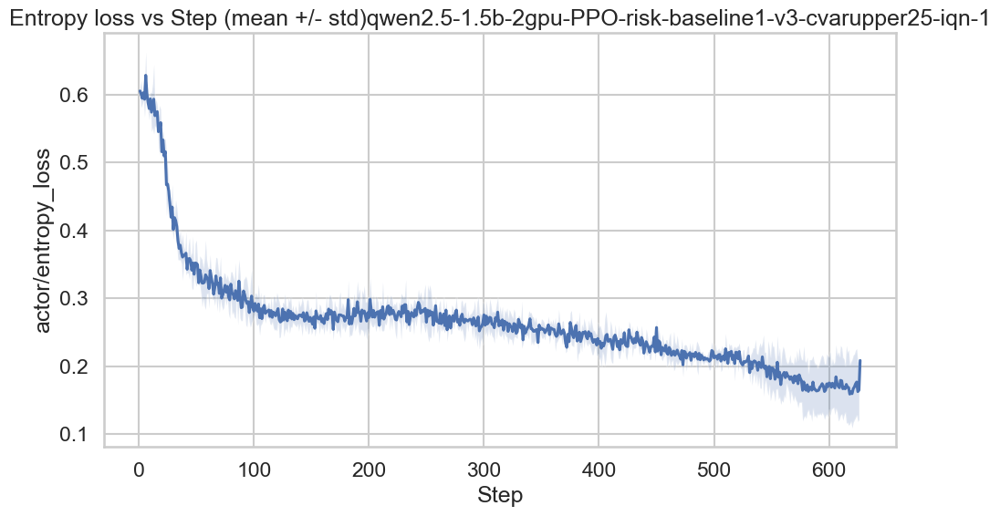

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8.png


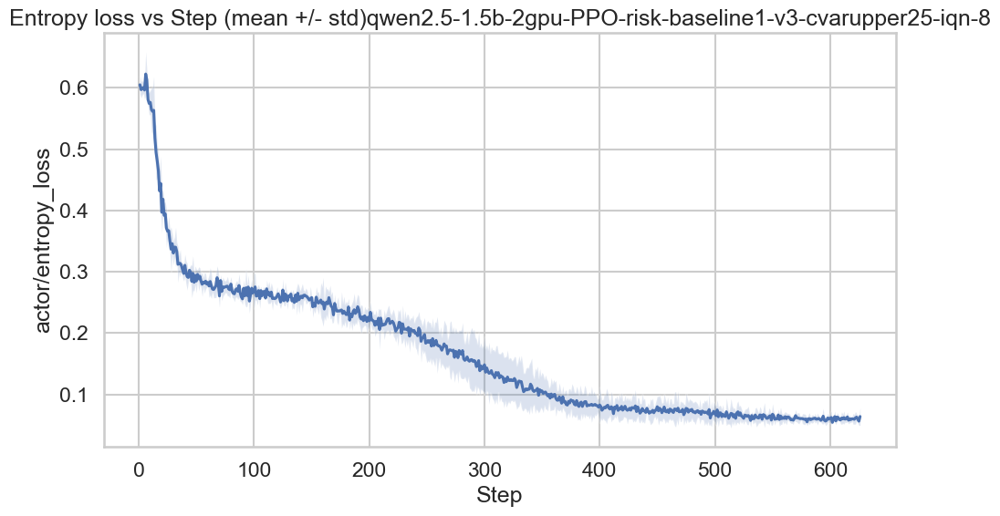

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8.png


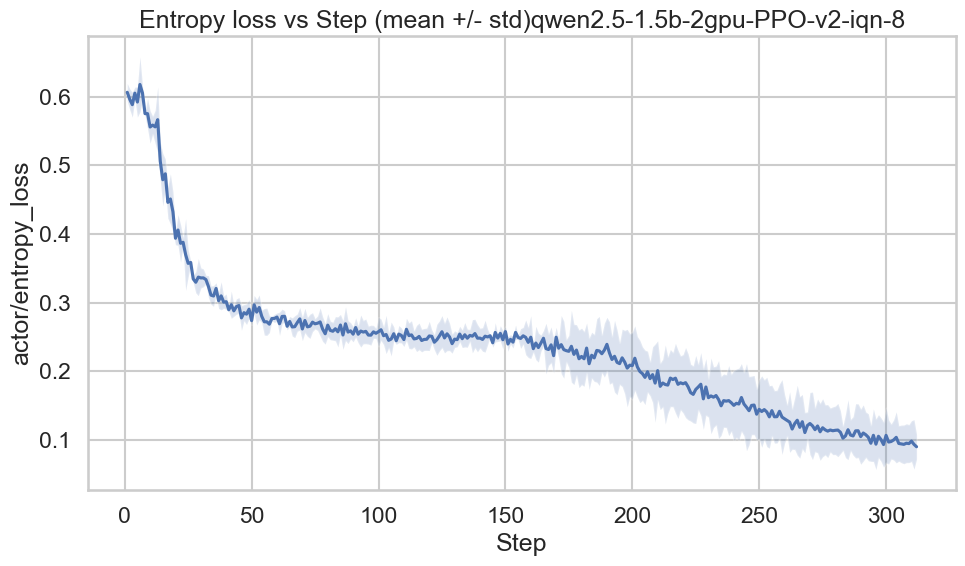

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/entropy_mean_std_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8.png


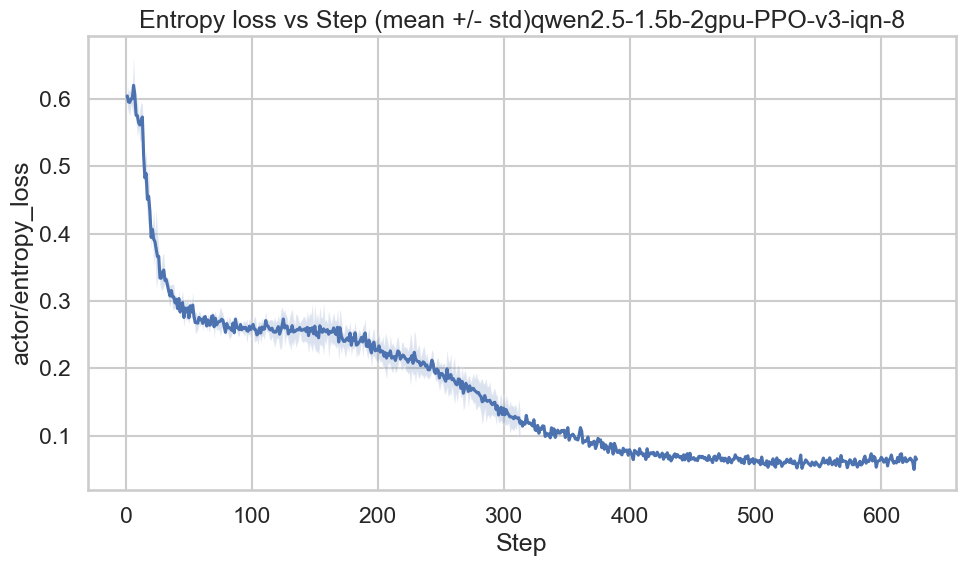

In [ ]:
# Entropy loss mean+std vs step per algorithm
agg_entropy = mean_std(entropy, ["algorithm", "Step"], "actor/entropy_loss")

for algo, df_algo in agg_entropy.groupby("algorithm"):
    plt.figure()
    plt.plot(df_algo["Step"], df_algo["mean"], label=algo)
    plt.fill_between(df_algo["Step"], df_algo["mean"] - df_algo["std"], df_algo["mean"] + df_algo["std"], alpha=0.2)
    plt.title(f"Entropy loss vs Step (mean +/- std){algo}")
    plt.xlabel("Step")
    plt.ylabel("actor/entropy_loss")
    savefig(f"entropy_mean_std_{algo}")

## Entropy loss vs performance (correlation)

We align by (algorithm, seed, step) and compare entropy loss with pass@k/avg@32.


In [ ]:
# Aggregate entropy to match combined granularity (mean per step/seed/algorithm)
entropy_step = entropy.groupby(["algorithm", "seed", "Step"], as_index=False)["actor/entropy_loss"].mean()

merged = combined.merge(entropy_step, on=["algorithm", "seed", "Step"], how="inner")
print("merged rows:", merged.shape)

# Correlation table per algorithm
corr_rows = []
for algo, df_algo in merged.groupby("algorithm"):
    for col in ["avg@32", "pass@1", "pass@8", "pass@32", "pass@128"]:
        if col not in df_algo.columns:
            continue
        corr = df_algo[[col, "actor/entropy_loss"]].corr().iloc[0, 1]
        corr_rows.append({"algorithm": algo, "metric": col, "corr": corr})

corr_df = pd.DataFrame(corr_rows)
if not corr_df.empty:
    corr_df.sort_values(["algorithm", "metric"]).head(20)

merged rows: (1103, 13)


In [ ]:
# Scatter plots: entropy loss vs pass@k (per algorithm)
scatter_metrics = ["avg@32", "pass@1", "pass@32"]
for algo, df_algo in merged.groupby("algorithm"):
    for col in scatter_metrics:
        if col not in df_algo.columns:
            continue
        plt.figure()
        plt.scatter(df_algo["actor/entropy_loss"], df_algo[col], alpha=0.4, s=12)
        plt.title(f"{col} vs entropy loss
{algo}")
        plt.xlabel("actor/entropy_loss")
        plt.ylabel(col)
        savefig(f"entropy_scatter_{col}_{algo}")

SyntaxError: unterminated string literal (detected at line 9) (2482680718.py, line 9)

## Optional: per-step pass@k distribution across seeds

Boxplots show distribution across seeds at selected steps.


saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-GRPO.png


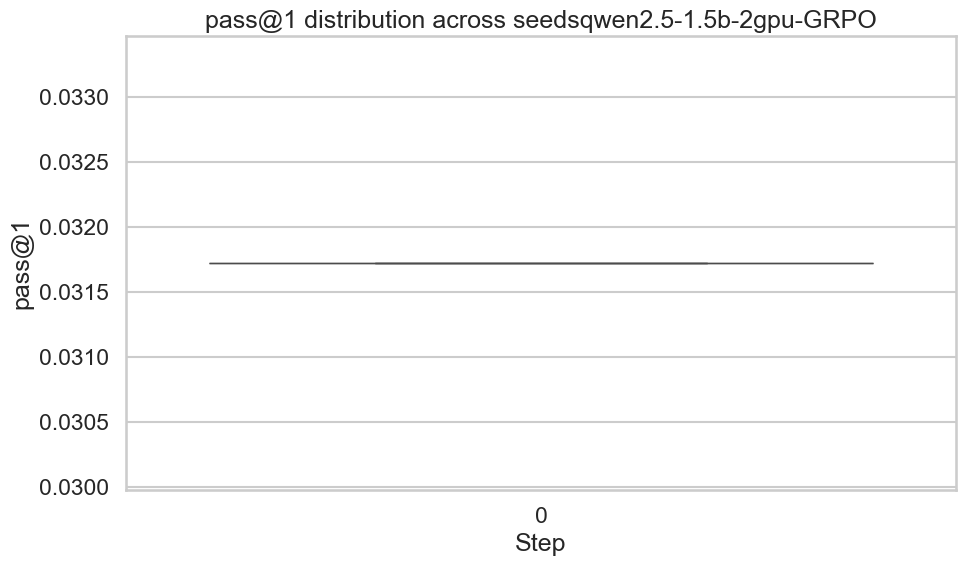

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO.png


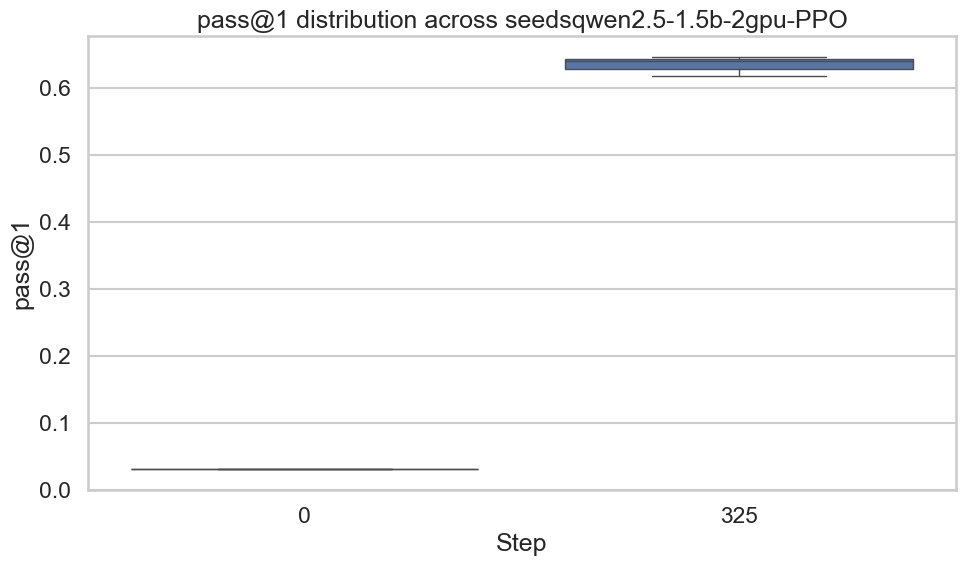

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-2.png


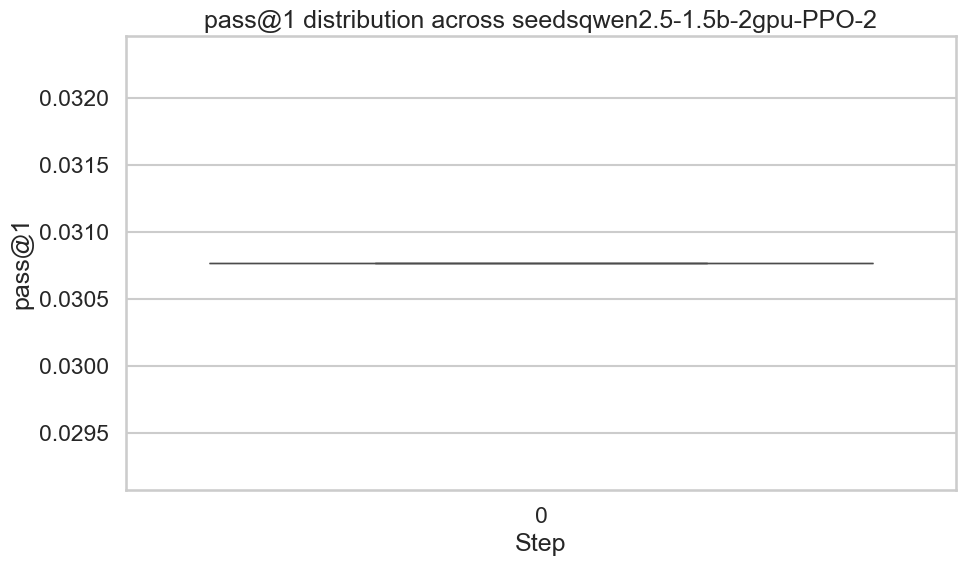

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-8.png


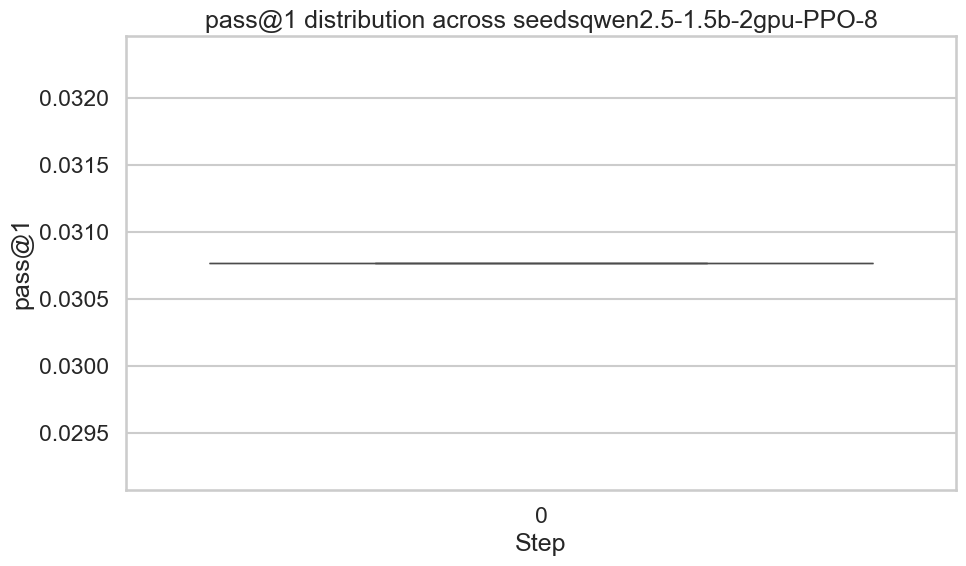

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-C51.png


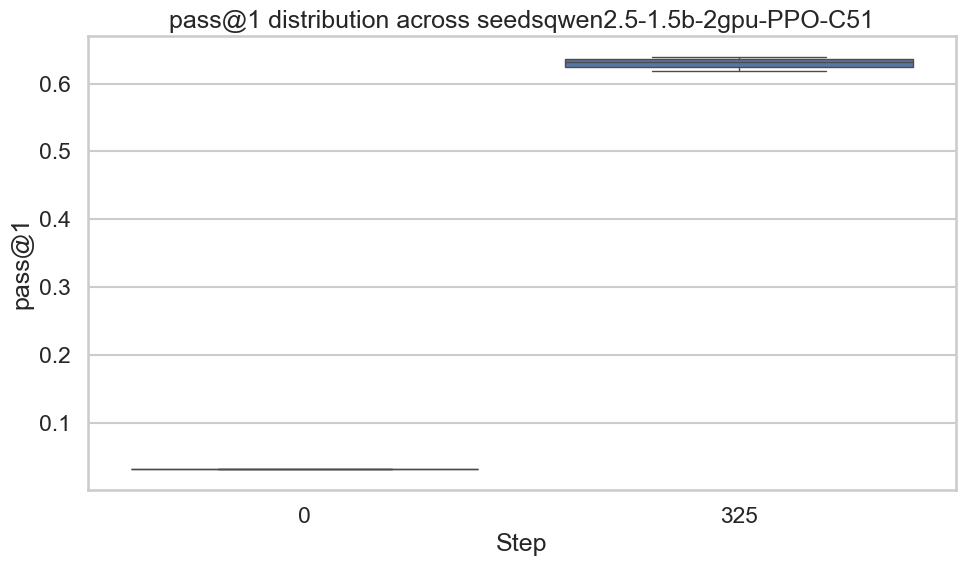

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-QRDQN.png


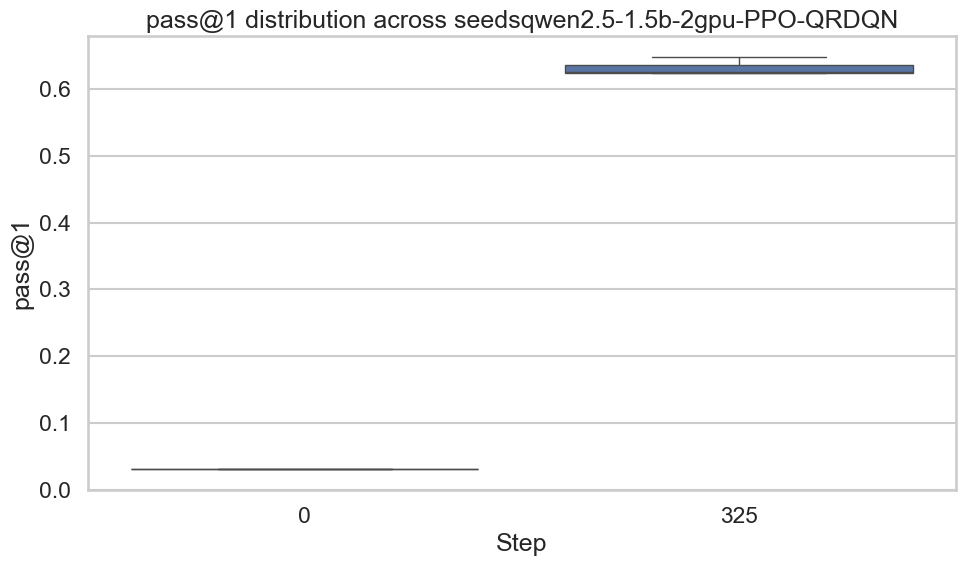

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-iqn.png


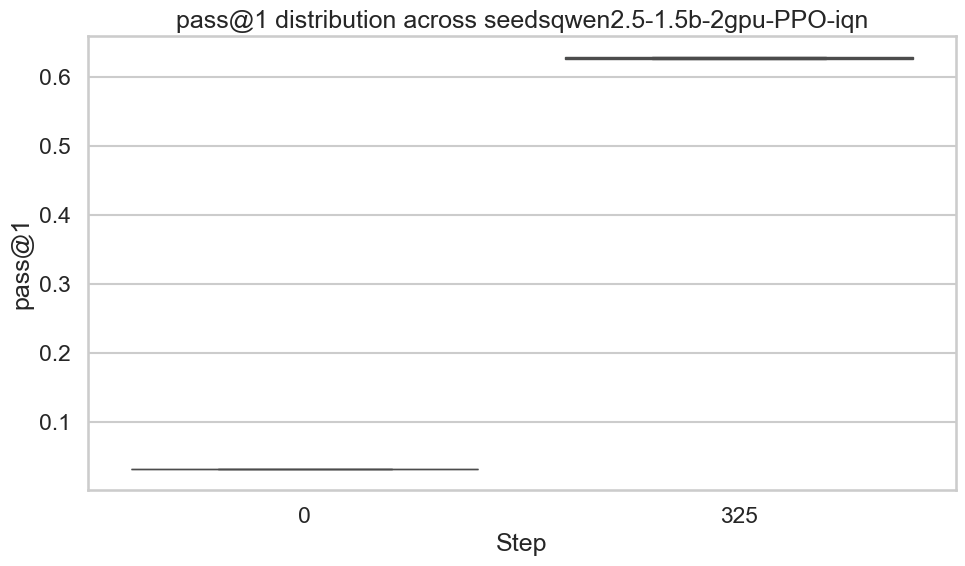

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v1-cvarupper25-iqn-1.png


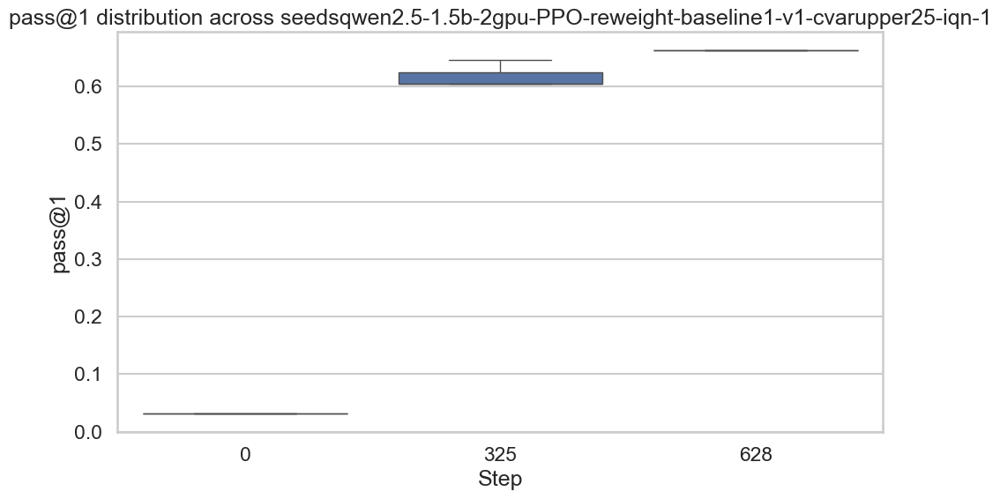

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-1.png


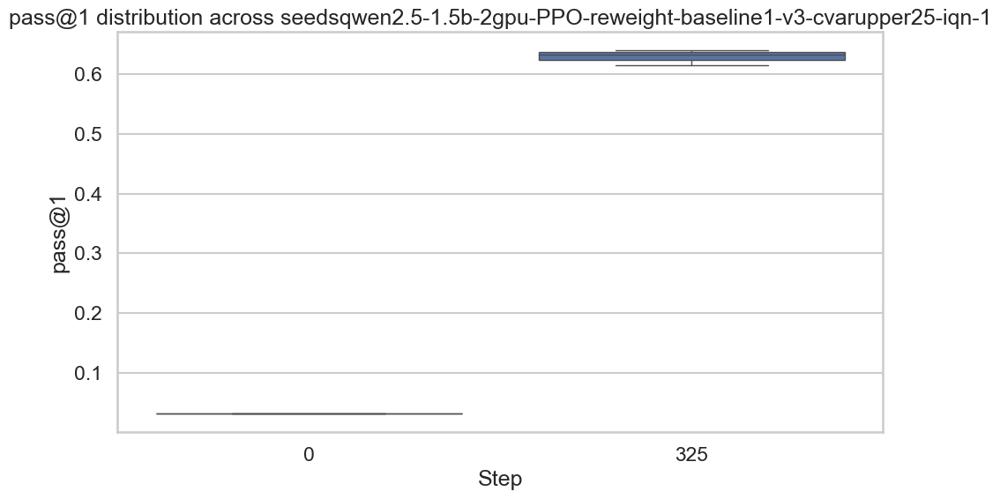

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-reweight-baseline1-v3-cvarupper25-iqn-8.png


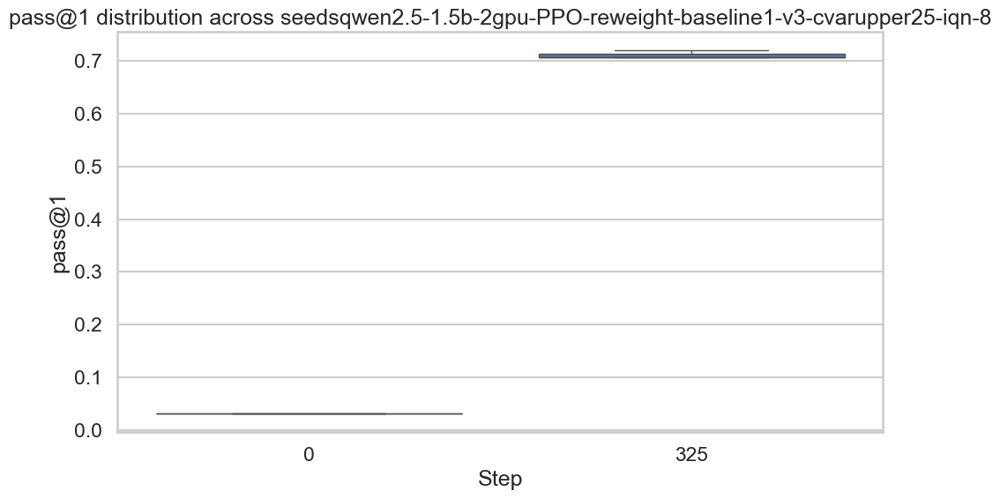

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarlower25-iqn.png


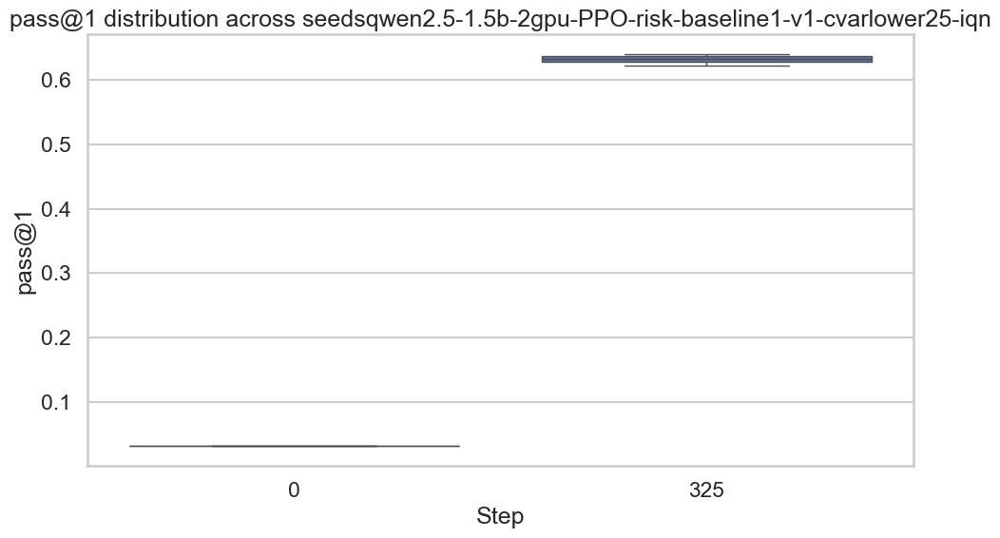

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v1-cvarupper25-iqn.png


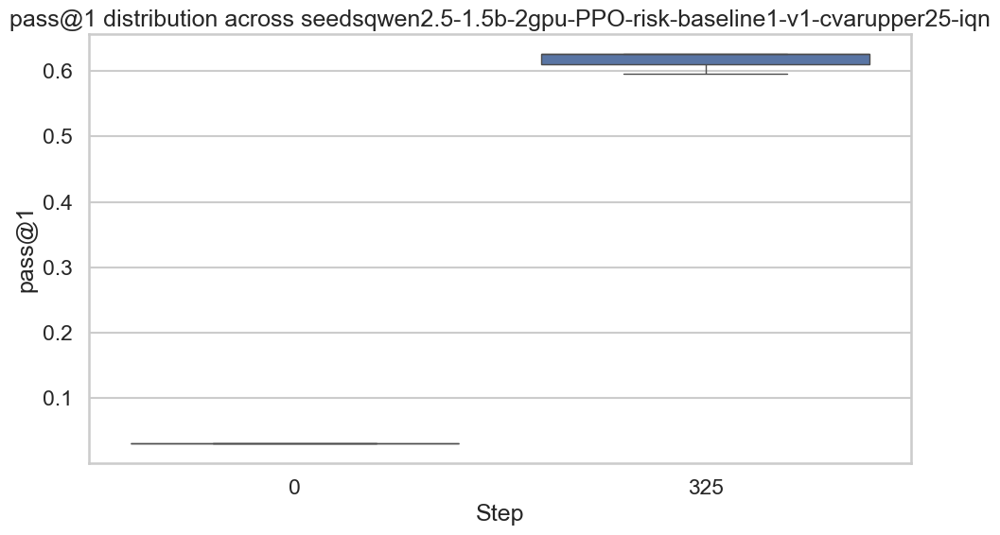

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-1.png


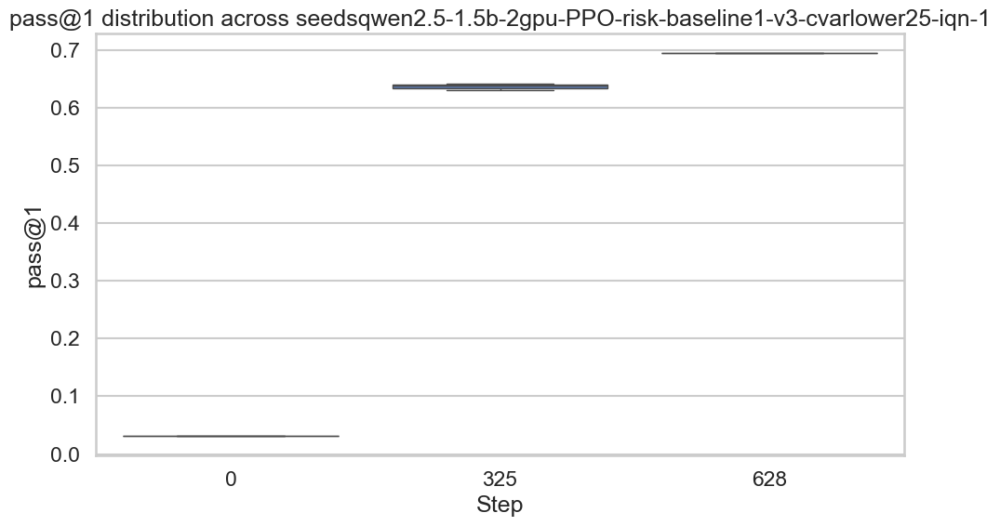

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarlower25-iqn-8.png


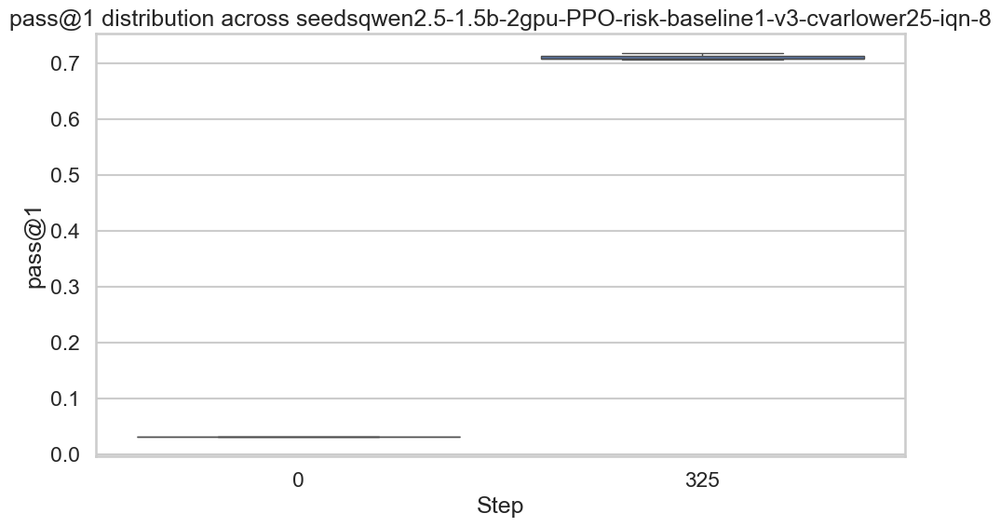

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-1.png


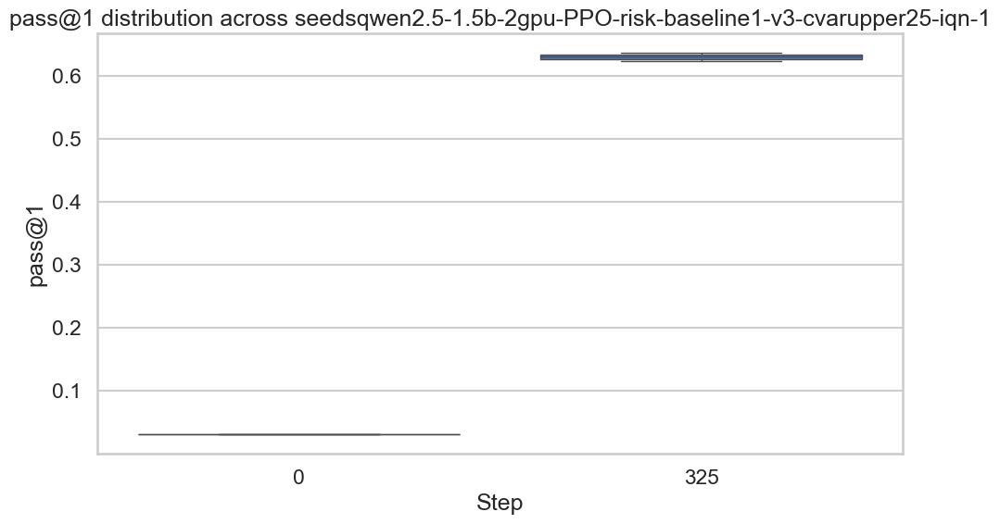

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-risk-baseline1-v3-cvarupper25-iqn-8.png


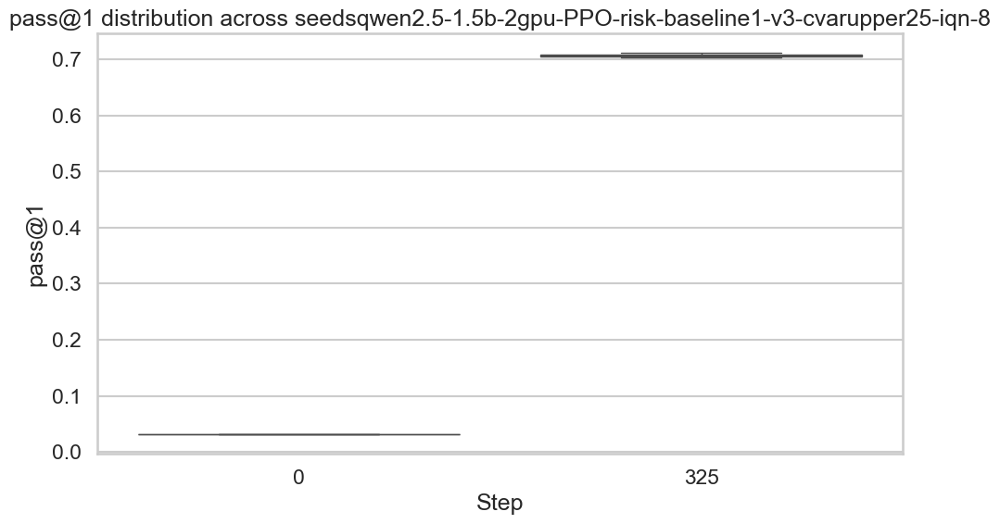

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-v2-iqn-8.png


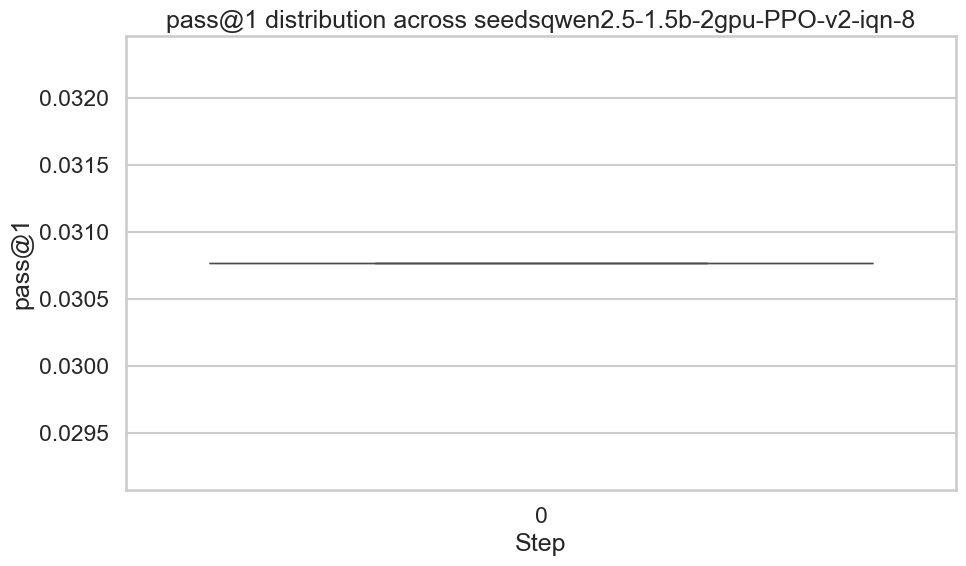

saved: /Users/jinyi/Documents/code/rft/Exploration-my/final_results/figs/paper_analysis/pass1_box_qwen2.5-1.5b-2gpu-PPO-v3-iqn-8.png


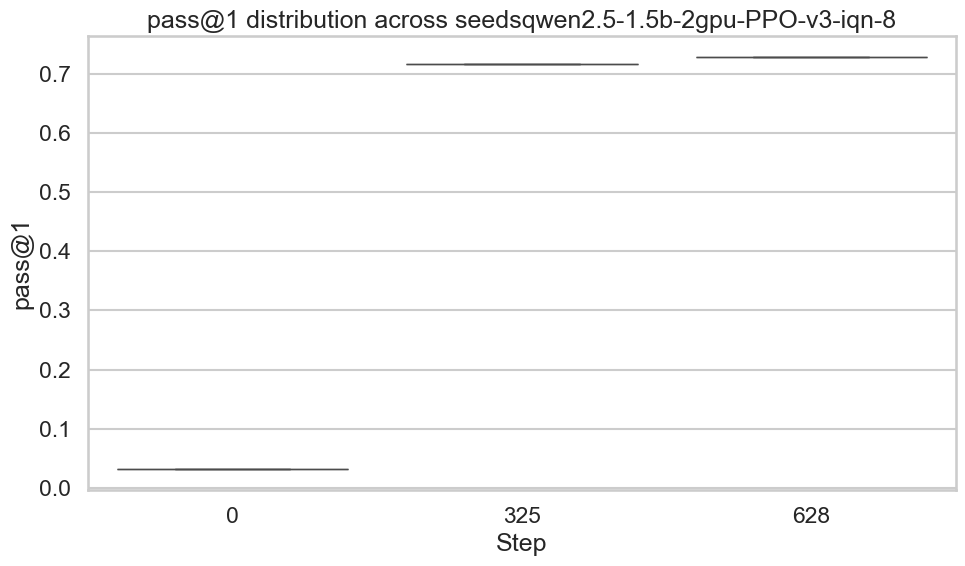

In [ ]:
# Boxplots for pass@1 at selected steps
selected_steps = step_choices
for algo, df_algo in combined.groupby("algorithm"):
    df_sel = df_algo[df_algo["Step"].isin(selected_steps)]
    if df_sel.empty:
        continue
    plt.figure()
    sns.boxplot(data=df_sel, x="Step", y="pass@1")
    plt.title(f"pass@1 distribution across seeds{algo}")
    plt.xlabel("Step")
    plt.ylabel("pass@1")
    savefig(f"pass1_box_{algo}")

## Notes

- All curves are mean over seeds, with std bands where relevant.
- Adjust `selected_k`, `compare_k`, and `selected_steps` to match your paper focus.
- Figures are saved to `final_results/figs/paper_analysis/` by default.
